In [4]:
import scipy
import pickle, random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from time import sleep
from skimage.util import img_as_float
from sklearn.model_selection import train_test_split

import sys
sys.path.append("D:/Dropbox/tome/python/fx")
#import fx

%load_ext autoreload
%autoreload 2
%matplotlib inline

import skimage
from skimage.color import rgb2hsv
from skimage.io import imread
from skimage.io import imsave
import image_analysis as IA


In [1]:
import cv2
fv = "videos/HAHV1.mp4"
vidcap = cv2.VideoCapture(fv)
# success,image = vidcap.read()
# image = convert(image)


def convert(im):
  im = im[...,::-1]
  return img_as_float(im)

def show(image):
  fig,ax = plt.subplots()
  ax.imshow(image)
  # convert from BGR to RGB

In [13]:
success,image = vidcap.read()
image = convert(image)
image = skimage.img_as_ubyte(image)
imsave(f"frames/frame1.jpg" , image) 

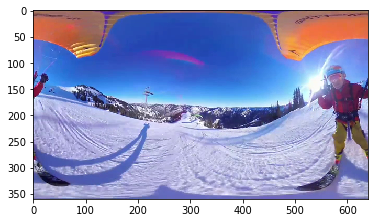

In [10]:
show(image)

In [14]:
import cv2
fv = "videos/HAHV1.mp4"
vidcap = cv2.VideoCapture(fv)


# Dump the entire video to a folder
count = 0
success = True
while success:
  success,image = vidcap.read()
  if image is None:
    break
  image = convert(image)
  image = skimage.img_as_ubyte(image)
  print(count)
  if success:
    imsave(f"frames/frame{count:04}.jpg" , image)     # save frame as JPEG file

  count += 1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

TypeError: 'NoneType' object is not subscriptable

In [37]:
image

array([[[  9, 107, 228],
        [  9, 107, 228],
        [  9, 107, 228],
        ...,
        [  6, 108, 239],
        [  6, 108, 239],
        [  6, 108, 239]],

       [[  9, 107, 228],
        [  9, 107, 228],
        [  9, 107, 228],
        ...,
        [  6, 108, 239],
        [  6, 108, 239],
        [  6, 108, 239]],

       [[ 13, 111, 225],
        [ 13, 111, 225],
        [ 13, 111, 225],
        ...,
        [ 12, 109, 233],
        [ 12, 109, 233],
        [ 12, 109, 233]],

       ...,

       [[214, 171, 174],
        [214, 171, 174],
        [214, 171, 174],
        ...,
        [207, 170, 170],
        [207, 170, 170],
        [207, 170, 170]],

       [[185, 142, 145],
        [185, 142, 145],
        [183, 140, 143],
        ...,
        [171, 134, 134],
        [171, 134, 134],
        [171, 134, 134]],

       [[186, 143, 146],
        [186, 143, 146],
        [187, 144, 147],
        ...,
        [175, 138, 138],
        [175, 138, 138],
        [175, 138, 138]]

In [39]:
image

In [14]:
success,image = vidcap.read()

In [36]:
!mkdir frames

In [35]:
vidcap.get(cv2.CAP_PROP_FPS)


30.0

In [4]:
!pip install opencv-python


In [34]:
go = True
frames = []
f = 0

while(go):
  print(f)

  success,image = vidcap.read()

  f += 1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700


6337
6338
6339
6340
6341
6342
6343
6344
6345
6346
6347
6348
6349
6350
6351
6352
6353
6354
6355
6356
6357
6358
6359
6360
6361
6362
6363
6364
6365
6366
6367
6368
6369
6370
6371
6372
6373
6374
6375
6376
6377
6378
6379
6380
6381
6382
6383
6384
6385
6386
6387
6388
6389
6390
6391
6392
6393
6394
6395
6396
6397
6398
6399
6400
6401
6402
6403
6404
6405
6406
6407
6408
6409
6410
6411
6412
6413
6414
6415
6416
6417
6418
6419
6420
6421
6422
6423
6424
6425
6426
6427
6428
6429
6430
6431
6432
6433
6434
6435
6436
6437
6438
6439
6440
6441
6442
6443
6444
6445
6446
6447
6448
6449
6450
6451
6452
6453
6454
6455
6456
6457
6458
6459
6460
6461
6462
6463
6464
6465
6466
6467
6468
6469
6470
6471
6472
6473
6474
6475
6476
6477
6478
6479
6480
6481
6482
6483
6484
6485
6486
6487
6488
6489
6490
6491
6492
6493
6494
6495
6496
6497
6498
6499
6500
6501
6502
6503
6504
6505
6506
6507
6508
6509
6510
6511
6512
6513
6514
6515
6516
6517
6518
6519
6520
6521
6522
6523
6524
6525
6526
6527
6528
6529
6530
6531
6532
6533
6534
6535
6536


8994
8995
8996
8997
8998
8999
9000
9001
9002
9003
9004
9005
9006
9007
9008
9009
9010
9011
9012
9013
9014
9015
9016
9017
9018
9019
9020
9021
9022
9023
9024
9025
9026
9027
9028
9029
9030
9031
9032
9033
9034
9035
9036
9037
9038
9039
9040
9041
9042
9043
9044
9045
9046
9047
9048
9049
9050
9051
9052
9053
9054
9055
9056
9057
9058
9059
9060
9061
9062
9063
9064
9065
9066
9067
9068
9069
9070
9071
9072
9073
9074
9075
9076
9077
9078
9079
9080
9081
9082
9083
9084
9085
9086
9087
9088
9089
9090
9091
9092
9093
9094
9095
9096
9097
9098
9099
9100
9101
9102
9103
9104
9105
9106
9107
9108
9109
9110
9111
9112
9113
9114
9115
9116
9117
9118
9119
9120
9121
9122
9123
9124
9125
9126
9127
9128
9129
9130
9131
9132
9133
9134
9135
9136
9137
9138
9139
9140
9141
9142
9143
9144
9145
9146
9147
9148
9149
9150
9151
9152
9153
9154
9155
9156
9157
9158
9159
9160
9161
9162
9163
9164
9165
9166
9167
9168
9169
9170
9171
9172
9173
9174
9175
9176
9177
9178
9179
9180
9181
9182
9183
9184
9185
9186
9187
9188
9189
9190
9191
9192
9193


11988
11989
11990
11991
11992
11993
11994
11995
11996
11997
11998
11999
12000
12001
12002
12003
12004
12005
12006
12007
12008
12009
12010
12011
12012
12013
12014
12015
12016
12017
12018
12019
12020
12021
12022
12023
12024
12025
12026
12027
12028
12029
12030
12031
12032
12033
12034
12035
12036
12037
12038
12039
12040
12041
12042
12043
12044
12045
12046
12047
12048
12049
12050
12051
12052
12053
12054
12055
12056
12057
12058
12059
12060
12061
12062
12063
12064
12065
12066
12067
12068
12069
12070
12071
12072
12073
12074
12075
12076
12077
12078
12079
12080
12081
12082
12083
12084
12085
12086
12087
12088
12089
12090
12091
12092
12093
12094
12095
12096
12097
12098
12099
12100
12101
12102
12103
12104
12105
12106
12107
12108
12109
12110
12111
12112
12113
12114
12115
12116
12117
12118
12119
12120
12121
12122
12123
12124
12125
12126
12127
12128
12129
12130
12131
12132
12133
12134
12135
12136
12137
12138
12139
12140
12141
12142
12143
12144
12145
12146
12147
12148
12149
12150
12151
12152
12153
1215

14664
14665
14666
14667
14668
14669
14670
14671
14672
14673
14674
14675
14676
14677
14678
14679
14680
14681
14682
14683
14684
14685
14686
14687
14688
14689
14690
14691
14692
14693
14694
14695
14696
14697
14698
14699
14700
14701
14702
14703
14704
14705
14706
14707
14708
14709
14710
14711
14712
14713
14714
14715
14716
14717
14718
14719
14720
14721
14722
14723
14724
14725
14726
14727
14728
14729
14730
14731
14732
14733
14734
14735
14736
14737
14738
14739
14740
14741
14742
14743
14744
14745
14746
14747
14748
14749
14750
14751
14752
14753
14754
14755
14756
14757
14758
14759
14760
14761
14762
14763
14764
14765
14766
14767
14768
14769
14770
14771
14772
14773
14774
14775
14776
14777
14778
14779
14780
14781
14782
14783
14784
14785
14786
14787
14788
14789
14790
14791
14792
14793
14794
14795
14796
14797
14798
14799
14800
14801
14802
14803
14804
14805
14806
14807
14808
14809
14810
14811
14812
14813
14814
14815
14816
14817
14818
14819
14820
14821
14822
14823
14824
14825
14826
14827
14828
14829
1483

17603
17604
17605
17606
17607
17608
17609
17610
17611
17612
17613
17614
17615
17616
17617
17618
17619
17620
17621
17622
17623
17624
17625
17626
17627
17628
17629
17630
17631
17632
17633
17634
17635
17636
17637
17638
17639
17640
17641
17642
17643
17644
17645
17646
17647
17648
17649
17650
17651
17652
17653
17654
17655
17656
17657
17658
17659
17660
17661
17662
17663
17664
17665
17666
17667
17668
17669
17670
17671
17672
17673
17674
17675
17676
17677
17678
17679
17680
17681
17682
17683
17684
17685
17686
17687
17688
17689
17690
17691
17692
17693
17694
17695
17696
17697
17698
17699
17700
17701
17702
17703
17704
17705
17706
17707
17708
17709
17710
17711
17712
17713
17714
17715
17716
17717
17718
17719
17720
17721
17722
17723
17724
17725
17726
17727
17728
17729
17730
17731
17732
17733
17734
17735
17736
17737
17738
17739
17740
17741
17742
17743
17744
17745
17746
17747
17748
17749
17750
17751
17752
17753
17754
17755
17756
17757
17758
17759
17760
17761
17762
17763
17764
17765
17766
17767
17768
1776

19448
19449
19450
19451
19452
19453
19454
19455
19456
19457
19458
19459
19460
19461
19462
19463
19464
19465
19466
19467
19468
19469
19470
19471
19472
19473
19474
19475
19476
19477
19478
19479
19480
19481
19482
19483
19484
19485
19486
19487
19488
19489
19490
19491
19492
19493
19494
19495
19496
19497
19498
19499
19500
19501
19502
19503
19504
19505
19506
19507
19508
19509
19510
19511
19512
19513
19514
19515
19516
19517
19518
19519
19520
19521
19522
19523
19524
19525
19526
19527
19528
19529
19530
19531
19532
19533
19534
19535
19536
19537
19538
19539
19540
19541
19542
19543
19544
19545
19546
19547
19548
19549
19550
19551
19552
19553
19554
19555
19556
19557
19558
19559
19560
19561
19562
19563
19564
19565
19566
19567
19568
19569
19570
19571
19572
19573
19574
19575
19576
19577
19578
19579
19580
19581
19582
19583
19584
19585
19586
19587
19588
19589
19590
19591
19592
19593
19594
19595
19596
19597
19598
19599
19600
19601
19602
19603
19604
19605
19606
19607
19608
19609
19610
19611
19612
19613
1961

21970
21971
21972
21973
21974
21975
21976
21977
21978
21979
21980
21981
21982
21983
21984
21985
21986
21987
21988
21989
21990
21991
21992
21993
21994
21995
21996
21997
21998
21999
22000
22001
22002
22003
22004
22005
22006
22007
22008
22009
22010
22011
22012
22013
22014
22015
22016
22017
22018
22019
22020
22021
22022
22023
22024
22025
22026
22027
22028
22029
22030
22031
22032
22033
22034
22035
22036
22037
22038
22039
22040
22041
22042
22043
22044
22045
22046
22047
22048
22049
22050
22051
22052
22053
22054
22055
22056
22057
22058
22059
22060
22061
22062
22063
22064
22065
22066
22067
22068
22069
22070
22071
22072
22073
22074
22075
22076
22077
22078
22079
22080
22081
22082
22083
22084
22085
22086
22087
22088
22089
22090
22091
22092
22093
22094
22095
22096
22097
22098
22099
22100
22101
22102
22103
22104
22105
22106
22107
22108
22109
22110
22111
22112
22113
22114
22115
22116
22117
22118
22119
22120
22121
22122
22123
22124
22125
22126
22127
22128
22129
22130
22131
22132
22133
22134
22135
2213

24403
24404
24405
24406
24407
24408
24409
24410
24411
24412
24413
24414
24415
24416
24417
24418
24419
24420
24421
24422
24423
24424
24425
24426
24427
24428
24429
24430
24431
24432
24433
24434
24435
24436
24437
24438
24439
24440
24441
24442
24443
24444
24445
24446
24447
24448
24449
24450
24451
24452
24453
24454
24455
24456
24457
24458
24459
24460
24461
24462
24463
24464
24465
24466
24467
24468
24469
24470
24471
24472
24473
24474
24475
24476
24477
24478
24479
24480
24481
24482
24483
24484
24485
24486
24487
24488
24489
24490
24491
24492
24493
24494
24495
24496
24497
24498
24499
24500
24501
24502
24503
24504
24505
24506
24507
24508
24509
24510
24511
24512
24513
24514
24515
24516
24517
24518
24519
24520
24521
24522
24523
24524
24525
24526
24527
24528
24529
24530
24531
24532
24533
24534
24535
24536
24537
24538
24539
24540
24541
24542
24543
24544
24545
24546
24547
24548
24549
24550
24551
24552
24553
24554
24555
24556
24557
24558
24559
24560
24561
24562
24563
24564
24565
24566
24567
24568
2456

27397
27398
27399
27400
27401
27402
27403
27404
27405
27406
27407
27408
27409
27410
27411
27412
27413
27414
27415
27416
27417
27418
27419
27420
27421
27422
27423
27424
27425
27426
27427
27428
27429
27430
27431
27432
27433
27434
27435
27436
27437
27438
27439
27440
27441
27442
27443
27444
27445
27446
27447
27448
27449
27450
27451
27452
27453
27454
27455
27456
27457
27458
27459
27460
27461
27462
27463
27464
27465
27466
27467
27468
27469
27470
27471
27472
27473
27474
27475
27476
27477
27478
27479
27480
27481
27482
27483
27484
27485
27486
27487
27488
27489
27490
27491
27492
27493
27494
27495
27496
27497
27498
27499
27500
27501
27502
27503
27504
27505
27506
27507
27508
27509
27510
27511
27512
27513
27514
27515
27516
27517
27518
27519
27520
27521
27522
27523
27524
27525
27526
27527
27528
27529
27530
27531
27532
27533
27534
27535
27536
27537
27538
27539
27540
27541
27542
27543
27544
27545
27546
27547
27548
27549
27550
27551
27552
27553
27554
27555
27556
27557
27558
27559
27560
27561
27562
2756

30311
30312
30313
30314
30315
30316
30317
30318
30319
30320
30321
30322
30323
30324
30325
30326
30327
30328
30329
30330
30331
30332
30333
30334
30335
30336
30337
30338
30339
30340
30341
30342
30343
30344
30345
30346
30347
30348
30349
30350
30351
30352
30353
30354
30355
30356
30357
30358
30359
30360
30361
30362
30363
30364
30365
30366
30367
30368
30369
30370
30371
30372
30373
30374
30375
30376
30377
30378
30379
30380
30381
30382
30383
30384
30385
30386
30387
30388
30389
30390
30391
30392
30393
30394
30395
30396
30397
30398
30399
30400
30401
30402
30403
30404
30405
30406
30407
30408
30409
30410
30411
30412
30413
30414
30415
30416
30417
30418
30419
30420
30421
30422
30423
30424
30425
30426
30427
30428
30429
30430
30431
30432
30433
30434
30435
30436
30437
30438
30439
30440
30441
30442
30443
30444
30445
30446
30447
30448
30449
30450
30451
30452
30453
30454
30455
30456
30457
30458
30459
30460
30461
30462
30463
30464
30465
30466
30467
30468
30469
30470
30471
30472
30473
30474
30475
30476
3047

31779
31780
31781
31782
31783
31784
31785
31786
31787
31788
31789
31790
31791
31792
31793
31794
31795
31796
31797
31798
31799
31800
31801
31802
31803
31804
31805
31806
31807
31808
31809
31810
31811
31812
31813
31814
31815
31816
31817
31818
31819
31820
31821
31822
31823
31824
31825
31826
31827
31828
31829
31830
31831
31832
31833
31834
31835
31836
31837
31838
31839
31840
31841
31842
31843
31844
31845
31846
31847
31848
31849
31850
31851
31852
31853
31854
31855
31856
31857
31858
31859
31860
31861
31862
31863
31864
31865
31866
31867
31868
31869
31870
31871
31872
31873
31874
31875
31876
31877
31878
31879
31880
31881
31882
31883
31884
31885
31886
31887
31888
31889
31890
31891
31892
31893
31894
31895
31896
31897
31898
31899
31900
31901
31902
31903
31904
31905
31906
31907
31908
31909
31910
31911
31912
31913
31914
31915
31916
31917
31918
31919
31920
31921
31922
31923
31924
31925
31926
31927
31928
31929
31930
31931
31932
31933
31934
31935
31936
31937
31938
31939
31940
31941
31942
31943
31944
3194

33410
33411
33412
33413
33414
33415
33416
33417
33418
33419
33420
33421
33422
33423
33424
33425
33426
33427
33428
33429
33430
33431
33432
33433
33434
33435
33436
33437
33438
33439
33440
33441
33442
33443
33444
33445
33446
33447
33448
33449
33450
33451
33452
33453
33454
33455
33456
33457
33458
33459
33460
33461
33462
33463
33464
33465
33466
33467
33468
33469
33470
33471
33472
33473
33474
33475
33476
33477
33478
33479
33480
33481
33482
33483
33484
33485
33486
33487
33488
33489
33490
33491
33492
33493
33494
33495
33496
33497
33498
33499
33500
33501
33502
33503
33504
33505
33506
33507
33508
33509
33510
33511
33512
33513
33514
33515
33516
33517
33518
33519
33520
33521
33522
33523
33524
33525
33526
33527
33528
33529
33530
33531
33532
33533
33534
33535
33536
33537
33538
33539
33540
33541
33542
33543
33544
33545
33546
33547
33548
33549
33550
33551
33552
33553
33554
33555
33556
33557
33558
33559
33560
33561
33562
33563
33564
33565
33566
33567
33568
33569
33570
33571
33572
33573
33574
33575
3357

36056
36057
36058
36059
36060
36061
36062
36063
36064
36065
36066
36067
36068
36069
36070
36071
36072
36073
36074
36075
36076
36077
36078
36079
36080
36081
36082
36083
36084
36085
36086
36087
36088
36089
36090
36091
36092
36093
36094
36095
36096
36097
36098
36099
36100
36101
36102
36103
36104
36105
36106
36107
36108
36109
36110
36111
36112
36113
36114
36115
36116
36117
36118
36119
36120
36121
36122
36123
36124
36125
36126
36127
36128
36129
36130
36131
36132
36133
36134
36135
36136
36137
36138
36139
36140
36141
36142
36143
36144
36145
36146
36147
36148
36149
36150
36151
36152
36153
36154
36155
36156
36157
36158
36159
36160
36161
36162
36163
36164
36165
36166
36167
36168
36169
36170
36171
36172
36173
36174
36175
36176
36177
36178
36179
36180
36181
36182
36183
36184
36185
36186
36187
36188
36189
36190
36191
36192
36193
36194
36195
36196
36197
36198
36199
36200
36201
36202
36203
36204
36205
36206
36207
36208
36209
36210
36211
36212
36213
36214
36215
36216
36217
36218
36219
36220
36221
3622

37526
37527
37528
37529
37530
37531
37532
37533
37534
37535
37536
37537
37538
37539
37540
37541
37542
37543
37544
37545
37546
37547
37548
37549
37550
37551
37552
37553
37554
37555
37556
37557
37558
37559
37560
37561
37562
37563
37564
37565
37566
37567
37568
37569
37570
37571
37572
37573
37574
37575
37576
37577
37578
37579
37580
37581
37582
37583
37584
37585
37586
37587
37588
37589
37590
37591
37592
37593
37594
37595
37596
37597
37598
37599
37600
37601
37602
37603
37604
37605
37606
37607
37608
37609
37610
37611
37612
37613
37614
37615
37616
37617
37618
37619
37620
37621
37622
37623
37624
37625
37626
37627
37628
37629
37630
37631
37632
37633
37634
37635
37636
37637
37638
37639
37640
37641
37642
37643
37644
37645
37646
37647
37648
37649
37650
37651
37652
37653
37654
37655
37656
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37682
37683
37684
37685
37686
37687
37688
37689
37690
37691
3769

39393
39394
39395
39396
39397
39398
39399
39400
39401
39402
39403
39404
39405
39406
39407
39408
39409
39410
39411
39412
39413
39414
39415
39416
39417
39418
39419
39420
39421
39422
39423
39424
39425
39426
39427
39428
39429
39430
39431
39432
39433
39434
39435
39436
39437
39438
39439
39440
39441
39442
39443
39444
39445
39446
39447
39448
39449
39450
39451
39452
39453
39454
39455
39456
39457
39458
39459
39460
39461
39462
39463
39464
39465
39466
39467
39468
39469
39470
39471
39472
39473
39474
39475
39476
39477
39478
39479
39480
39481
39482
39483
39484
39485
39486
39487
39488
39489
39490
39491
39492
39493
39494
39495
39496
39497
39498
39499
39500
39501
39502
39503
39504
39505
39506
39507
39508
39509
39510
39511
39512
39513
39514
39515
39516
39517
39518
39519
39520
39521
39522
39523
39524
39525
39526
39527
39528
39529
39530
39531
39532
39533
39534
39535
39536
39537
39538
39539
39540
39541
39542
39543
39544
39545
39546
39547
39548
39549
39550
39551
39552
39553
39554
39555
39556
39557
39558
3955

42266
42267
42268
42269
42270
42271
42272
42273
42274
42275
42276
42277
42278
42279
42280
42281
42282
42283
42284
42285
42286
42287
42288
42289
42290
42291
42292
42293
42294
42295
42296
42297
42298
42299
42300
42301
42302
42303
42304
42305
42306
42307
42308
42309
42310
42311
42312
42313
42314
42315
42316
42317
42318
42319
42320
42321
42322
42323
42324
42325
42326
42327
42328
42329
42330
42331
42332
42333
42334
42335
42336
42337
42338
42339
42340
42341
42342
42343
42344
42345
42346
42347
42348
42349
42350
42351
42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376
42377
42378
42379
42380
42381
42382
42383
42384
42385
42386
42387
42388
42389
42390
42391
42392
42393
42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
4243

45091
45092
45093
45094
45095
45096
45097
45098
45099
45100
45101
45102
45103
45104
45105
45106
45107
45108
45109
45110
45111
45112
45113
45114
45115
45116
45117
45118
45119
45120
45121
45122
45123
45124
45125
45126
45127
45128
45129
45130
45131
45132
45133
45134
45135
45136
45137
45138
45139
45140
45141
45142
45143
45144
45145
45146
45147
45148
45149
45150
45151
45152
45153
45154
45155
45156
45157
45158
45159
45160
45161
45162
45163
45164
45165
45166
45167
45168
45169
45170
45171
45172
45173
45174
45175
45176
45177
45178
45179
45180
45181
45182
45183
45184
45185
45186
45187
45188
45189
45190
45191
45192
45193
45194
45195
45196
45197
45198
45199
45200
45201
45202
45203
45204
45205
45206
45207
45208
45209
45210
45211
45212
45213
45214
45215
45216
45217
45218
45219
45220
45221
45222
45223
45224
45225
45226
45227
45228
45229
45230
45231
45232
45233
45234
45235
45236
45237
45238
45239
45240
45241
45242
45243
45244
45245
45246
45247
45248
45249
45250
45251
45252
45253
45254
45255
45256
4525

46531
46532
46533
46534
46535
46536
46537
46538
46539
46540
46541
46542
46543
46544
46545
46546
46547
46548
46549
46550
46551
46552
46553
46554
46555
46556
46557
46558
46559
46560
46561
46562
46563
46564
46565
46566
46567
46568
46569
46570
46571
46572
46573
46574
46575
46576
46577
46578
46579
46580
46581
46582
46583
46584
46585
46586
46587
46588
46589
46590
46591
46592
46593
46594
46595
46596
46597
46598
46599
46600
46601
46602
46603
46604
46605
46606
46607
46608
46609
46610
46611
46612
46613
46614
46615
46616
46617
46618
46619
46620
46621
46622
46623
46624
46625
46626
46627
46628
46629
46630
46631
46632
46633
46634
46635
46636
46637
46638
46639
46640
46641
46642
46643
46644
46645
46646
46647
46648
46649
46650
46651
46652
46653
46654
46655
46656
46657
46658
46659
46660
46661
46662
46663
46664
46665
46666
46667
46668
46669
46670
46671
46672
46673
46674
46675
46676
46677
46678
46679
46680
46681
46682
46683
46684
46685
46686
46687
46688
46689
46690
46691
46692
46693
46694
46695
46696
4669

48207
48208
48209
48210
48211
48212
48213
48214
48215
48216
48217
48218
48219
48220
48221
48222
48223
48224
48225
48226
48227
48228
48229
48230
48231
48232
48233
48234
48235
48236
48237
48238
48239
48240
48241
48242
48243
48244
48245
48246
48247
48248
48249
48250
48251
48252
48253
48254
48255
48256
48257
48258
48259
48260
48261
48262
48263
48264
48265
48266
48267
48268
48269
48270
48271
48272
48273
48274
48275
48276
48277
48278
48279
48280
48281
48282
48283
48284
48285
48286
48287
48288
48289
48290
48291
48292
48293
48294
48295
48296
48297
48298
48299
48300
48301
48302
48303
48304
48305
48306
48307
48308
48309
48310
48311
48312
48313
48314
48315
48316
48317
48318
48319
48320
48321
48322
48323
48324
48325
48326
48327
48328
48329
48330
48331
48332
48333
48334
48335
48336
48337
48338
48339
48340
48341
48342
48343
48344
48345
48346
48347
48348
48349
48350
48351
48352
48353
48354
48355
48356
48357
48358
48359
48360
48361
48362
48363
48364
48365
48366
48367
48368
48369
48370
48371
48372
4837

51084
51085
51086
51087
51088
51089
51090
51091
51092
51093
51094
51095
51096
51097
51098
51099
51100
51101
51102
51103
51104
51105
51106
51107
51108
51109
51110
51111
51112
51113
51114
51115
51116
51117
51118
51119
51120
51121
51122
51123
51124
51125
51126
51127
51128
51129
51130
51131
51132
51133
51134
51135
51136
51137
51138
51139
51140
51141
51142
51143
51144
51145
51146
51147
51148
51149
51150
51151
51152
51153
51154
51155
51156
51157
51158
51159
51160
51161
51162
51163
51164
51165
51166
51167
51168
51169
51170
51171
51172
51173
51174
51175
51176
51177
51178
51179
51180
51181
51182
51183
51184
51185
51186
51187
51188
51189
51190
51191
51192
51193
51194
51195
51196
51197
51198
51199
51200
51201
51202
51203
51204
51205
51206
51207
51208
51209
51210
51211
51212
51213
51214
51215
51216
51217
51218
51219
51220
51221
51222
51223
51224
51225
51226
51227
51228
51229
51230
51231
51232
51233
51234
51235
51236
51237
51238
51239
51240
51241
51242
51243
51244
51245
51246
51247
51248
51249
5125

54095
54096
54097
54098
54099
54100
54101
54102
54103
54104
54105
54106
54107
54108
54109
54110
54111
54112
54113
54114
54115
54116
54117
54118
54119
54120
54121
54122
54123
54124
54125
54126
54127
54128
54129
54130
54131
54132
54133
54134
54135
54136
54137
54138
54139
54140
54141
54142
54143
54144
54145
54146
54147
54148
54149
54150
54151
54152
54153
54154
54155
54156
54157
54158
54159
54160
54161
54162
54163
54164
54165
54166
54167
54168
54169
54170
54171
54172
54173
54174
54175
54176
54177
54178
54179
54180
54181
54182
54183
54184
54185
54186
54187
54188
54189
54190
54191
54192
54193
54194
54195
54196
54197
54198
54199
54200
54201
54202
54203
54204
54205
54206
54207
54208
54209
54210
54211
54212
54213
54214
54215
54216
54217
54218
54219
54220
54221
54222
54223
54224
54225
54226
54227
54228
54229
54230
54231
54232
54233
54234
54235
54236
54237
54238
54239
54240
54241
54242
54243
54244
54245
54246
54247
54248
54249
54250
54251
54252
54253
54254
54255
54256
54257
54258
54259
54260
5426

57034
57035
57036
57037
57038
57039
57040
57041
57042
57043
57044
57045
57046
57047
57048
57049
57050
57051
57052
57053
57054
57055
57056
57057
57058
57059
57060
57061
57062
57063
57064
57065
57066
57067
57068
57069
57070
57071
57072
57073
57074
57075
57076
57077
57078
57079
57080
57081
57082
57083
57084
57085
57086
57087
57088
57089
57090
57091
57092
57093
57094
57095
57096
57097
57098
57099
57100
57101
57102
57103
57104
57105
57106
57107
57108
57109
57110
57111
57112
57113
57114
57115
57116
57117
57118
57119
57120
57121
57122
57123
57124
57125
57126
57127
57128
57129
57130
57131
57132
57133
57134
57135
57136
57137
57138
57139
57140
57141
57142
57143
57144
57145
57146
57147
57148
57149
57150
57151
57152
57153
57154
57155
57156
57157
57158
57159
57160
57161
57162
57163
57164
57165
57166
57167
57168
57169
57170
57171
57172
57173
57174
57175
57176
57177
57178
57179
57180
57181
57182
57183
57184
57185
57186
57187
57188
57189
57190
57191
57192
57193
57194
57195
57196
57197
57198
57199
5720

58516
58517
58518
58519
58520
58521
58522
58523
58524
58525
58526
58527
58528
58529
58530
58531
58532
58533
58534
58535
58536
58537
58538
58539
58540
58541
58542
58543
58544
58545
58546
58547
58548
58549
58550
58551
58552
58553
58554
58555
58556
58557
58558
58559
58560
58561
58562
58563
58564
58565
58566
58567
58568
58569
58570
58571
58572
58573
58574
58575
58576
58577
58578
58579
58580
58581
58582
58583
58584
58585
58586
58587
58588
58589
58590
58591
58592
58593
58594
58595
58596
58597
58598
58599
58600
58601
58602
58603
58604
58605
58606
58607
58608
58609
58610
58611
58612
58613
58614
58615
58616
58617
58618
58619
58620
58621
58622
58623
58624
58625
58626
58627
58628
58629
58630
58631
58632
58633
58634
58635
58636
58637
58638
58639
58640
58641
58642
58643
58644
58645
58646
58647
58648
58649
58650
58651
58652
58653
58654
58655
58656
58657
58658
58659
58660
58661
58662
58663
58664
58665
58666
58667
58668
58669
58670
58671
58672
58673
58674
58675
58676
58677
58678
58679
58680
58681
5868

60256
60257
60258
60259
60260
60261
60262
60263
60264
60265
60266
60267
60268
60269
60270
60271
60272
60273
60274
60275
60276
60277
60278
60279
60280
60281
60282
60283
60284
60285
60286
60287
60288
60289
60290
60291
60292
60293
60294
60295
60296
60297
60298
60299
60300
60301
60302
60303
60304
60305
60306
60307
60308
60309
60310
60311
60312
60313
60314
60315
60316
60317
60318
60319
60320
60321
60322
60323
60324
60325
60326
60327
60328
60329
60330
60331
60332
60333
60334
60335
60336
60337
60338
60339
60340
60341
60342
60343
60344
60345
60346
60347
60348
60349
60350
60351
60352
60353
60354
60355
60356
60357
60358
60359
60360
60361
60362
60363
60364
60365
60366
60367
60368
60369
60370
60371
60372
60373
60374
60375
60376
60377
60378
60379
60380
60381
60382
60383
60384
60385
60386
60387
60388
60389
60390
60391
60392
60393
60394
60395
60396
60397
60398
60399
60400
60401
60402
60403
60404
60405
60406
60407
60408
60409
60410
60411
60412
60413
60414
60415
60416
60417
60418
60419
60420
60421
6042

61759
61760
61761
61762
61763
61764
61765
61766
61767
61768
61769
61770
61771
61772
61773
61774
61775
61776
61777
61778
61779
61780
61781
61782
61783
61784
61785
61786
61787
61788
61789
61790
61791
61792
61793
61794
61795
61796
61797
61798
61799
61800
61801
61802
61803
61804
61805
61806
61807
61808
61809
61810
61811
61812
61813
61814
61815
61816
61817
61818
61819
61820
61821
61822
61823
61824
61825
61826
61827
61828
61829
61830
61831
61832
61833
61834
61835
61836
61837
61838
61839
61840
61841
61842
61843
61844
61845
61846
61847
61848
61849
61850
61851
61852
61853
61854
61855
61856
61857
61858
61859
61860
61861
61862
61863
61864
61865
61866
61867
61868
61869
61870
61871
61872
61873
61874
61875
61876
61877
61878
61879
61880
61881
61882
61883
61884
61885
61886
61887
61888
61889
61890
61891
61892
61893
61894
61895
61896
61897
61898
61899
61900
61901
61902
61903
61904
61905
61906
61907
61908
61909
61910
61911
61912
61913
61914
61915
61916
61917
61918
61919
61920
61921
61922
61923
61924
6192

63537
63538
63539
63540
63541
63542
63543
63544
63545
63546
63547
63548
63549
63550
63551
63552
63553
63554
63555
63556
63557
63558
63559
63560
63561
63562
63563
63564
63565
63566
63567
63568
63569
63570
63571
63572
63573
63574
63575
63576
63577
63578
63579
63580
63581
63582
63583
63584
63585
63586
63587
63588
63589
63590
63591
63592
63593
63594
63595
63596
63597
63598
63599
63600
63601
63602
63603
63604
63605
63606
63607
63608
63609
63610
63611
63612
63613
63614
63615
63616
63617
63618
63619
63620
63621
63622
63623
63624
63625
63626
63627
63628
63629
63630
63631
63632
63633
63634
63635
63636
63637
63638
63639
63640
63641
63642
63643
63644
63645
63646
63647
63648
63649
63650
63651
63652
63653
63654
63655
63656
63657
63658
63659
63660
63661
63662
63663
63664
63665
63666
63667
63668
63669
63670
63671
63672
63673
63674
63675
63676
63677
63678
63679
63680
63681
63682
63683
63684
63685
63686
63687
63688
63689
63690
63691
63692
63693
63694
63695
63696
63697
63698
63699
63700
63701
63702
6370

64958
64959
64960
64961
64962
64963
64964
64965
64966
64967
64968
64969
64970
64971
64972
64973
64974
64975
64976
64977
64978
64979
64980
64981
64982
64983
64984
64985
64986
64987
64988
64989
64990
64991
64992
64993
64994
64995
64996
64997
64998
64999
65000
65001
65002
65003
65004
65005
65006
65007
65008
65009
65010
65011
65012
65013
65014
65015
65016
65017
65018
65019
65020
65021
65022
65023
65024
65025
65026
65027
65028
65029
65030
65031
65032
65033
65034
65035
65036
65037
65038
65039
65040
65041
65042
65043
65044
65045
65046
65047
65048
65049
65050
65051
65052
65053
65054
65055
65056
65057
65058
65059
65060
65061
65062
65063
65064
65065
65066
65067
65068
65069
65070
65071
65072
65073
65074
65075
65076
65077
65078
65079
65080
65081
65082
65083
65084
65085
65086
65087
65088
65089
65090
65091
65092
65093
65094
65095
65096
65097
65098
65099
65100
65101
65102
65103
65104
65105
65106
65107
65108
65109
65110
65111
65112
65113
65114
65115
65116
65117
65118
65119
65120
65121
65122
65123
6512

66482
66483
66484
66485
66486
66487
66488
66489
66490
66491
66492
66493
66494
66495
66496
66497
66498
66499
66500
66501
66502
66503
66504
66505
66506
66507
66508
66509
66510
66511
66512
66513
66514
66515
66516
66517
66518
66519
66520
66521
66522
66523
66524
66525
66526
66527
66528
66529
66530
66531
66532
66533
66534
66535
66536
66537
66538
66539
66540
66541
66542
66543
66544
66545
66546
66547
66548
66549
66550
66551
66552
66553
66554
66555
66556
66557
66558
66559
66560
66561
66562
66563
66564
66565
66566
66567
66568
66569
66570
66571
66572
66573
66574
66575
66576
66577
66578
66579
66580
66581
66582
66583
66584
66585
66586
66587
66588
66589
66590
66591
66592
66593
66594
66595
66596
66597
66598
66599
66600
66601
66602
66603
66604
66605
66606
66607
66608
66609
66610
66611
66612
66613
66614
66615
66616
66617
66618
66619
66620
66621
66622
66623
66624
66625
66626
66627
66628
66629
66630
66631
66632
66633
66634
66635
66636
66637
66638
66639
66640
66641
66642
66643
66644
66645
66646
66647
6664

69111
69112
69113
69114
69115
69116
69117
69118
69119
69120
69121
69122
69123
69124
69125
69126
69127
69128
69129
69130
69131
69132
69133
69134
69135
69136
69137
69138
69139
69140
69141
69142
69143
69144
69145
69146
69147
69148
69149
69150
69151
69152
69153
69154
69155
69156
69157
69158
69159
69160
69161
69162
69163
69164
69165
69166
69167
69168
69169
69170
69171
69172
69173
69174
69175
69176
69177
69178
69179
69180
69181
69182
69183
69184
69185
69186
69187
69188
69189
69190
69191
69192
69193
69194
69195
69196
69197
69198
69199
69200
69201
69202
69203
69204
69205
69206
69207
69208
69209
69210
69211
69212
69213
69214
69215
69216
69217
69218
69219
69220
69221
69222
69223
69224
69225
69226
69227
69228
69229
69230
69231
69232
69233
69234
69235
69236
69237
69238
69239
69240
69241
69242
69243
69244
69245
69246
69247
69248
69249
69250
69251
69252
69253
69254
69255
69256
69257
69258
69259
69260
69261
69262
69263
69264
69265
69266
69267
69268
69269
69270
69271
69272
69273
69274
69275
69276
6927

71989
71990
71991
71992
71993
71994
71995
71996
71997
71998
71999
72000
72001
72002
72003
72004
72005
72006
72007
72008
72009
72010
72011
72012
72013
72014
72015
72016
72017
72018
72019
72020
72021
72022
72023
72024
72025
72026
72027
72028
72029
72030
72031
72032
72033
72034
72035
72036
72037
72038
72039
72040
72041
72042
72043
72044
72045
72046
72047
72048
72049
72050
72051
72052
72053
72054
72055
72056
72057
72058
72059
72060
72061
72062
72063
72064
72065
72066
72067
72068
72069
72070
72071
72072
72073
72074
72075
72076
72077
72078
72079
72080
72081
72082
72083
72084
72085
72086
72087
72088
72089
72090
72091
72092
72093
72094
72095
72096
72097
72098
72099
72100
72101
72102
72103
72104
72105
72106
72107
72108
72109
72110
72111
72112
72113
72114
72115
72116
72117
72118
72119
72120
72121
72122
72123
72124
72125
72126
72127
72128
72129
72130
72131
72132
72133
72134
72135
72136
72137
72138
72139
72140
72141
72142
72143
72144
72145
72146
72147
72148
72149
72150
72151
72152
72153
72154
7215

74174
74175
74176
74177
74178
74179
74180
74181
74182
74183
74184
74185
74186
74187
74188
74189
74190
74191
74192
74193
74194
74195
74196
74197
74198
74199
74200
74201
74202
74203
74204
74205
74206
74207
74208
74209
74210
74211
74212
74213
74214
74215
74216
74217
74218
74219
74220
74221
74222
74223
74224
74225
74226
74227
74228
74229
74230
74231
74232
74233
74234
74235
74236
74237
74238
74239
74240
74241
74242
74243
74244
74245
74246
74247
74248
74249
74250
74251
74252
74253
74254
74255
74256
74257
74258
74259
74260
74261
74262
74263
74264
74265
74266
74267
74268
74269
74270
74271
74272
74273
74274
74275
74276
74277
74278
74279
74280
74281
74282
74283
74284
74285
74286
74287
74288
74289
74290
74291
74292
74293
74294
74295
74296
74297
74298
74299
74300
74301
74302
74303
74304
74305
74306
74307
74308
74309
74310
74311
74312
74313
74314
74315
74316
74317
74318
74319
74320
74321
74322
74323
74324
74325
74326
74327
74328
74329
74330
74331
74332
74333
74334
74335
74336
74337
74338
74339
7434

76125
76126
76127
76128
76129
76130
76131
76132
76133
76134
76135
76136
76137
76138
76139
76140
76141
76142
76143
76144
76145
76146
76147
76148
76149
76150
76151
76152
76153
76154
76155
76156
76157
76158
76159
76160
76161
76162
76163
76164
76165
76166
76167
76168
76169
76170
76171
76172
76173
76174
76175
76176
76177
76178
76179
76180
76181
76182
76183
76184
76185
76186
76187
76188
76189
76190
76191
76192
76193
76194
76195
76196
76197
76198
76199
76200
76201
76202
76203
76204
76205
76206
76207
76208
76209
76210
76211
76212
76213
76214
76215
76216
76217
76218
76219
76220
76221
76222
76223
76224
76225
76226
76227
76228
76229
76230
76231
76232
76233
76234
76235
76236
76237
76238
76239
76240
76241
76242
76243
76244
76245
76246
76247
76248
76249
76250
76251
76252
76253
76254
76255
76256
76257
76258
76259
76260
76261
76262
76263
76264
76265
76266
76267
76268
76269
76270
76271
76272
76273
76274
76275
76276
76277
76278
76279
76280
76281
76282
76283
76284
76285
76286
76287
76288
76289
76290
7629

79060
79061
79062
79063
79064
79065
79066
79067
79068
79069
79070
79071
79072
79073
79074
79075
79076
79077
79078
79079
79080
79081
79082
79083
79084
79085
79086
79087
79088
79089
79090
79091
79092
79093
79094
79095
79096
79097
79098
79099
79100
79101
79102
79103
79104
79105
79106
79107
79108
79109
79110
79111
79112
79113
79114
79115
79116
79117
79118
79119
79120
79121
79122
79123
79124
79125
79126
79127
79128
79129
79130
79131
79132
79133
79134
79135
79136
79137
79138
79139
79140
79141
79142
79143
79144
79145
79146
79147
79148
79149
79150
79151
79152
79153
79154
79155
79156
79157
79158
79159
79160
79161
79162
79163
79164
79165
79166
79167
79168
79169
79170
79171
79172
79173
79174
79175
79176
79177
79178
79179
79180
79181
79182
79183
79184
79185
79186
79187
79188
79189
79190
79191
79192
79193
79194
79195
79196
79197
79198
79199
79200
79201
79202
79203
79204
79205
79206
79207
79208
79209
79210
79211
79212
79213
79214
79215
79216
79217
79218
79219
79220
79221
79222
79223
79224
79225
7922

80885
80886
80887
80888
80889
80890
80891
80892
80893
80894
80895
80896
80897
80898
80899
80900
80901
80902
80903
80904
80905
80906
80907
80908
80909
80910
80911
80912
80913
80914
80915
80916
80917
80918
80919
80920
80921
80922
80923
80924
80925
80926
80927
80928
80929
80930
80931
80932
80933
80934
80935
80936
80937
80938
80939
80940
80941
80942
80943
80944
80945
80946
80947
80948
80949
80950
80951
80952
80953
80954
80955
80956
80957
80958
80959
80960
80961
80962
80963
80964
80965
80966
80967
80968
80969
80970
80971
80972
80973
80974
80975
80976
80977
80978
80979
80980
80981
80982
80983
80984
80985
80986
80987
80988
80989
80990
80991
80992
80993
80994
80995
80996
80997
80998
80999
81000
81001
81002
81003
81004
81005
81006
81007
81008
81009
81010
81011
81012
81013
81014
81015
81016
81017
81018
81019
81020
81021
81022
81023
81024
81025
81026
81027
81028
81029
81030
81031
81032
81033
81034
81035
81036
81037
81038
81039
81040
81041
81042
81043
81044
81045
81046
81047
81048
81049
81050
8105

83248
83249
83250
83251
83252
83253
83254
83255
83256
83257
83258
83259
83260
83261
83262
83263
83264
83265
83266
83267
83268
83269
83270
83271
83272
83273
83274
83275
83276
83277
83278
83279
83280
83281
83282
83283
83284
83285
83286
83287
83288
83289
83290
83291
83292
83293
83294
83295
83296
83297
83298
83299
83300
83301
83302
83303
83304
83305
83306
83307
83308
83309
83310
83311
83312
83313
83314
83315
83316
83317
83318
83319
83320
83321
83322
83323
83324
83325
83326
83327
83328
83329
83330
83331
83332
83333
83334
83335
83336
83337
83338
83339
83340
83341
83342
83343
83344
83345
83346
83347
83348
83349
83350
83351
83352
83353
83354
83355
83356
83357
83358
83359
83360
83361
83362
83363
83364
83365
83366
83367
83368
83369
83370
83371
83372
83373
83374
83375
83376
83377
83378
83379
83380
83381
83382
83383
83384
83385
83386
83387
83388
83389
83390
83391
83392
83393
83394
83395
83396
83397
83398
83399
83400
83401
83402
83403
83404
83405
83406
83407
83408
83409
83410
83411
83412
83413
8341

85161
85162
85163
85164
85165
85166
85167
85168
85169
85170
85171
85172
85173
85174
85175
85176
85177
85178
85179
85180
85181
85182
85183
85184
85185
85186
85187
85188
85189
85190
85191
85192
85193
85194
85195
85196
85197
85198
85199
85200
85201
85202
85203
85204
85205
85206
85207
85208
85209
85210
85211
85212
85213
85214
85215
85216
85217
85218
85219
85220
85221
85222
85223
85224
85225
85226
85227
85228
85229
85230
85231
85232
85233
85234
85235
85236
85237
85238
85239
85240
85241
85242
85243
85244
85245
85246
85247
85248
85249
85250
85251
85252
85253
85254
85255
85256
85257
85258
85259
85260
85261
85262
85263
85264
85265
85266
85267
85268
85269
85270
85271
85272
85273
85274
85275
85276
85277
85278
85279
85280
85281
85282
85283
85284
85285
85286
85287
85288
85289
85290
85291
85292
85293
85294
85295
85296
85297
85298
85299
85300
85301
85302
85303
85304
85305
85306
85307
85308
85309
85310
85311
85312
85313
85314
85315
85316
85317
85318
85319
85320
85321
85322
85323
85324
85325
85326
8532

86875
86876
86877
86878
86879
86880
86881
86882
86883
86884
86885
86886
86887
86888
86889
86890
86891
86892
86893
86894
86895
86896
86897
86898
86899
86900
86901
86902
86903
86904
86905
86906
86907
86908
86909
86910
86911
86912
86913
86914
86915
86916
86917
86918
86919
86920
86921
86922
86923
86924
86925
86926
86927
86928
86929
86930
86931
86932
86933
86934
86935
86936
86937
86938
86939
86940
86941
86942
86943
86944
86945
86946
86947
86948
86949
86950
86951
86952
86953
86954
86955
86956
86957
86958
86959
86960
86961
86962
86963
86964
86965
86966
86967
86968
86969
86970
86971
86972
86973
86974
86975
86976
86977
86978
86979
86980
86981
86982
86983
86984
86985
86986
86987
86988
86989
86990
86991
86992
86993
86994
86995
86996
86997
86998
86999
87000
87001
87002
87003
87004
87005
87006
87007
87008
87009
87010
87011
87012
87013
87014
87015
87016
87017
87018
87019
87020
87021
87022
87023
87024
87025
87026
87027
87028
87029
87030
87031
87032
87033
87034
87035
87036
87037
87038
87039
87040
8704

88374
88375
88376
88377
88378
88379
88380
88381
88382
88383
88384
88385
88386
88387
88388
88389
88390
88391
88392
88393
88394
88395
88396
88397
88398
88399
88400
88401
88402
88403
88404
88405
88406
88407
88408
88409
88410
88411
88412
88413
88414
88415
88416
88417
88418
88419
88420
88421
88422
88423
88424
88425
88426
88427
88428
88429
88430
88431
88432
88433
88434
88435
88436
88437
88438
88439
88440
88441
88442
88443
88444
88445
88446
88447
88448
88449
88450
88451
88452
88453
88454
88455
88456
88457
88458
88459
88460
88461
88462
88463
88464
88465
88466
88467
88468
88469
88470
88471
88472
88473
88474
88475
88476
88477
88478
88479
88480
88481
88482
88483
88484
88485
88486
88487
88488
88489
88490
88491
88492
88493
88494
88495
88496
88497
88498
88499
88500
88501
88502
88503
88504
88505
88506
88507
88508
88509
88510
88511
88512
88513
88514
88515
88516
88517
88518
88519
88520
88521
88522
88523
88524
88525
88526
88527
88528
88529
88530
88531
88532
88533
88534
88535
88536
88537
88538
88539
8854

90166
90167
90168
90169
90170
90171
90172
90173
90174
90175
90176
90177
90178
90179
90180
90181
90182
90183
90184
90185
90186
90187
90188
90189
90190
90191
90192
90193
90194
90195
90196
90197
90198
90199
90200
90201
90202
90203
90204
90205
90206
90207
90208
90209
90210
90211
90212
90213
90214
90215
90216
90217
90218
90219
90220
90221
90222
90223
90224
90225
90226
90227
90228
90229
90230
90231
90232
90233
90234
90235
90236
90237
90238
90239
90240
90241
90242
90243
90244
90245
90246
90247
90248
90249
90250
90251
90252
90253
90254
90255
90256
90257
90258
90259
90260
90261
90262
90263
90264
90265
90266
90267
90268
90269
90270
90271
90272
90273
90274
90275
90276
90277
90278
90279
90280
90281
90282
90283
90284
90285
90286
90287
90288
90289
90290
90291
90292
90293
90294
90295
90296
90297
90298
90299
90300
90301
90302
90303
90304
90305
90306
90307
90308
90309
90310
90311
90312
90313
90314
90315
90316
90317
90318
90319
90320
90321
90322
90323
90324
90325
90326
90327
90328
90329
90330
90331
9033

91662
91663
91664
91665
91666
91667
91668
91669
91670
91671
91672
91673
91674
91675
91676
91677
91678
91679
91680
91681
91682
91683
91684
91685
91686
91687
91688
91689
91690
91691
91692
91693
91694
91695
91696
91697
91698
91699
91700
91701
91702
91703
91704
91705
91706
91707
91708
91709
91710
91711
91712
91713
91714
91715
91716
91717
91718
91719
91720
91721
91722
91723
91724
91725
91726
91727
91728
91729
91730
91731
91732
91733
91734
91735
91736
91737
91738
91739
91740
91741
91742
91743
91744
91745
91746
91747
91748
91749
91750
91751
91752
91753
91754
91755
91756
91757
91758
91759
91760
91761
91762
91763
91764
91765
91766
91767
91768
91769
91770
91771
91772
91773
91774
91775
91776
91777
91778
91779
91780
91781
91782
91783
91784
91785
91786
91787
91788
91789
91790
91791
91792
91793
91794
91795
91796
91797
91798
91799
91800
91801
91802
91803
91804
91805
91806
91807
91808
91809
91810
91811
91812
91813
91814
91815
91816
91817
91818
91819
91820
91821
91822
91823
91824
91825
91826
91827
9182

93667
93668
93669
93670
93671
93672
93673
93674
93675
93676
93677
93678
93679
93680
93681
93682
93683
93684
93685
93686
93687
93688
93689
93690
93691
93692
93693
93694
93695
93696
93697
93698
93699
93700
93701
93702
93703
93704
93705
93706
93707
93708
93709
93710
93711
93712
93713
93714
93715
93716
93717
93718
93719
93720
93721
93722
93723
93724
93725
93726
93727
93728
93729
93730
93731
93732
93733
93734
93735
93736
93737
93738
93739
93740
93741
93742
93743
93744
93745
93746
93747
93748
93749
93750
93751
93752
93753
93754
93755
93756
93757
93758
93759
93760
93761
93762
93763
93764
93765
93766
93767
93768
93769
93770
93771
93772
93773
93774
93775
93776
93777
93778
93779
93780
93781
93782
93783
93784
93785
93786
93787
93788
93789
93790
93791
93792
93793
93794
93795
93796
93797
93798
93799
93800
93801
93802
93803
93804
93805
93806
93807
93808
93809
93810
93811
93812
93813
93814
93815
93816
93817
93818
93819
93820
93821
93822
93823
93824
93825
93826
93827
93828
93829
93830
93831
93832
9383

95370
95371
95372
95373
95374
95375
95376
95377
95378
95379
95380
95381
95382
95383
95384
95385
95386
95387
95388
95389
95390
95391
95392
95393
95394
95395
95396
95397
95398
95399
95400
95401
95402
95403
95404
95405
95406
95407
95408
95409
95410
95411
95412
95413
95414
95415
95416
95417
95418
95419
95420
95421
95422
95423
95424
95425
95426
95427
95428
95429
95430
95431
95432
95433
95434
95435
95436
95437
95438
95439
95440
95441
95442
95443
95444
95445
95446
95447
95448
95449
95450
95451
95452
95453
95454
95455
95456
95457
95458
95459
95460
95461
95462
95463
95464
95465
95466
95467
95468
95469
95470
95471
95472
95473
95474
95475
95476
95477
95478
95479
95480
95481
95482
95483
95484
95485
95486
95487
95488
95489
95490
95491
95492
95493
95494
95495
95496
95497
95498
95499
95500
95501
95502
95503
95504
95505
95506
95507
95508
95509
95510
95511
95512
95513
95514
95515
95516
95517
95518
95519
95520
95521
95522
95523
95524
95525
95526
95527
95528
95529
95530
95531
95532
95533
95534
95535
9553

98046
98047
98048
98049
98050
98051
98052
98053
98054
98055
98056
98057
98058
98059
98060
98061
98062
98063
98064
98065
98066
98067
98068
98069
98070
98071
98072
98073
98074
98075
98076
98077
98078
98079
98080
98081
98082
98083
98084
98085
98086
98087
98088
98089
98090
98091
98092
98093
98094
98095
98096
98097
98098
98099
98100
98101
98102
98103
98104
98105
98106
98107
98108
98109
98110
98111
98112
98113
98114
98115
98116
98117
98118
98119
98120
98121
98122
98123
98124
98125
98126
98127
98128
98129
98130
98131
98132
98133
98134
98135
98136
98137
98138
98139
98140
98141
98142
98143
98144
98145
98146
98147
98148
98149
98150
98151
98152
98153
98154
98155
98156
98157
98158
98159
98160
98161
98162
98163
98164
98165
98166
98167
98168
98169
98170
98171
98172
98173
98174
98175
98176
98177
98178
98179
98180
98181
98182
98183
98184
98185
98186
98187
98188
98189
98190
98191
98192
98193
98194
98195
98196
98197
98198
98199
98200
98201
98202
98203
98204
98205
98206
98207
98208
98209
98210
98211
9821

99747
99748
99749
99750
99751
99752
99753
99754
99755
99756
99757
99758
99759
99760
99761
99762
99763
99764
99765
99766
99767
99768
99769
99770
99771
99772
99773
99774
99775
99776
99777
99778
99779
99780
99781
99782
99783
99784
99785
99786
99787
99788
99789
99790
99791
99792
99793
99794
99795
99796
99797
99798
99799
99800
99801
99802
99803
99804
99805
99806
99807
99808
99809
99810
99811
99812
99813
99814
99815
99816
99817
99818
99819
99820
99821
99822
99823
99824
99825
99826
99827
99828
99829
99830
99831
99832
99833
99834
99835
99836
99837
99838
99839
99840
99841
99842
99843
99844
99845
99846
99847
99848
99849
99850
99851
99852
99853
99854
99855
99856
99857
99858
99859
99860
99861
99862
99863
99864
99865
99866
99867
99868
99869
99870
99871
99872
99873
99874
99875
99876
99877
99878
99879
99880
99881
99882
99883
99884
99885
99886
99887
99888
99889
99890
99891
99892
99893
99894
99895
99896
99897
99898
99899
99900
99901
99902
99903
99904
99905
99906
99907
99908
99909
99910
99911
99912
9991

102314
102315
102316
102317
102318
102319
102320
102321
102322
102323
102324
102325
102326
102327
102328
102329
102330
102331
102332
102333
102334
102335
102336
102337
102338
102339
102340
102341
102342
102343
102344
102345
102346
102347
102348
102349
102350
102351
102352
102353
102354
102355
102356
102357
102358
102359
102360
102361
102362
102363
102364
102365
102366
102367
102368
102369
102370
102371
102372
102373
102374
102375
102376
102377
102378
102379
102380
102381
102382
102383
102384
102385
102386
102387
102388
102389
102390
102391
102392
102393
102394
102395
102396
102397
102398
102399
102400
102401
102402
102403
102404
102405
102406
102407
102408
102409
102410
102411
102412
102413
102414
102415
102416
102417
102418
102419
102420
102421
102422
102423
102424
102425
102426
102427
102428
102429
102430
102431
102432
102433
102434
102435
102436
102437
102438
102439
102440
102441
102442
102443
102444
102445
102446
102447
102448
102449
102450
102451
102452
102453
102454
102455
102456

103857
103858
103859
103860
103861
103862
103863
103864
103865
103866
103867
103868
103869
103870
103871
103872
103873
103874
103875
103876
103877
103878
103879
103880
103881
103882
103883
103884
103885
103886
103887
103888
103889
103890
103891
103892
103893
103894
103895
103896
103897
103898
103899
103900
103901
103902
103903
103904
103905
103906
103907
103908
103909
103910
103911
103912
103913
103914
103915
103916
103917
103918
103919
103920
103921
103922
103923
103924
103925
103926
103927
103928
103929
103930
103931
103932
103933
103934
103935
103936
103937
103938
103939
103940
103941
103942
103943
103944
103945
103946
103947
103948
103949
103950
103951
103952
103953
103954
103955
103956
103957
103958
103959
103960
103961
103962
103963
103964
103965
103966
103967
103968
103969
103970
103971
103972
103973
103974
103975
103976
103977
103978
103979
103980
103981
103982
103983
103984
103985
103986
103987
103988
103989
103990
103991
103992
103993
103994
103995
103996
103997
103998
103999

105602
105603
105604
105605
105606
105607
105608
105609
105610
105611
105612
105613
105614
105615
105616
105617
105618
105619
105620
105621
105622
105623
105624
105625
105626
105627
105628
105629
105630
105631
105632
105633
105634
105635
105636
105637
105638
105639
105640
105641
105642
105643
105644
105645
105646
105647
105648
105649
105650
105651
105652
105653
105654
105655
105656
105657
105658
105659
105660
105661
105662
105663
105664
105665
105666
105667
105668
105669
105670
105671
105672
105673
105674
105675
105676
105677
105678
105679
105680
105681
105682
105683
105684
105685
105686
105687
105688
105689
105690
105691
105692
105693
105694
105695
105696
105697
105698
105699
105700
105701
105702
105703
105704
105705
105706
105707
105708
105709
105710
105711
105712
105713
105714
105715
105716
105717
105718
105719
105720
105721
105722
105723
105724
105725
105726
105727
105728
105729
105730
105731
105732
105733
105734
105735
105736
105737
105738
105739
105740
105741
105742
105743
105744

107570
107571
107572
107573
107574
107575
107576
107577
107578
107579
107580
107581
107582
107583
107584
107585
107586
107587
107588
107589
107590
107591
107592
107593
107594
107595
107596
107597
107598
107599
107600
107601
107602
107603
107604
107605
107606
107607
107608
107609
107610
107611
107612
107613
107614
107615
107616
107617
107618
107619
107620
107621
107622
107623
107624
107625
107626
107627
107628
107629
107630
107631
107632
107633
107634
107635
107636
107637
107638
107639
107640
107641
107642
107643
107644
107645
107646
107647
107648
107649
107650
107651
107652
107653
107654
107655
107656
107657
107658
107659
107660
107661
107662
107663
107664
107665
107666
107667
107668
107669
107670
107671
107672
107673
107674
107675
107676
107677
107678
107679
107680
107681
107682
107683
107684
107685
107686
107687
107688
107689
107690
107691
107692
107693
107694
107695
107696
107697
107698
107699
107700
107701
107702
107703
107704
107705
107706
107707
107708
107709
107710
107711
107712

108937
108938
108939
108940
108941
108942
108943
108944
108945
108946
108947
108948
108949
108950
108951
108952
108953
108954
108955
108956
108957
108958
108959
108960
108961
108962
108963
108964
108965
108966
108967
108968
108969
108970
108971
108972
108973
108974
108975
108976
108977
108978
108979
108980
108981
108982
108983
108984
108985
108986
108987
108988
108989
108990
108991
108992
108993
108994
108995
108996
108997
108998
108999
109000
109001
109002
109003
109004
109005
109006
109007
109008
109009
109010
109011
109012
109013
109014
109015
109016
109017
109018
109019
109020
109021
109022
109023
109024
109025
109026
109027
109028
109029
109030
109031
109032
109033
109034
109035
109036
109037
109038
109039
109040
109041
109042
109043
109044
109045
109046
109047
109048
109049
109050
109051
109052
109053
109054
109055
109056
109057
109058
109059
109060
109061
109062
109063
109064
109065
109066
109067
109068
109069
109070
109071
109072
109073
109074
109075
109076
109077
109078
109079

110365
110366
110367
110368
110369
110370
110371
110372
110373
110374
110375
110376
110377
110378
110379
110380
110381
110382
110383
110384
110385
110386
110387
110388
110389
110390
110391
110392
110393
110394
110395
110396
110397
110398
110399
110400
110401
110402
110403
110404
110405
110406
110407
110408
110409
110410
110411
110412
110413
110414
110415
110416
110417
110418
110419
110420
110421
110422
110423
110424
110425
110426
110427
110428
110429
110430
110431
110432
110433
110434
110435
110436
110437
110438
110439
110440
110441
110442
110443
110444
110445
110446
110447
110448
110449
110450
110451
110452
110453
110454
110455
110456
110457
110458
110459
110460
110461
110462
110463
110464
110465
110466
110467
110468
110469
110470
110471
110472
110473
110474
110475
110476
110477
110478
110479
110480
110481
110482
110483
110484
110485
110486
110487
110488
110489
110490
110491
110492
110493
110494
110495
110496
110497
110498
110499
110500
110501
110502
110503
110504
110505
110506
110507

111607
111608
111609
111610
111611
111612
111613
111614
111615
111616
111617
111618
111619
111620
111621
111622
111623
111624
111625
111626
111627
111628
111629
111630
111631
111632
111633
111634
111635
111636
111637
111638
111639
111640
111641
111642
111643
111644
111645
111646
111647
111648
111649
111650
111651
111652
111653
111654
111655
111656
111657
111658
111659
111660
111661
111662
111663
111664
111665
111666
111667
111668
111669
111670
111671
111672
111673
111674
111675
111676
111677
111678
111679
111680
111681
111682
111683
111684
111685
111686
111687
111688
111689
111690
111691
111692
111693
111694
111695
111696
111697
111698
111699
111700
111701
111702
111703
111704
111705
111706
111707
111708
111709
111710
111711
111712
111713
111714
111715
111716
111717
111718
111719
111720
111721
111722
111723
111724
111725
111726
111727
111728
111729
111730
111731
111732
111733
111734
111735
111736
111737
111738
111739
111740
111741
111742
111743
111744
111745
111746
111747
111748
111749

112863
112864
112865
112866
112867
112868
112869
112870
112871
112872
112873
112874
112875
112876
112877
112878
112879
112880
112881
112882
112883
112884
112885
112886
112887
112888
112889
112890
112891
112892
112893
112894
112895
112896
112897
112898
112899
112900
112901
112902
112903
112904
112905
112906
112907
112908
112909
112910
112911
112912
112913
112914
112915
112916
112917
112918
112919
112920
112921
112922
112923
112924
112925
112926
112927
112928
112929
112930
112931
112932
112933
112934
112935
112936
112937
112938
112939
112940
112941
112942
112943
112944
112945
112946
112947
112948
112949
112950
112951
112952
112953
112954
112955
112956
112957
112958
112959
112960
112961
112962
112963
112964
112965
112966
112967
112968
112969
112970
112971
112972
112973
112974
112975
112976
112977
112978
112979
112980
112981
112982
112983
112984
112985
112986
112987
112988
112989
112990
112991
112992
112993
112994
112995
112996
112997
112998
112999
113000
113001
113002
113003
113004
113005

114922
114923
114924
114925
114926
114927
114928
114929
114930
114931
114932
114933
114934
114935
114936
114937
114938
114939
114940
114941
114942
114943
114944
114945
114946
114947
114948
114949
114950
114951
114952
114953
114954
114955
114956
114957
114958
114959
114960
114961
114962
114963
114964
114965
114966
114967
114968
114969
114970
114971
114972
114973
114974
114975
114976
114977
114978
114979
114980
114981
114982
114983
114984
114985
114986
114987
114988
114989
114990
114991
114992
114993
114994
114995
114996
114997
114998
114999
115000
115001
115002
115003
115004
115005
115006
115007
115008
115009
115010
115011
115012
115013
115014
115015
115016
115017
115018
115019
115020
115021
115022
115023
115024
115025
115026
115027
115028
115029
115030
115031
115032
115033
115034
115035
115036
115037
115038
115039
115040
115041
115042
115043
115044
115045
115046
115047
115048
115049
115050
115051
115052
115053
115054
115055
115056
115057
115058
115059
115060
115061
115062
115063
115064

116361
116362
116363
116364
116365
116366
116367
116368
116369
116370
116371
116372
116373
116374
116375
116376
116377
116378
116379
116380
116381
116382
116383
116384
116385
116386
116387
116388
116389
116390
116391
116392
116393
116394
116395
116396
116397
116398
116399
116400
116401
116402
116403
116404
116405
116406
116407
116408
116409
116410
116411
116412
116413
116414
116415
116416
116417
116418
116419
116420
116421
116422
116423
116424
116425
116426
116427
116428
116429
116430
116431
116432
116433
116434
116435
116436
116437
116438
116439
116440
116441
116442
116443
116444
116445
116446
116447
116448
116449
116450
116451
116452
116453
116454
116455
116456
116457
116458
116459
116460
116461
116462
116463
116464
116465
116466
116467
116468
116469
116470
116471
116472
116473
116474
116475
116476
116477
116478
116479
116480
116481
116482
116483
116484
116485
116486
116487
116488
116489
116490
116491
116492
116493
116494
116495
116496
116497
116498
116499
116500
116501
116502
116503

118714
118715
118716
118717
118718
118719
118720
118721
118722
118723
118724
118725
118726
118727
118728
118729
118730
118731
118732
118733
118734
118735
118736
118737
118738
118739
118740
118741
118742
118743
118744
118745
118746
118747
118748
118749
118750
118751
118752
118753
118754
118755
118756
118757
118758
118759
118760
118761
118762
118763
118764
118765
118766
118767
118768
118769
118770
118771
118772
118773
118774
118775
118776
118777
118778
118779
118780
118781
118782
118783
118784
118785
118786
118787
118788
118789
118790
118791
118792
118793
118794
118795
118796
118797
118798
118799
118800
118801
118802
118803
118804
118805
118806
118807
118808
118809
118810
118811
118812
118813
118814
118815
118816
118817
118818
118819
118820
118821
118822
118823
118824
118825
118826
118827
118828
118829
118830
118831
118832
118833
118834
118835
118836
118837
118838
118839
118840
118841
118842
118843
118844
118845
118846
118847
118848
118849
118850
118851
118852
118853
118854
118855
118856

120056
120057
120058
120059
120060
120061
120062
120063
120064
120065
120066
120067
120068
120069
120070
120071
120072
120073
120074
120075
120076
120077
120078
120079
120080
120081
120082
120083
120084
120085
120086
120087
120088
120089
120090
120091
120092
120093
120094
120095
120096
120097
120098
120099
120100
120101
120102
120103
120104
120105
120106
120107
120108
120109
120110
120111
120112
120113
120114
120115
120116
120117
120118
120119
120120
120121
120122
120123
120124
120125
120126
120127
120128
120129
120130
120131
120132
120133
120134
120135
120136
120137
120138
120139
120140
120141
120142
120143
120144
120145
120146
120147
120148
120149
120150
120151
120152
120153
120154
120155
120156
120157
120158
120159
120160
120161
120162
120163
120164
120165
120166
120167
120168
120169
120170
120171
120172
120173
120174
120175
120176
120177
120178
120179
120180
120181
120182
120183
120184
120185
120186
120187
120188
120189
120190
120191
120192
120193
120194
120195
120196
120197
120198

121859
121860
121861
121862
121863
121864
121865
121866
121867
121868
121869
121870
121871
121872
121873
121874
121875
121876
121877
121878
121879
121880
121881
121882
121883
121884
121885
121886
121887
121888
121889
121890
121891
121892
121893
121894
121895
121896
121897
121898
121899
121900
121901
121902
121903
121904
121905
121906
121907
121908
121909
121910
121911
121912
121913
121914
121915
121916
121917
121918
121919
121920
121921
121922
121923
121924
121925
121926
121927
121928
121929
121930
121931
121932
121933
121934
121935
121936
121937
121938
121939
121940
121941
121942
121943
121944
121945
121946
121947
121948
121949
121950
121951
121952
121953
121954
121955
121956
121957
121958
121959
121960
121961
121962
121963
121964
121965
121966
121967
121968
121969
121970
121971
121972
121973
121974
121975
121976
121977
121978
121979
121980
121981
121982
121983
121984
121985
121986
121987
121988
121989
121990
121991
121992
121993
121994
121995
121996
121997
121998
121999
122000
122001

123321
123322
123323
123324
123325
123326
123327
123328
123329
123330
123331
123332
123333
123334
123335
123336
123337
123338
123339
123340
123341
123342
123343
123344
123345
123346
123347
123348
123349
123350
123351
123352
123353
123354
123355
123356
123357
123358
123359
123360
123361
123362
123363
123364
123365
123366
123367
123368
123369
123370
123371
123372
123373
123374
123375
123376
123377
123378
123379
123380
123381
123382
123383
123384
123385
123386
123387
123388
123389
123390
123391
123392
123393
123394
123395
123396
123397
123398
123399
123400
123401
123402
123403
123404
123405
123406
123407
123408
123409
123410
123411
123412
123413
123414
123415
123416
123417
123418
123419
123420
123421
123422
123423
123424
123425
123426
123427
123428
123429
123430
123431
123432
123433
123434
123435
123436
123437
123438
123439
123440
123441
123442
123443
123444
123445
123446
123447
123448
123449
123450
123451
123452
123453
123454
123455
123456
123457
123458
123459
123460
123461
123462
123463

125106
125107
125108
125109
125110
125111
125112
125113
125114
125115
125116
125117
125118
125119
125120
125121
125122
125123
125124
125125
125126
125127
125128
125129
125130
125131
125132
125133
125134
125135
125136
125137
125138
125139
125140
125141
125142
125143
125144
125145
125146
125147
125148
125149
125150
125151
125152
125153
125154
125155
125156
125157
125158
125159
125160
125161
125162
125163
125164
125165
125166
125167
125168
125169
125170
125171
125172
125173
125174
125175
125176
125177
125178
125179
125180
125181
125182
125183
125184
125185
125186
125187
125188
125189
125190
125191
125192
125193
125194
125195
125196
125197
125198
125199
125200
125201
125202
125203
125204
125205
125206
125207
125208
125209
125210
125211
125212
125213
125214
125215
125216
125217
125218
125219
125220
125221
125222
125223
125224
125225
125226
125227
125228
125229
125230
125231
125232
125233
125234
125235
125236
125237
125238
125239
125240
125241
125242
125243
125244
125245
125246
125247
125248

126514
126515
126516
126517
126518
126519
126520
126521
126522
126523
126524
126525
126526
126527
126528
126529
126530
126531
126532
126533
126534
126535
126536
126537
126538
126539
126540
126541
126542
126543
126544
126545
126546
126547
126548
126549
126550
126551
126552
126553
126554
126555
126556
126557
126558
126559
126560
126561
126562
126563
126564
126565
126566
126567
126568
126569
126570
126571
126572
126573
126574
126575
126576
126577
126578
126579
126580
126581
126582
126583
126584
126585
126586
126587
126588
126589
126590
126591
126592
126593
126594
126595
126596
126597
126598
126599
126600
126601
126602
126603
126604
126605
126606
126607
126608
126609
126610
126611
126612
126613
126614
126615
126616
126617
126618
126619
126620
126621
126622
126623
126624
126625
126626
126627
126628
126629
126630
126631
126632
126633
126634
126635
126636
126637
126638
126639
126640
126641
126642
126643
126644
126645
126646
126647
126648
126649
126650
126651
126652
126653
126654
126655
126656

127757
127758
127759
127760
127761
127762
127763
127764
127765
127766
127767
127768
127769
127770
127771
127772
127773
127774
127775
127776
127777
127778
127779
127780
127781
127782
127783
127784
127785
127786
127787
127788
127789
127790
127791
127792
127793
127794
127795
127796
127797
127798
127799
127800
127801
127802
127803
127804
127805
127806
127807
127808
127809
127810
127811
127812
127813
127814
127815
127816
127817
127818
127819
127820
127821
127822
127823
127824
127825
127826
127827
127828
127829
127830
127831
127832
127833
127834
127835
127836
127837
127838
127839
127840
127841
127842
127843
127844
127845
127846
127847
127848
127849
127850
127851
127852
127853
127854
127855
127856
127857
127858
127859
127860
127861
127862
127863
127864
127865
127866
127867
127868
127869
127870
127871
127872
127873
127874
127875
127876
127877
127878
127879
127880
127881
127882
127883
127884
127885
127886
127887
127888
127889
127890
127891
127892
127893
127894
127895
127896
127897
127898
127899

130475
130476
130477
130478
130479
130480
130481
130482
130483
130484
130485
130486
130487
130488
130489
130490
130491
130492
130493
130494
130495
130496
130497
130498
130499
130500
130501
130502
130503
130504
130505
130506
130507
130508
130509
130510
130511
130512
130513
130514
130515
130516
130517
130518
130519
130520
130521
130522
130523
130524
130525
130526
130527
130528
130529
130530
130531
130532
130533
130534
130535
130536
130537
130538
130539
130540
130541
130542
130543
130544
130545
130546
130547
130548
130549
130550
130551
130552
130553
130554
130555
130556
130557
130558
130559
130560
130561
130562
130563
130564
130565
130566
130567
130568
130569
130570
130571
130572
130573
130574
130575
130576
130577
130578
130579
130580
130581
130582
130583
130584
130585
130586
130587
130588
130589
130590
130591
130592
130593
130594
130595
130596
130597
130598
130599
130600
130601
130602
130603
130604
130605
130606
130607
130608
130609
130610
130611
130612
130613
130614
130615
130616
130617

131865
131866
131867
131868
131869
131870
131871
131872
131873
131874
131875
131876
131877
131878
131879
131880
131881
131882
131883
131884
131885
131886
131887
131888
131889
131890
131891
131892
131893
131894
131895
131896
131897
131898
131899
131900
131901
131902
131903
131904
131905
131906
131907
131908
131909
131910
131911
131912
131913
131914
131915
131916
131917
131918
131919
131920
131921
131922
131923
131924
131925
131926
131927
131928
131929
131930
131931
131932
131933
131934
131935
131936
131937
131938
131939
131940
131941
131942
131943
131944
131945
131946
131947
131948
131949
131950
131951
131952
131953
131954
131955
131956
131957
131958
131959
131960
131961
131962
131963
131964
131965
131966
131967
131968
131969
131970
131971
131972
131973
131974
131975
131976
131977
131978
131979
131980
131981
131982
131983
131984
131985
131986
131987
131988
131989
131990
131991
131992
131993
131994
131995
131996
131997
131998
131999
132000
132001
132002
132003
132004
132005
132006
132007

133854
133855
133856
133857
133858
133859
133860
133861
133862
133863
133864
133865
133866
133867
133868
133869
133870
133871
133872
133873
133874
133875
133876
133877
133878
133879
133880
133881
133882
133883
133884
133885
133886
133887
133888
133889
133890
133891
133892
133893
133894
133895
133896
133897
133898
133899
133900
133901
133902
133903
133904
133905
133906
133907
133908
133909
133910
133911
133912
133913
133914
133915
133916
133917
133918
133919
133920
133921
133922
133923
133924
133925
133926
133927
133928
133929
133930
133931
133932
133933
133934
133935
133936
133937
133938
133939
133940
133941
133942
133943
133944
133945
133946
133947
133948
133949
133950
133951
133952
133953
133954
133955
133956
133957
133958
133959
133960
133961
133962
133963
133964
133965
133966
133967
133968
133969
133970
133971
133972
133973
133974
133975
133976
133977
133978
133979
133980
133981
133982
133983
133984
133985
133986
133987
133988
133989
133990
133991
133992
133993
133994
133995
133996

135353
135354
135355
135356
135357
135358
135359
135360
135361
135362
135363
135364
135365
135366
135367
135368
135369
135370
135371
135372
135373
135374
135375
135376
135377
135378
135379
135380
135381
135382
135383
135384
135385
135386
135387
135388
135389
135390
135391
135392
135393
135394
135395
135396
135397
135398
135399
135400
135401
135402
135403
135404
135405
135406
135407
135408
135409
135410
135411
135412
135413
135414
135415
135416
135417
135418
135419
135420
135421
135422
135423
135424
135425
135426
135427
135428
135429
135430
135431
135432
135433
135434
135435
135436
135437
135438
135439
135440
135441
135442
135443
135444
135445
135446
135447
135448
135449
135450
135451
135452
135453
135454
135455
135456
135457
135458
135459
135460
135461
135462
135463
135464
135465
135466
135467
135468
135469
135470
135471
135472
135473
135474
135475
135476
135477
135478
135479
135480
135481
135482
135483
135484
135485
135486
135487
135488
135489
135490
135491
135492
135493
135494
135495

137214
137215
137216
137217
137218
137219
137220
137221
137222
137223
137224
137225
137226
137227
137228
137229
137230
137231
137232
137233
137234
137235
137236
137237
137238
137239
137240
137241
137242
137243
137244
137245
137246
137247
137248
137249
137250
137251
137252
137253
137254
137255
137256
137257
137258
137259
137260
137261
137262
137263
137264
137265
137266
137267
137268
137269
137270
137271
137272
137273
137274
137275
137276
137277
137278
137279
137280
137281
137282
137283
137284
137285
137286
137287
137288
137289
137290
137291
137292
137293
137294
137295
137296
137297
137298
137299
137300
137301
137302
137303
137304
137305
137306
137307
137308
137309
137310
137311
137312
137313
137314
137315
137316
137317
137318
137319
137320
137321
137322
137323
137324
137325
137326
137327
137328
137329
137330
137331
137332
137333
137334
137335
137336
137337
137338
137339
137340
137341
137342
137343
137344
137345
137346
137347
137348
137349
137350
137351
137352
137353
137354
137355
137356

139558
139559
139560
139561
139562
139563
139564
139565
139566
139567
139568
139569
139570
139571
139572
139573
139574
139575
139576
139577
139578
139579
139580
139581
139582
139583
139584
139585
139586
139587
139588
139589
139590
139591
139592
139593
139594
139595
139596
139597
139598
139599
139600
139601
139602
139603
139604
139605
139606
139607
139608
139609
139610
139611
139612
139613
139614
139615
139616
139617
139618
139619
139620
139621
139622
139623
139624
139625
139626
139627
139628
139629
139630
139631
139632
139633
139634
139635
139636
139637
139638
139639
139640
139641
139642
139643
139644
139645
139646
139647
139648
139649
139650
139651
139652
139653
139654
139655
139656
139657
139658
139659
139660
139661
139662
139663
139664
139665
139666
139667
139668
139669
139670
139671
139672
139673
139674
139675
139676
139677
139678
139679
139680
139681
139682
139683
139684
139685
139686
139687
139688
139689
139690
139691
139692
139693
139694
139695
139696
139697
139698
139699
139700

140839
140840
140841
140842
140843
140844
140845
140846
140847
140848
140849
140850
140851
140852
140853
140854
140855
140856
140857
140858
140859
140860
140861
140862
140863
140864
140865
140866
140867
140868
140869
140870
140871
140872
140873
140874
140875
140876
140877
140878
140879
140880
140881
140882
140883
140884
140885
140886
140887
140888
140889
140890
140891
140892
140893
140894
140895
140896
140897
140898
140899
140900
140901
140902
140903
140904
140905
140906
140907
140908
140909
140910
140911
140912
140913
140914
140915
140916
140917
140918
140919
140920
140921
140922
140923
140924
140925
140926
140927
140928
140929
140930
140931
140932
140933
140934
140935
140936
140937
140938
140939
140940
140941
140942
140943
140944
140945
140946
140947
140948
140949
140950
140951
140952
140953
140954
140955
140956
140957
140958
140959
140960
140961
140962
140963
140964
140965
140966
140967
140968
140969
140970
140971
140972
140973
140974
140975
140976
140977
140978
140979
140980
140981

142203
142204
142205
142206
142207
142208
142209
142210
142211
142212
142213
142214
142215
142216
142217
142218
142219
142220
142221
142222
142223
142224
142225
142226
142227
142228
142229
142230
142231
142232
142233
142234
142235
142236
142237
142238
142239
142240
142241
142242
142243
142244
142245
142246
142247
142248
142249
142250
142251
142252
142253
142254
142255
142256
142257
142258
142259
142260
142261
142262
142263
142264
142265
142266
142267
142268
142269
142270
142271
142272
142273
142274
142275
142276
142277
142278
142279
142280
142281
142282
142283
142284
142285
142286
142287
142288
142289
142290
142291
142292
142293
142294
142295
142296
142297
142298
142299
142300
142301
142302
142303
142304
142305
142306
142307
142308
142309
142310
142311
142312
142313
142314
142315
142316
142317
142318
142319
142320
142321
142322
142323
142324
142325
142326
142327
142328
142329
142330
142331
142332
142333
142334
142335
142336
142337
142338
142339
142340
142341
142342
142343
142344
142345

144343
144344
144345
144346
144347
144348
144349
144350
144351
144352
144353
144354
144355
144356
144357
144358
144359
144360
144361
144362
144363
144364
144365
144366
144367
144368
144369
144370
144371
144372
144373
144374
144375
144376
144377
144378
144379
144380
144381
144382
144383
144384
144385
144386
144387
144388
144389
144390
144391
144392
144393
144394
144395
144396
144397
144398
144399
144400
144401
144402
144403
144404
144405
144406
144407
144408
144409
144410
144411
144412
144413
144414
144415
144416
144417
144418
144419
144420
144421
144422
144423
144424
144425
144426
144427
144428
144429
144430
144431
144432
144433
144434
144435
144436
144437
144438
144439
144440
144441
144442
144443
144444
144445
144446
144447
144448
144449
144450
144451
144452
144453
144454
144455
144456
144457
144458
144459
144460
144461
144462
144463
144464
144465
144466
144467
144468
144469
144470
144471
144472
144473
144474
144475
144476
144477
144478
144479
144480
144481
144482
144483
144484
144485

146907
146908
146909
146910
146911
146912
146913
146914
146915
146916
146917
146918
146919
146920
146921
146922
146923
146924
146925
146926
146927
146928
146929
146930
146931
146932
146933
146934
146935
146936
146937
146938
146939
146940
146941
146942
146943
146944
146945
146946
146947
146948
146949
146950
146951
146952
146953
146954
146955
146956
146957
146958
146959
146960
146961
146962
146963
146964
146965
146966
146967
146968
146969
146970
146971
146972
146973
146974
146975
146976
146977
146978
146979
146980
146981
146982
146983
146984
146985
146986
146987
146988
146989
146990
146991
146992
146993
146994
146995
146996
146997
146998
146999
147000
147001
147002
147003
147004
147005
147006
147007
147008
147009
147010
147011
147012
147013
147014
147015
147016
147017
147018
147019
147020
147021
147022
147023
147024
147025
147026
147027
147028
147029
147030
147031
147032
147033
147034
147035
147036
147037
147038
147039
147040
147041
147042
147043
147044
147045
147046
147047
147048
147049

148220
148221
148222
148223
148224
148225
148226
148227
148228
148229
148230
148231
148232
148233
148234
148235
148236
148237
148238
148239
148240
148241
148242
148243
148244
148245
148246
148247
148248
148249
148250
148251
148252
148253
148254
148255
148256
148257
148258
148259
148260
148261
148262
148263
148264
148265
148266
148267
148268
148269
148270
148271
148272
148273
148274
148275
148276
148277
148278
148279
148280
148281
148282
148283
148284
148285
148286
148287
148288
148289
148290
148291
148292
148293
148294
148295
148296
148297
148298
148299
148300
148301
148302
148303
148304
148305
148306
148307
148308
148309
148310
148311
148312
148313
148314
148315
148316
148317
148318
148319
148320
148321
148322
148323
148324
148325
148326
148327
148328
148329
148330
148331
148332
148333
148334
148335
148336
148337
148338
148339
148340
148341
148342
148343
148344
148345
148346
148347
148348
148349
148350
148351
148352
148353
148354
148355
148356
148357
148358
148359
148360
148361
148362

149691
149692
149693
149694
149695
149696
149697
149698
149699
149700
149701
149702
149703
149704
149705
149706
149707
149708
149709
149710
149711
149712
149713
149714
149715
149716
149717
149718
149719
149720
149721
149722
149723
149724
149725
149726
149727
149728
149729
149730
149731
149732
149733
149734
149735
149736
149737
149738
149739
149740
149741
149742
149743
149744
149745
149746
149747
149748
149749
149750
149751
149752
149753
149754
149755
149756
149757
149758
149759
149760
149761
149762
149763
149764
149765
149766
149767
149768
149769
149770
149771
149772
149773
149774
149775
149776
149777
149778
149779
149780
149781
149782
149783
149784
149785
149786
149787
149788
149789
149790
149791
149792
149793
149794
149795
149796
149797
149798
149799
149800
149801
149802
149803
149804
149805
149806
149807
149808
149809
149810
149811
149812
149813
149814
149815
149816
149817
149818
149819
149820
149821
149822
149823
149824
149825
149826
149827
149828
149829
149830
149831
149832
149833

150959
150960
150961
150962
150963
150964
150965
150966
150967
150968
150969
150970
150971
150972
150973
150974
150975
150976
150977
150978
150979
150980
150981
150982
150983
150984
150985
150986
150987
150988
150989
150990
150991
150992
150993
150994
150995
150996
150997
150998
150999
151000
151001
151002
151003
151004
151005
151006
151007
151008
151009
151010
151011
151012
151013
151014
151015
151016
151017
151018
151019
151020
151021
151022
151023
151024
151025
151026
151027
151028
151029
151030
151031
151032
151033
151034
151035
151036
151037
151038
151039
151040
151041
151042
151043
151044
151045
151046
151047
151048
151049
151050
151051
151052
151053
151054
151055
151056
151057
151058
151059
151060
151061
151062
151063
151064
151065
151066
151067
151068
151069
151070
151071
151072
151073
151074
151075
151076
151077
151078
151079
151080
151081
151082
151083
151084
151085
151086
151087
151088
151089
151090
151091
151092
151093
151094
151095
151096
151097
151098
151099
151100
151101

152753
152754
152755
152756
152757
152758
152759
152760
152761
152762
152763
152764
152765
152766
152767
152768
152769
152770
152771
152772
152773
152774
152775
152776
152777
152778
152779
152780
152781
152782
152783
152784
152785
152786
152787
152788
152789
152790
152791
152792
152793
152794
152795
152796
152797
152798
152799
152800
152801
152802
152803
152804
152805
152806
152807
152808
152809
152810
152811
152812
152813
152814
152815
152816
152817
152818
152819
152820
152821
152822
152823
152824
152825
152826
152827
152828
152829
152830
152831
152832
152833
152834
152835
152836
152837
152838
152839
152840
152841
152842
152843
152844
152845
152846
152847
152848
152849
152850
152851
152852
152853
152854
152855
152856
152857
152858
152859
152860
152861
152862
152863
152864
152865
152866
152867
152868
152869
152870
152871
152872
152873
152874
152875
152876
152877
152878
152879
152880
152881
152882
152883
152884
152885
152886
152887
152888
152889
152890
152891
152892
152893
152894
152895

153970
153971
153972
153973
153974
153975
153976
153977
153978
153979
153980
153981
153982
153983
153984
153985
153986
153987
153988
153989
153990
153991
153992
153993
153994
153995
153996
153997
153998
153999
154000
154001
154002
154003
154004
154005
154006
154007
154008
154009
154010
154011
154012
154013
154014
154015
154016
154017
154018
154019
154020
154021
154022
154023
154024
154025
154026
154027
154028
154029
154030
154031
154032
154033
154034
154035
154036
154037
154038
154039
154040
154041
154042
154043
154044
154045
154046
154047
154048
154049
154050
154051
154052
154053
154054
154055
154056
154057
154058
154059
154060
154061
154062
154063
154064
154065
154066
154067
154068
154069
154070
154071
154072
154073
154074
154075
154076
154077
154078
154079
154080
154081
154082
154083
154084
154085
154086
154087
154088
154089
154090
154091
154092
154093
154094
154095
154096
154097
154098
154099
154100
154101
154102
154103
154104
154105
154106
154107
154108
154109
154110
154111
154112

155652
155653
155654
155655
155656
155657
155658
155659
155660
155661
155662
155663
155664
155665
155666
155667
155668
155669
155670
155671
155672
155673
155674
155675
155676
155677
155678
155679
155680
155681
155682
155683
155684
155685
155686
155687
155688
155689
155690
155691
155692
155693
155694
155695
155696
155697
155698
155699
155700
155701
155702
155703
155704
155705
155706
155707
155708
155709
155710
155711
155712
155713
155714
155715
155716
155717
155718
155719
155720
155721
155722
155723
155724
155725
155726
155727
155728
155729
155730
155731
155732
155733
155734
155735
155736
155737
155738
155739
155740
155741
155742
155743
155744
155745
155746
155747
155748
155749
155750
155751
155752
155753
155754
155755
155756
155757
155758
155759
155760
155761
155762
155763
155764
155765
155766
155767
155768
155769
155770
155771
155772
155773
155774
155775
155776
155777
155778
155779
155780
155781
155782
155783
155784
155785
155786
155787
155788
155789
155790
155791
155792
155793
155794

158039
158040
158041
158042
158043
158044
158045
158046
158047
158048
158049
158050
158051
158052
158053
158054
158055
158056
158057
158058
158059
158060
158061
158062
158063
158064
158065
158066
158067
158068
158069
158070
158071
158072
158073
158074
158075
158076
158077
158078
158079
158080
158081
158082
158083
158084
158085
158086
158087
158088
158089
158090
158091
158092
158093
158094
158095
158096
158097
158098
158099
158100
158101
158102
158103
158104
158105
158106
158107
158108
158109
158110
158111
158112
158113
158114
158115
158116
158117
158118
158119
158120
158121
158122
158123
158124
158125
158126
158127
158128
158129
158130
158131
158132
158133
158134
158135
158136
158137
158138
158139
158140
158141
158142
158143
158144
158145
158146
158147
158148
158149
158150
158151
158152
158153
158154
158155
158156
158157
158158
158159
158160
158161
158162
158163
158164
158165
158166
158167
158168
158169
158170
158171
158172
158173
158174
158175
158176
158177
158178
158179
158180
158181

159366
159367
159368
159369
159370
159371
159372
159373
159374
159375
159376
159377
159378
159379
159380
159381
159382
159383
159384
159385
159386
159387
159388
159389
159390
159391
159392
159393
159394
159395
159396
159397
159398
159399
159400
159401
159402
159403
159404
159405
159406
159407
159408
159409
159410
159411
159412
159413
159414
159415
159416
159417
159418
159419
159420
159421
159422
159423
159424
159425
159426
159427
159428
159429
159430
159431
159432
159433
159434
159435
159436
159437
159438
159439
159440
159441
159442
159443
159444
159445
159446
159447
159448
159449
159450
159451
159452
159453
159454
159455
159456
159457
159458
159459
159460
159461
159462
159463
159464
159465
159466
159467
159468
159469
159470
159471
159472
159473
159474
159475
159476
159477
159478
159479
159480
159481
159482
159483
159484
159485
159486
159487
159488
159489
159490
159491
159492
159493
159494
159495
159496
159497
159498
159499
159500
159501
159502
159503
159504
159505
159506
159507
159508

160840
160841
160842
160843
160844
160845
160846
160847
160848
160849
160850
160851
160852
160853
160854
160855
160856
160857
160858
160859
160860
160861
160862
160863
160864
160865
160866
160867
160868
160869
160870
160871
160872
160873
160874
160875
160876
160877
160878
160879
160880
160881
160882
160883
160884
160885
160886
160887
160888
160889
160890
160891
160892
160893
160894
160895
160896
160897
160898
160899
160900
160901
160902
160903
160904
160905
160906
160907
160908
160909
160910
160911
160912
160913
160914
160915
160916
160917
160918
160919
160920
160921
160922
160923
160924
160925
160926
160927
160928
160929
160930
160931
160932
160933
160934
160935
160936
160937
160938
160939
160940
160941
160942
160943
160944
160945
160946
160947
160948
160949
160950
160951
160952
160953
160954
160955
160956
160957
160958
160959
160960
160961
160962
160963
160964
160965
160966
160967
160968
160969
160970
160971
160972
160973
160974
160975
160976
160977
160978
160979
160980
160981
160982

162210
162211
162212
162213
162214
162215
162216
162217
162218
162219
162220
162221
162222
162223
162224
162225
162226
162227
162228
162229
162230
162231
162232
162233
162234
162235
162236
162237
162238
162239
162240
162241
162242
162243
162244
162245
162246
162247
162248
162249
162250
162251
162252
162253
162254
162255
162256
162257
162258
162259
162260
162261
162262
162263
162264
162265
162266
162267
162268
162269
162270
162271
162272
162273
162274
162275
162276
162277
162278
162279
162280
162281
162282
162283
162284
162285
162286
162287
162288
162289
162290
162291
162292
162293
162294
162295
162296
162297
162298
162299
162300
162301
162302
162303
162304
162305
162306
162307
162308
162309
162310
162311
162312
162313
162314
162315
162316
162317
162318
162319
162320
162321
162322
162323
162324
162325
162326
162327
162328
162329
162330
162331
162332
162333
162334
162335
162336
162337
162338
162339
162340
162341
162342
162343
162344
162345
162346
162347
162348
162349
162350
162351
162352

163841
163842
163843
163844
163845
163846
163847
163848
163849
163850
163851
163852
163853
163854
163855
163856
163857
163858
163859
163860
163861
163862
163863
163864
163865
163866
163867
163868
163869
163870
163871
163872
163873
163874
163875
163876
163877
163878
163879
163880
163881
163882
163883
163884
163885
163886
163887
163888
163889
163890
163891
163892
163893
163894
163895
163896
163897
163898
163899
163900
163901
163902
163903
163904
163905
163906
163907
163908
163909
163910
163911
163912
163913
163914
163915
163916
163917
163918
163919
163920
163921
163922
163923
163924
163925
163926
163927
163928
163929
163930
163931
163932
163933
163934
163935
163936
163937
163938
163939
163940
163941
163942
163943
163944
163945
163946
163947
163948
163949
163950
163951
163952
163953
163954
163955
163956
163957
163958
163959
163960
163961
163962
163963
163964
163965
163966
163967
163968
163969
163970
163971
163972
163973
163974
163975
163976
163977
163978
163979
163980
163981
163982
163983

165051
165052
165053
165054
165055
165056
165057
165058
165059
165060
165061
165062
165063
165064
165065
165066
165067
165068
165069
165070
165071
165072
165073
165074
165075
165076
165077
165078
165079
165080
165081
165082
165083
165084
165085
165086
165087
165088
165089
165090
165091
165092
165093
165094
165095
165096
165097
165098
165099
165100
165101
165102
165103
165104
165105
165106
165107
165108
165109
165110
165111
165112
165113
165114
165115
165116
165117
165118
165119
165120
165121
165122
165123
165124
165125
165126
165127
165128
165129
165130
165131
165132
165133
165134
165135
165136
165137
165138
165139
165140
165141
165142
165143
165144
165145
165146
165147
165148
165149
165150
165151
165152
165153
165154
165155
165156
165157
165158
165159
165160
165161
165162
165163
165164
165165
165166
165167
165168
165169
165170
165171
165172
165173
165174
165175
165176
165177
165178
165179
165180
165181
165182
165183
165184
165185
165186
165187
165188
165189
165190
165191
165192
165193

167105
167106
167107
167108
167109
167110
167111
167112
167113
167114
167115
167116
167117
167118
167119
167120
167121
167122
167123
167124
167125
167126
167127
167128
167129
167130
167131
167132
167133
167134
167135
167136
167137
167138
167139
167140
167141
167142
167143
167144
167145
167146
167147
167148
167149
167150
167151
167152
167153
167154
167155
167156
167157
167158
167159
167160
167161
167162
167163
167164
167165
167166
167167
167168
167169
167170
167171
167172
167173
167174
167175
167176
167177
167178
167179
167180
167181
167182
167183
167184
167185
167186
167187
167188
167189
167190
167191
167192
167193
167194
167195
167196
167197
167198
167199
167200
167201
167202
167203
167204
167205
167206
167207
167208
167209
167210
167211
167212
167213
167214
167215
167216
167217
167218
167219
167220
167221
167222
167223
167224
167225
167226
167227
167228
167229
167230
167231
167232
167233
167234
167235
167236
167237
167238
167239
167240
167241
167242
167243
167244
167245
167246
167247

168570
168571
168572
168573
168574
168575
168576
168577
168578
168579
168580
168581
168582
168583
168584
168585
168586
168587
168588
168589
168590
168591
168592
168593
168594
168595
168596
168597
168598
168599
168600
168601
168602
168603
168604
168605
168606
168607
168608
168609
168610
168611
168612
168613
168614
168615
168616
168617
168618
168619
168620
168621
168622
168623
168624
168625
168626
168627
168628
168629
168630
168631
168632
168633
168634
168635
168636
168637
168638
168639
168640
168641
168642
168643
168644
168645
168646
168647
168648
168649
168650
168651
168652
168653
168654
168655
168656
168657
168658
168659
168660
168661
168662
168663
168664
168665
168666
168667
168668
168669
168670
168671
168672
168673
168674
168675
168676
168677
168678
168679
168680
168681
168682
168683
168684
168685
168686
168687
168688
168689
168690
168691
168692
168693
168694
168695
168696
168697
168698
168699
168700
168701
168702
168703
168704
168705
168706
168707
168708
168709
168710
168711
168712

170690
170691
170692
170693
170694
170695
170696
170697
170698
170699
170700
170701
170702
170703
170704
170705
170706
170707
170708
170709
170710
170711
170712
170713
170714
170715
170716
170717
170718
170719
170720
170721
170722
170723
170724
170725
170726
170727
170728
170729
170730
170731
170732
170733
170734
170735
170736
170737
170738
170739
170740
170741
170742
170743
170744
170745
170746
170747
170748
170749
170750
170751
170752
170753
170754
170755
170756
170757
170758
170759
170760
170761
170762
170763
170764
170765
170766
170767
170768
170769
170770
170771
170772
170773
170774
170775
170776
170777
170778
170779
170780
170781
170782
170783
170784
170785
170786
170787
170788
170789
170790
170791
170792
170793
170794
170795
170796
170797
170798
170799
170800
170801
170802
170803
170804
170805
170806
170807
170808
170809
170810
170811
170812
170813
170814
170815
170816
170817
170818
170819
170820
170821
170822
170823
170824
170825
170826
170827
170828
170829
170830
170831
170832

173313
173314
173315
173316
173317
173318
173319
173320
173321
173322
173323
173324
173325
173326
173327
173328
173329
173330
173331
173332
173333
173334
173335
173336
173337
173338
173339
173340
173341
173342
173343
173344
173345
173346
173347
173348
173349
173350
173351
173352
173353
173354
173355
173356
173357
173358
173359
173360
173361
173362
173363
173364
173365
173366
173367
173368
173369
173370
173371
173372
173373
173374
173375
173376
173377
173378
173379
173380
173381
173382
173383
173384
173385
173386
173387
173388
173389
173390
173391
173392
173393
173394
173395
173396
173397
173398
173399
173400
173401
173402
173403
173404
173405
173406
173407
173408
173409
173410
173411
173412
173413
173414
173415
173416
173417
173418
173419
173420
173421
173422
173423
173424
173425
173426
173427
173428
173429
173430
173431
173432
173433
173434
173435
173436
173437
173438
173439
173440
173441
173442
173443
173444
173445
173446
173447
173448
173449
173450
173451
173452
173453
173454
173455

175272
175273
175274
175275
175276
175277
175278
175279
175280
175281
175282
175283
175284
175285
175286
175287
175288
175289
175290
175291
175292
175293
175294
175295
175296
175297
175298
175299
175300
175301
175302
175303
175304
175305
175306
175307
175308
175309
175310
175311
175312
175313
175314
175315
175316
175317
175318
175319
175320
175321
175322
175323
175324
175325
175326
175327
175328
175329
175330
175331
175332
175333
175334
175335
175336
175337
175338
175339
175340
175341
175342
175343
175344
175345
175346
175347
175348
175349
175350
175351
175352
175353
175354
175355
175356
175357
175358
175359
175360
175361
175362
175363
175364
175365
175366
175367
175368
175369
175370
175371
175372
175373
175374
175375
175376
175377
175378
175379
175380
175381
175382
175383
175384
175385
175386
175387
175388
175389
175390
175391
175392
175393
175394
175395
175396
175397
175398
175399
175400
175401
175402
175403
175404
175405
175406
175407
175408
175409
175410
175411
175412
175413
175414

177463
177464
177465
177466
177467
177468
177469
177470
177471
177472
177473
177474
177475
177476
177477
177478
177479
177480
177481
177482
177483
177484
177485
177486
177487
177488
177489
177490
177491
177492
177493
177494
177495
177496
177497
177498
177499
177500
177501
177502
177503
177504
177505
177506
177507
177508
177509
177510
177511
177512
177513
177514
177515
177516
177517
177518
177519
177520
177521
177522
177523
177524
177525
177526
177527
177528
177529
177530
177531
177532
177533
177534
177535
177536
177537
177538
177539
177540
177541
177542
177543
177544
177545
177546
177547
177548
177549
177550
177551
177552
177553
177554
177555
177556
177557
177558
177559
177560
177561
177562
177563
177564
177565
177566
177567
177568
177569
177570
177571
177572
177573
177574
177575
177576
177577
177578
177579
177580
177581
177582
177583
177584
177585
177586
177587
177588
177589
177590
177591
177592
177593
177594
177595
177596
177597
177598
177599
177600
177601
177602
177603
177604
177605

179051
179052
179053
179054
179055
179056
179057
179058
179059
179060
179061
179062
179063
179064
179065
179066
179067
179068
179069
179070
179071
179072
179073
179074
179075
179076
179077
179078
179079
179080
179081
179082
179083
179084
179085
179086
179087
179088
179089
179090
179091
179092
179093
179094
179095
179096
179097
179098
179099
179100
179101
179102
179103
179104
179105
179106
179107
179108
179109
179110
179111
179112
179113
179114
179115
179116
179117
179118
179119
179120
179121
179122
179123
179124
179125
179126
179127
179128
179129
179130
179131
179132
179133
179134
179135
179136
179137
179138
179139
179140
179141
179142
179143
179144
179145
179146
179147
179148
179149
179150
179151
179152
179153
179154
179155
179156
179157
179158
179159
179160
179161
179162
179163
179164
179165
179166
179167
179168
179169
179170
179171
179172
179173
179174
179175
179176
179177
179178
179179
179180
179181
179182
179183
179184
179185
179186
179187
179188
179189
179190
179191
179192
179193

181461
181462
181463
181464
181465
181466
181467
181468
181469
181470
181471
181472
181473
181474
181475
181476
181477
181478
181479
181480
181481
181482
181483
181484
181485
181486
181487
181488
181489
181490
181491
181492
181493
181494
181495
181496
181497
181498
181499
181500
181501
181502
181503
181504
181505
181506
181507
181508
181509
181510
181511
181512
181513
181514
181515
181516
181517
181518
181519
181520
181521
181522
181523
181524
181525
181526
181527
181528
181529
181530
181531
181532
181533
181534
181535
181536
181537
181538
181539
181540
181541
181542
181543
181544
181545
181546
181547
181548
181549
181550
181551
181552
181553
181554
181555
181556
181557
181558
181559
181560
181561
181562
181563
181564
181565
181566
181567
181568
181569
181570
181571
181572
181573
181574
181575
181576
181577
181578
181579
181580
181581
181582
181583
181584
181585
181586
181587
181588
181589
181590
181591
181592
181593
181594
181595
181596
181597
181598
181599
181600
181601
181602
181603

183381
183382
183383
183384
183385
183386
183387
183388
183389
183390
183391
183392
183393
183394
183395
183396
183397
183398
183399
183400
183401
183402
183403
183404
183405
183406
183407
183408
183409
183410
183411
183412
183413
183414
183415
183416
183417
183418
183419
183420
183421
183422
183423
183424
183425
183426
183427
183428
183429
183430
183431
183432
183433
183434
183435
183436
183437
183438
183439
183440
183441
183442
183443
183444
183445
183446
183447
183448
183449
183450
183451
183452
183453
183454
183455
183456
183457
183458
183459
183460
183461
183462
183463
183464
183465
183466
183467
183468
183469
183470
183471
183472
183473
183474
183475
183476
183477
183478
183479
183480
183481
183482
183483
183484
183485
183486
183487
183488
183489
183490
183491
183492
183493
183494
183495
183496
183497
183498
183499
183500
183501
183502
183503
183504
183505
183506
183507
183508
183509
183510
183511
183512
183513
183514
183515
183516
183517
183518
183519
183520
183521
183522
183523

186060
186061
186062
186063
186064
186065
186066
186067
186068
186069
186070
186071
186072
186073
186074
186075
186076
186077
186078
186079
186080
186081
186082
186083
186084
186085
186086
186087
186088
186089
186090
186091
186092
186093
186094
186095
186096
186097
186098
186099
186100
186101
186102
186103
186104
186105
186106
186107
186108
186109
186110
186111
186112
186113
186114
186115
186116
186117
186118
186119
186120
186121
186122
186123
186124
186125
186126
186127
186128
186129
186130
186131
186132
186133
186134
186135
186136
186137
186138
186139
186140
186141
186142
186143
186144
186145
186146
186147
186148
186149
186150
186151
186152
186153
186154
186155
186156
186157
186158
186159
186160
186161
186162
186163
186164
186165
186166
186167
186168
186169
186170
186171
186172
186173
186174
186175
186176
186177
186178
186179
186180
186181
186182
186183
186184
186185
186186
186187
186188
186189
186190
186191
186192
186193
186194
186195
186196
186197
186198
186199
186200
186201
186202

188224
188225
188226
188227
188228
188229
188230
188231
188232
188233
188234
188235
188236
188237
188238
188239
188240
188241
188242
188243
188244
188245
188246
188247
188248
188249
188250
188251
188252
188253
188254
188255
188256
188257
188258
188259
188260
188261
188262
188263
188264
188265
188266
188267
188268
188269
188270
188271
188272
188273
188274
188275
188276
188277
188278
188279
188280
188281
188282
188283
188284
188285
188286
188287
188288
188289
188290
188291
188292
188293
188294
188295
188296
188297
188298
188299
188300
188301
188302
188303
188304
188305
188306
188307
188308
188309
188310
188311
188312
188313
188314
188315
188316
188317
188318
188319
188320
188321
188322
188323
188324
188325
188326
188327
188328
188329
188330
188331
188332
188333
188334
188335
188336
188337
188338
188339
188340
188341
188342
188343
188344
188345
188346
188347
188348
188349
188350
188351
188352
188353
188354
188355
188356
188357
188358
188359
188360
188361
188362
188363
188364
188365
188366

190829
190830
190831
190832
190833
190834
190835
190836
190837
190838
190839
190840
190841
190842
190843
190844
190845
190846
190847
190848
190849
190850
190851
190852
190853
190854
190855
190856
190857
190858
190859
190860
190861
190862
190863
190864
190865
190866
190867
190868
190869
190870
190871
190872
190873
190874
190875
190876
190877
190878
190879
190880
190881
190882
190883
190884
190885
190886
190887
190888
190889
190890
190891
190892
190893
190894
190895
190896
190897
190898
190899
190900
190901
190902
190903
190904
190905
190906
190907
190908
190909
190910
190911
190912
190913
190914
190915
190916
190917
190918
190919
190920
190921
190922
190923
190924
190925
190926
190927
190928
190929
190930
190931
190932
190933
190934
190935
190936
190937
190938
190939
190940
190941
190942
190943
190944
190945
190946
190947
190948
190949
190950
190951
190952
190953
190954
190955
190956
190957
190958
190959
190960
190961
190962
190963
190964
190965
190966
190967
190968
190969
190970
190971

192082
192083
192084
192085
192086
192087
192088
192089
192090
192091
192092
192093
192094
192095
192096
192097
192098
192099
192100
192101
192102
192103
192104
192105
192106
192107
192108
192109
192110
192111
192112
192113
192114
192115
192116
192117
192118
192119
192120
192121
192122
192123
192124
192125
192126
192127
192128
192129
192130
192131
192132
192133
192134
192135
192136
192137
192138
192139
192140
192141
192142
192143
192144
192145
192146
192147
192148
192149
192150
192151
192152
192153
192154
192155
192156
192157
192158
192159
192160
192161
192162
192163
192164
192165
192166
192167
192168
192169
192170
192171
192172
192173
192174
192175
192176
192177
192178
192179
192180
192181
192182
192183
192184
192185
192186
192187
192188
192189
192190
192191
192192
192193
192194
192195
192196
192197
192198
192199
192200
192201
192202
192203
192204
192205
192206
192207
192208
192209
192210
192211
192212
192213
192214
192215
192216
192217
192218
192219
192220
192221
192222
192223
192224

193657
193658
193659
193660
193661
193662
193663
193664
193665
193666
193667
193668
193669
193670
193671
193672
193673
193674
193675
193676
193677
193678
193679
193680
193681
193682
193683
193684
193685
193686
193687
193688
193689
193690
193691
193692
193693
193694
193695
193696
193697
193698
193699
193700
193701
193702
193703
193704
193705
193706
193707
193708
193709
193710
193711
193712
193713
193714
193715
193716
193717
193718
193719
193720
193721
193722
193723
193724
193725
193726
193727
193728
193729
193730
193731
193732
193733
193734
193735
193736
193737
193738
193739
193740
193741
193742
193743
193744
193745
193746
193747
193748
193749
193750
193751
193752
193753
193754
193755
193756
193757
193758
193759
193760
193761
193762
193763
193764
193765
193766
193767
193768
193769
193770
193771
193772
193773
193774
193775
193776
193777
193778
193779
193780
193781
193782
193783
193784
193785
193786
193787
193788
193789
193790
193791
193792
193793
193794
193795
193796
193797
193798
193799

194887
194888
194889
194890
194891
194892
194893
194894
194895
194896
194897
194898
194899
194900
194901
194902
194903
194904
194905
194906
194907
194908
194909
194910
194911
194912
194913
194914
194915
194916
194917
194918
194919
194920
194921
194922
194923
194924
194925
194926
194927
194928
194929
194930
194931
194932
194933
194934
194935
194936
194937
194938
194939
194940
194941
194942
194943
194944
194945
194946
194947
194948
194949
194950
194951
194952
194953
194954
194955
194956
194957
194958
194959
194960
194961
194962
194963
194964
194965
194966
194967
194968
194969
194970
194971
194972
194973
194974
194975
194976
194977
194978
194979
194980
194981
194982
194983
194984
194985
194986
194987
194988
194989
194990
194991
194992
194993
194994
194995
194996
194997
194998
194999
195000
195001
195002
195003
195004
195005
195006
195007
195008
195009
195010
195011
195012
195013
195014
195015
195016
195017
195018
195019
195020
195021
195022
195023
195024
195025
195026
195027
195028
195029

196288
196289
196290
196291
196292
196293
196294
196295
196296
196297
196298
196299
196300
196301
196302
196303
196304
196305
196306
196307
196308
196309
196310
196311
196312
196313
196314
196315
196316
196317
196318
196319
196320
196321
196322
196323
196324
196325
196326
196327
196328
196329
196330
196331
196332
196333
196334
196335
196336
196337
196338
196339
196340
196341
196342
196343
196344
196345
196346
196347
196348
196349
196350
196351
196352
196353
196354
196355
196356
196357
196358
196359
196360
196361
196362
196363
196364
196365
196366
196367
196368
196369
196370
196371
196372
196373
196374
196375
196376
196377
196378
196379
196380
196381
196382
196383
196384
196385
196386
196387
196388
196389
196390
196391
196392
196393
196394
196395
196396
196397
196398
196399
196400
196401
196402
196403
196404
196405
196406
196407
196408
196409
196410
196411
196412
196413
196414
196415
196416
196417
196418
196419
196420
196421
196422
196423
196424
196425
196426
196427
196428
196429
196430

197590
197591
197592
197593
197594
197595
197596
197597
197598
197599
197600
197601
197602
197603
197604
197605
197606
197607
197608
197609
197610
197611
197612
197613
197614
197615
197616
197617
197618
197619
197620
197621
197622
197623
197624
197625
197626
197627
197628
197629
197630
197631
197632
197633
197634
197635
197636
197637
197638
197639
197640
197641
197642
197643
197644
197645
197646
197647
197648
197649
197650
197651
197652
197653
197654
197655
197656
197657
197658
197659
197660
197661
197662
197663
197664
197665
197666
197667
197668
197669
197670
197671
197672
197673
197674
197675
197676
197677
197678
197679
197680
197681
197682
197683
197684
197685
197686
197687
197688
197689
197690
197691
197692
197693
197694
197695
197696
197697
197698
197699
197700
197701
197702
197703
197704
197705
197706
197707
197708
197709
197710
197711
197712
197713
197714
197715
197716
197717
197718
197719
197720
197721
197722
197723
197724
197725
197726
197727
197728
197729
197730
197731
197732

199326
199327
199328
199329
199330
199331
199332
199333
199334
199335
199336
199337
199338
199339
199340
199341
199342
199343
199344
199345
199346
199347
199348
199349
199350
199351
199352
199353
199354
199355
199356
199357
199358
199359
199360
199361
199362
199363
199364
199365
199366
199367
199368
199369
199370
199371
199372
199373
199374
199375
199376
199377
199378
199379
199380
199381
199382
199383
199384
199385
199386
199387
199388
199389
199390
199391
199392
199393
199394
199395
199396
199397
199398
199399
199400
199401
199402
199403
199404
199405
199406
199407
199408
199409
199410
199411
199412
199413
199414
199415
199416
199417
199418
199419
199420
199421
199422
199423
199424
199425
199426
199427
199428
199429
199430
199431
199432
199433
199434
199435
199436
199437
199438
199439
199440
199441
199442
199443
199444
199445
199446
199447
199448
199449
199450
199451
199452
199453
199454
199455
199456
199457
199458
199459
199460
199461
199462
199463
199464
199465
199466
199467
199468

200677
200678
200679
200680
200681
200682
200683
200684
200685
200686
200687
200688
200689
200690
200691
200692
200693
200694
200695
200696
200697
200698
200699
200700
200701
200702
200703
200704
200705
200706
200707
200708
200709
200710
200711
200712
200713
200714
200715
200716
200717
200718
200719
200720
200721
200722
200723
200724
200725
200726
200727
200728
200729
200730
200731
200732
200733
200734
200735
200736
200737
200738
200739
200740
200741
200742
200743
200744
200745
200746
200747
200748
200749
200750
200751
200752
200753
200754
200755
200756
200757
200758
200759
200760
200761
200762
200763
200764
200765
200766
200767
200768
200769
200770
200771
200772
200773
200774
200775
200776
200777
200778
200779
200780
200781
200782
200783
200784
200785
200786
200787
200788
200789
200790
200791
200792
200793
200794
200795
200796
200797
200798
200799
200800
200801
200802
200803
200804
200805
200806
200807
200808
200809
200810
200811
200812
200813
200814
200815
200816
200817
200818
200819

202325
202326
202327
202328
202329
202330
202331
202332
202333
202334
202335
202336
202337
202338
202339
202340
202341
202342
202343
202344
202345
202346
202347
202348
202349
202350
202351
202352
202353
202354
202355
202356
202357
202358
202359
202360
202361
202362
202363
202364
202365
202366
202367
202368
202369
202370
202371
202372
202373
202374
202375
202376
202377
202378
202379
202380
202381
202382
202383
202384
202385
202386
202387
202388
202389
202390
202391
202392
202393
202394
202395
202396
202397
202398
202399
202400
202401
202402
202403
202404
202405
202406
202407
202408
202409
202410
202411
202412
202413
202414
202415
202416
202417
202418
202419
202420
202421
202422
202423
202424
202425
202426
202427
202428
202429
202430
202431
202432
202433
202434
202435
202436
202437
202438
202439
202440
202441
202442
202443
202444
202445
202446
202447
202448
202449
202450
202451
202452
202453
202454
202455
202456
202457
202458
202459
202460
202461
202462
202463
202464
202465
202466
202467

203558
203559
203560
203561
203562
203563
203564
203565
203566
203567
203568
203569
203570
203571
203572
203573
203574
203575
203576
203577
203578
203579
203580
203581
203582
203583
203584
203585
203586
203587
203588
203589
203590
203591
203592
203593
203594
203595
203596
203597
203598
203599
203600
203601
203602
203603
203604
203605
203606
203607
203608
203609
203610
203611
203612
203613
203614
203615
203616
203617
203618
203619
203620
203621
203622
203623
203624
203625
203626
203627
203628
203629
203630
203631
203632
203633
203634
203635
203636
203637
203638
203639
203640
203641
203642
203643
203644
203645
203646
203647
203648
203649
203650
203651
203652
203653
203654
203655
203656
203657
203658
203659
203660
203661
203662
203663
203664
203665
203666
203667
203668
203669
203670
203671
203672
203673
203674
203675
203676
203677
203678
203679
203680
203681
203682
203683
203684
203685
203686
203687
203688
203689
203690
203691
203692
203693
203694
203695
203696
203697
203698
203699
203700

205205
205206
205207
205208
205209
205210
205211
205212
205213
205214
205215
205216
205217
205218
205219
205220
205221
205222
205223
205224
205225
205226
205227
205228
205229
205230
205231
205232
205233
205234
205235
205236
205237
205238
205239
205240
205241
205242
205243
205244
205245
205246
205247
205248
205249
205250
205251
205252
205253
205254
205255
205256
205257
205258
205259
205260
205261
205262
205263
205264
205265
205266
205267
205268
205269
205270
205271
205272
205273
205274
205275
205276
205277
205278
205279
205280
205281
205282
205283
205284
205285
205286
205287
205288
205289
205290
205291
205292
205293
205294
205295
205296
205297
205298
205299
205300
205301
205302
205303
205304
205305
205306
205307
205308
205309
205310
205311
205312
205313
205314
205315
205316
205317
205318
205319
205320
205321
205322
205323
205324
205325
205326
205327
205328
205329
205330
205331
205332
205333
205334
205335
205336
205337
205338
205339
205340
205341
205342
205343
205344
205345
205346
205347

206425
206426
206427
206428
206429
206430
206431
206432
206433
206434
206435
206436
206437
206438
206439
206440
206441
206442
206443
206444
206445
206446
206447
206448
206449
206450
206451
206452
206453
206454
206455
206456
206457
206458
206459
206460
206461
206462
206463
206464
206465
206466
206467
206468
206469
206470
206471
206472
206473
206474
206475
206476
206477
206478
206479
206480
206481
206482
206483
206484
206485
206486
206487
206488
206489
206490
206491
206492
206493
206494
206495
206496
206497
206498
206499
206500
206501
206502
206503
206504
206505
206506
206507
206508
206509
206510
206511
206512
206513
206514
206515
206516
206517
206518
206519
206520
206521
206522
206523
206524
206525
206526
206527
206528
206529
206530
206531
206532
206533
206534
206535
206536
206537
206538
206539
206540
206541
206542
206543
206544
206545
206546
206547
206548
206549
206550
206551
206552
206553
206554
206555
206556
206557
206558
206559
206560
206561
206562
206563
206564
206565
206566
206567

208363
208364
208365
208366
208367
208368
208369
208370
208371
208372
208373
208374
208375
208376
208377
208378
208379
208380
208381
208382
208383
208384
208385
208386
208387
208388
208389
208390
208391
208392
208393
208394
208395
208396
208397
208398
208399
208400
208401
208402
208403
208404
208405
208406
208407
208408
208409
208410
208411
208412
208413
208414
208415
208416
208417
208418
208419
208420
208421
208422
208423
208424
208425
208426
208427
208428
208429
208430
208431
208432
208433
208434
208435
208436
208437
208438
208439
208440
208441
208442
208443
208444
208445
208446
208447
208448
208449
208450
208451
208452
208453
208454
208455
208456
208457
208458
208459
208460
208461
208462
208463
208464
208465
208466
208467
208468
208469
208470
208471
208472
208473
208474
208475
208476
208477
208478
208479
208480
208481
208482
208483
208484
208485
208486
208487
208488
208489
208490
208491
208492
208493
208494
208495
208496
208497
208498
208499
208500
208501
208502
208503
208504
208505

209712
209713
209714
209715
209716
209717
209718
209719
209720
209721
209722
209723
209724
209725
209726
209727
209728
209729
209730
209731
209732
209733
209734
209735
209736
209737
209738
209739
209740
209741
209742
209743
209744
209745
209746
209747
209748
209749
209750
209751
209752
209753
209754
209755
209756
209757
209758
209759
209760
209761
209762
209763
209764
209765
209766
209767
209768
209769
209770
209771
209772
209773
209774
209775
209776
209777
209778
209779
209780
209781
209782
209783
209784
209785
209786
209787
209788
209789
209790
209791
209792
209793
209794
209795
209796
209797
209798
209799
209800
209801
209802
209803
209804
209805
209806
209807
209808
209809
209810
209811
209812
209813
209814
209815
209816
209817
209818
209819
209820
209821
209822
209823
209824
209825
209826
209827
209828
209829
209830
209831
209832
209833
209834
209835
209836
209837
209838
209839
209840
209841
209842
209843
209844
209845
209846
209847
209848
209849
209850
209851
209852
209853
209854

211910
211911
211912
211913
211914
211915
211916
211917
211918
211919
211920
211921
211922
211923
211924
211925
211926
211927
211928
211929
211930
211931
211932
211933
211934
211935
211936
211937
211938
211939
211940
211941
211942
211943
211944
211945
211946
211947
211948
211949
211950
211951
211952
211953
211954
211955
211956
211957
211958
211959
211960
211961
211962
211963
211964
211965
211966
211967
211968
211969
211970
211971
211972
211973
211974
211975
211976
211977
211978
211979
211980
211981
211982
211983
211984
211985
211986
211987
211988
211989
211990
211991
211992
211993
211994
211995
211996
211997
211998
211999
212000
212001
212002
212003
212004
212005
212006
212007
212008
212009
212010
212011
212012
212013
212014
212015
212016
212017
212018
212019
212020
212021
212022
212023
212024
212025
212026
212027
212028
212029
212030
212031
212032
212033
212034
212035
212036
212037
212038
212039
212040
212041
212042
212043
212044
212045
212046
212047
212048
212049
212050
212051
212052

213202
213203
213204
213205
213206
213207
213208
213209
213210
213211
213212
213213
213214
213215
213216
213217
213218
213219
213220
213221
213222
213223
213224
213225
213226
213227
213228
213229
213230
213231
213232
213233
213234
213235
213236
213237
213238
213239
213240
213241
213242
213243
213244
213245
213246
213247
213248
213249
213250
213251
213252
213253
213254
213255
213256
213257
213258
213259
213260
213261
213262
213263
213264
213265
213266
213267
213268
213269
213270
213271
213272
213273
213274
213275
213276
213277
213278
213279
213280
213281
213282
213283
213284
213285
213286
213287
213288
213289
213290
213291
213292
213293
213294
213295
213296
213297
213298
213299
213300
213301
213302
213303
213304
213305
213306
213307
213308
213309
213310
213311
213312
213313
213314
213315
213316
213317
213318
213319
213320
213321
213322
213323
213324
213325
213326
213327
213328
213329
213330
213331
213332
213333
213334
213335
213336
213337
213338
213339
213340
213341
213342
213343
213344

214849
214850
214851
214852
214853
214854
214855
214856
214857
214858
214859
214860
214861
214862
214863
214864
214865
214866
214867
214868
214869
214870
214871
214872
214873
214874
214875
214876
214877
214878
214879
214880
214881
214882
214883
214884
214885
214886
214887
214888
214889
214890
214891
214892
214893
214894
214895
214896
214897
214898
214899
214900
214901
214902
214903
214904
214905
214906
214907
214908
214909
214910
214911
214912
214913
214914
214915
214916
214917
214918
214919
214920
214921
214922
214923
214924
214925
214926
214927
214928
214929
214930
214931
214932
214933
214934
214935
214936
214937
214938
214939
214940
214941
214942
214943
214944
214945
214946
214947
214948
214949
214950
214951
214952
214953
214954
214955
214956
214957
214958
214959
214960
214961
214962
214963
214964
214965
214966
214967
214968
214969
214970
214971
214972
214973
214974
214975
214976
214977
214978
214979
214980
214981
214982
214983
214984
214985
214986
214987
214988
214989
214990
214991

216170
216171
216172
216173
216174
216175
216176
216177
216178
216179
216180
216181
216182
216183
216184
216185
216186
216187
216188
216189
216190
216191
216192
216193
216194
216195
216196
216197
216198
216199
216200
216201
216202
216203
216204
216205
216206
216207
216208
216209
216210
216211
216212
216213
216214
216215
216216
216217
216218
216219
216220
216221
216222
216223
216224
216225
216226
216227
216228
216229
216230
216231
216232
216233
216234
216235
216236
216237
216238
216239
216240
216241
216242
216243
216244
216245
216246
216247
216248
216249
216250
216251
216252
216253
216254
216255
216256
216257
216258
216259
216260
216261
216262
216263
216264
216265
216266
216267
216268
216269
216270
216271
216272
216273
216274
216275
216276
216277
216278
216279
216280
216281
216282
216283
216284
216285
216286
216287
216288
216289
216290
216291
216292
216293
216294
216295
216296
216297
216298
216299
216300
216301
216302
216303
216304
216305
216306
216307
216308
216309
216310
216311
216312

217819
217820
217821
217822
217823
217824
217825
217826
217827
217828
217829
217830
217831
217832
217833
217834
217835
217836
217837
217838
217839
217840
217841
217842
217843
217844
217845
217846
217847
217848
217849
217850
217851
217852
217853
217854
217855
217856
217857
217858
217859
217860
217861
217862
217863
217864
217865
217866
217867
217868
217869
217870
217871
217872
217873
217874
217875
217876
217877
217878
217879
217880
217881
217882
217883
217884
217885
217886
217887
217888
217889
217890
217891
217892
217893
217894
217895
217896
217897
217898
217899
217900
217901
217902
217903
217904
217905
217906
217907
217908
217909
217910
217911
217912
217913
217914
217915
217916
217917
217918
217919
217920
217921
217922
217923
217924
217925
217926
217927
217928
217929
217930
217931
217932
217933
217934
217935
217936
217937
217938
217939
217940
217941
217942
217943
217944
217945
217946
217947
217948
217949
217950
217951
217952
217953
217954
217955
217956
217957
217958
217959
217960
217961

219025
219026
219027
219028
219029
219030
219031
219032
219033
219034
219035
219036
219037
219038
219039
219040
219041
219042
219043
219044
219045
219046
219047
219048
219049
219050
219051
219052
219053
219054
219055
219056
219057
219058
219059
219060
219061
219062
219063
219064
219065
219066
219067
219068
219069
219070
219071
219072
219073
219074
219075
219076
219077
219078
219079
219080
219081
219082
219083
219084
219085
219086
219087
219088
219089
219090
219091
219092
219093
219094
219095
219096
219097
219098
219099
219100
219101
219102
219103
219104
219105
219106
219107
219108
219109
219110
219111
219112
219113
219114
219115
219116
219117
219118
219119
219120
219121
219122
219123
219124
219125
219126
219127
219128
219129
219130
219131
219132
219133
219134
219135
219136
219137
219138
219139
219140
219141
219142
219143
219144
219145
219146
219147
219148
219149
219150
219151
219152
219153
219154
219155
219156
219157
219158
219159
219160
219161
219162
219163
219164
219165
219166
219167

220331
220332
220333
220334
220335
220336
220337
220338
220339
220340
220341
220342
220343
220344
220345
220346
220347
220348
220349
220350
220351
220352
220353
220354
220355
220356
220357
220358
220359
220360
220361
220362
220363
220364
220365
220366
220367
220368
220369
220370
220371
220372
220373
220374
220375
220376
220377
220378
220379
220380
220381
220382
220383
220384
220385
220386
220387
220388
220389
220390
220391
220392
220393
220394
220395
220396
220397
220398
220399
220400
220401
220402
220403
220404
220405
220406
220407
220408
220409
220410
220411
220412
220413
220414
220415
220416
220417
220418
220419
220420
220421
220422
220423
220424
220425
220426
220427
220428
220429
220430
220431
220432
220433
220434
220435
220436
220437
220438
220439
220440
220441
220442
220443
220444
220445
220446
220447
220448
220449
220450
220451
220452
220453
220454
220455
220456
220457
220458
220459
220460
220461
220462
220463
220464
220465
220466
220467
220468
220469
220470
220471
220472
220473

223135
223136
223137
223138
223139
223140
223141
223142
223143
223144
223145
223146
223147
223148
223149
223150
223151
223152
223153
223154
223155
223156
223157
223158
223159
223160
223161
223162
223163
223164
223165
223166
223167
223168
223169
223170
223171
223172
223173
223174
223175
223176
223177
223178
223179
223180
223181
223182
223183
223184
223185
223186
223187
223188
223189
223190
223191
223192
223193
223194
223195
223196
223197
223198
223199
223200
223201
223202
223203
223204
223205
223206
223207
223208
223209
223210
223211
223212
223213
223214
223215
223216
223217
223218
223219
223220
223221
223222
223223
223224
223225
223226
223227
223228
223229
223230
223231
223232
223233
223234
223235
223236
223237
223238
223239
223240
223241
223242
223243
223244
223245
223246
223247
223248
223249
223250
223251
223252
223253
223254
223255
223256
223257
223258
223259
223260
223261
223262
223263
223264
223265
223266
223267
223268
223269
223270
223271
223272
223273
223274
223275
223276
223277

225760
225761
225762
225763
225764
225765
225766
225767
225768
225769
225770
225771
225772
225773
225774
225775
225776
225777
225778
225779
225780
225781
225782
225783
225784
225785
225786
225787
225788
225789
225790
225791
225792
225793
225794
225795
225796
225797
225798
225799
225800
225801
225802
225803
225804
225805
225806
225807
225808
225809
225810
225811
225812
225813
225814
225815
225816
225817
225818
225819
225820
225821
225822
225823
225824
225825
225826
225827
225828
225829
225830
225831
225832
225833
225834
225835
225836
225837
225838
225839
225840
225841
225842
225843
225844
225845
225846
225847
225848
225849
225850
225851
225852
225853
225854
225855
225856
225857
225858
225859
225860
225861
225862
225863
225864
225865
225866
225867
225868
225869
225870
225871
225872
225873
225874
225875
225876
225877
225878
225879
225880
225881
225882
225883
225884
225885
225886
225887
225888
225889
225890
225891
225892
225893
225894
225895
225896
225897
225898
225899
225900
225901
225902

226974
226975
226976
226977
226978
226979
226980
226981
226982
226983
226984
226985
226986
226987
226988
226989
226990
226991
226992
226993
226994
226995
226996
226997
226998
226999
227000
227001
227002
227003
227004
227005
227006
227007
227008
227009
227010
227011
227012
227013
227014
227015
227016
227017
227018
227019
227020
227021
227022
227023
227024
227025
227026
227027
227028
227029
227030
227031
227032
227033
227034
227035
227036
227037
227038
227039
227040
227041
227042
227043
227044
227045
227046
227047
227048
227049
227050
227051
227052
227053
227054
227055
227056
227057
227058
227059
227060
227061
227062
227063
227064
227065
227066
227067
227068
227069
227070
227071
227072
227073
227074
227075
227076
227077
227078
227079
227080
227081
227082
227083
227084
227085
227086
227087
227088
227089
227090
227091
227092
227093
227094
227095
227096
227097
227098
227099
227100
227101
227102
227103
227104
227105
227106
227107
227108
227109
227110
227111
227112
227113
227114
227115
227116

228350
228351
228352
228353
228354
228355
228356
228357
228358
228359
228360
228361
228362
228363
228364
228365
228366
228367
228368
228369
228370
228371
228372
228373
228374
228375
228376
228377
228378
228379
228380
228381
228382
228383
228384
228385
228386
228387
228388
228389
228390
228391
228392
228393
228394
228395
228396
228397
228398
228399
228400
228401
228402
228403
228404
228405
228406
228407
228408
228409
228410
228411
228412
228413
228414
228415
228416
228417
228418
228419
228420
228421
228422
228423
228424
228425
228426
228427
228428
228429
228430
228431
228432
228433
228434
228435
228436
228437
228438
228439
228440
228441
228442
228443
228444
228445
228446
228447
228448
228449
228450
228451
228452
228453
228454
228455
228456
228457
228458
228459
228460
228461
228462
228463
228464
228465
228466
228467
228468
228469
228470
228471
228472
228473
228474
228475
228476
228477
228478
228479
228480
228481
228482
228483
228484
228485
228486
228487
228488
228489
228490
228491
228492

230763
230764
230765
230766
230767
230768
230769
230770
230771
230772
230773
230774
230775
230776
230777
230778
230779
230780
230781
230782
230783
230784
230785
230786
230787
230788
230789
230790
230791
230792
230793
230794
230795
230796
230797
230798
230799
230800
230801
230802
230803
230804
230805
230806
230807
230808
230809
230810
230811
230812
230813
230814
230815
230816
230817
230818
230819
230820
230821
230822
230823
230824
230825
230826
230827
230828
230829
230830
230831
230832
230833
230834
230835
230836
230837
230838
230839
230840
230841
230842
230843
230844
230845
230846
230847
230848
230849
230850
230851
230852
230853
230854
230855
230856
230857
230858
230859
230860
230861
230862
230863
230864
230865
230866
230867
230868
230869
230870
230871
230872
230873
230874
230875
230876
230877
230878
230879
230880
230881
230882
230883
230884
230885
230886
230887
230888
230889
230890
230891
230892
230893
230894
230895
230896
230897
230898
230899
230900
230901
230902
230903
230904
230905

233358
233359
233360
233361
233362
233363
233364
233365
233366
233367
233368
233369
233370
233371
233372
233373
233374
233375
233376
233377
233378
233379
233380
233381
233382
233383
233384
233385
233386
233387
233388
233389
233390
233391
233392
233393
233394
233395
233396
233397
233398
233399
233400
233401
233402
233403
233404
233405
233406
233407
233408
233409
233410
233411
233412
233413
233414
233415
233416
233417
233418
233419
233420
233421
233422
233423
233424
233425
233426
233427
233428
233429
233430
233431
233432
233433
233434
233435
233436
233437
233438
233439
233440
233441
233442
233443
233444
233445
233446
233447
233448
233449
233450
233451
233452
233453
233454
233455
233456
233457
233458
233459
233460
233461
233462
233463
233464
233465
233466
233467
233468
233469
233470
233471
233472
233473
233474
233475
233476
233477
233478
233479
233480
233481
233482
233483
233484
233485
233486
233487
233488
233489
233490
233491
233492
233493
233494
233495
233496
233497
233498
233499
233500

235629
235630
235631
235632
235633
235634
235635
235636
235637
235638
235639
235640
235641
235642
235643
235644
235645
235646
235647
235648
235649
235650
235651
235652
235653
235654
235655
235656
235657
235658
235659
235660
235661
235662
235663
235664
235665
235666
235667
235668
235669
235670
235671
235672
235673
235674
235675
235676
235677
235678
235679
235680
235681
235682
235683
235684
235685
235686
235687
235688
235689
235690
235691
235692
235693
235694
235695
235696
235697
235698
235699
235700
235701
235702
235703
235704
235705
235706
235707
235708
235709
235710
235711
235712
235713
235714
235715
235716
235717
235718
235719
235720
235721
235722
235723
235724
235725
235726
235727
235728
235729
235730
235731
235732
235733
235734
235735
235736
235737
235738
235739
235740
235741
235742
235743
235744
235745
235746
235747
235748
235749
235750
235751
235752
235753
235754
235755
235756
235757
235758
235759
235760
235761
235762
235763
235764
235765
235766
235767
235768
235769
235770
235771

238097
238098
238099
238100
238101
238102
238103
238104
238105
238106
238107
238108
238109
238110
238111
238112
238113
238114
238115
238116
238117
238118
238119
238120
238121
238122
238123
238124
238125
238126
238127
238128
238129
238130
238131
238132
238133
238134
238135
238136
238137
238138
238139
238140
238141
238142
238143
238144
238145
238146
238147
238148
238149
238150
238151
238152
238153
238154
238155
238156
238157
238158
238159
238160
238161
238162
238163
238164
238165
238166
238167
238168
238169
238170
238171
238172
238173
238174
238175
238176
238177
238178
238179
238180
238181
238182
238183
238184
238185
238186
238187
238188
238189
238190
238191
238192
238193
238194
238195
238196
238197
238198
238199
238200
238201
238202
238203
238204
238205
238206
238207
238208
238209
238210
238211
238212
238213
238214
238215
238216
238217
238218
238219
238220
238221
238222
238223
238224
238225
238226
238227
238228
238229
238230
238231
238232
238233
238234
238235
238236
238237
238238
238239

240137
240138
240139
240140
240141
240142
240143
240144
240145
240146
240147
240148
240149
240150
240151
240152
240153
240154
240155
240156
240157
240158
240159
240160
240161
240162
240163
240164
240165
240166
240167
240168
240169
240170
240171
240172
240173
240174
240175
240176
240177
240178
240179
240180
240181
240182
240183
240184
240185
240186
240187
240188
240189
240190
240191
240192
240193
240194
240195
240196
240197
240198
240199
240200
240201
240202
240203
240204
240205
240206
240207
240208
240209
240210
240211
240212
240213
240214
240215
240216
240217
240218
240219
240220
240221
240222
240223
240224
240225
240226
240227
240228
240229
240230
240231
240232
240233
240234
240235
240236
240237
240238
240239
240240
240241
240242
240243
240244
240245
240246
240247
240248
240249
240250
240251
240252
240253
240254
240255
240256
240257
240258
240259
240260
240261
240262
240263
240264
240265
240266
240267
240268
240269
240270
240271
240272
240273
240274
240275
240276
240277
240278
240279

242521
242522
242523
242524
242525
242526
242527
242528
242529
242530
242531
242532
242533
242534
242535
242536
242537
242538
242539
242540
242541
242542
242543
242544
242545
242546
242547
242548
242549
242550
242551
242552
242553
242554
242555
242556
242557
242558
242559
242560
242561
242562
242563
242564
242565
242566
242567
242568
242569
242570
242571
242572
242573
242574
242575
242576
242577
242578
242579
242580
242581
242582
242583
242584
242585
242586
242587
242588
242589
242590
242591
242592
242593
242594
242595
242596
242597
242598
242599
242600
242601
242602
242603
242604
242605
242606
242607
242608
242609
242610
242611
242612
242613
242614
242615
242616
242617
242618
242619
242620
242621
242622
242623
242624
242625
242626
242627
242628
242629
242630
242631
242632
242633
242634
242635
242636
242637
242638
242639
242640
242641
242642
242643
242644
242645
242646
242647
242648
242649
242650
242651
242652
242653
242654
242655
242656
242657
242658
242659
242660
242661
242662
242663

244476
244477
244478
244479
244480
244481
244482
244483
244484
244485
244486
244487
244488
244489
244490
244491
244492
244493
244494
244495
244496
244497
244498
244499
244500
244501
244502
244503
244504
244505
244506
244507
244508
244509
244510
244511
244512
244513
244514
244515
244516
244517
244518
244519
244520
244521
244522
244523
244524
244525
244526
244527
244528
244529
244530
244531
244532
244533
244534
244535
244536
244537
244538
244539
244540
244541
244542
244543
244544
244545
244546
244547
244548
244549
244550
244551
244552
244553
244554
244555
244556
244557
244558
244559
244560
244561
244562
244563
244564
244565
244566
244567
244568
244569
244570
244571
244572
244573
244574
244575
244576
244577
244578
244579
244580
244581
244582
244583
244584
244585
244586
244587
244588
244589
244590
244591
244592
244593
244594
244595
244596
244597
244598
244599
244600
244601
244602
244603
244604
244605
244606
244607
244608
244609
244610
244611
244612
244613
244614
244615
244616
244617
244618

246373
246374
246375
246376
246377
246378
246379
246380
246381
246382
246383
246384
246385
246386
246387
246388
246389
246390
246391
246392
246393
246394
246395
246396
246397
246398
246399
246400
246401
246402
246403
246404
246405
246406
246407
246408
246409
246410
246411
246412
246413
246414
246415
246416
246417
246418
246419
246420
246421
246422
246423
246424
246425
246426
246427
246428
246429
246430
246431
246432
246433
246434
246435
246436
246437
246438
246439
246440
246441
246442
246443
246444
246445
246446
246447
246448
246449
246450
246451
246452
246453
246454
246455
246456
246457
246458
246459
246460
246461
246462
246463
246464
246465
246466
246467
246468
246469
246470
246471
246472
246473
246474
246475
246476
246477
246478
246479
246480
246481
246482
246483
246484
246485
246486
246487
246488
246489
246490
246491
246492
246493
246494
246495
246496
246497
246498
246499
246500
246501
246502
246503
246504
246505
246506
246507
246508
246509
246510
246511
246512
246513
246514
246515

248369
248370
248371
248372
248373
248374
248375
248376
248377
248378
248379
248380
248381
248382
248383
248384
248385
248386
248387
248388
248389
248390
248391
248392
248393
248394
248395
248396
248397
248398
248399
248400
248401
248402
248403
248404
248405
248406
248407
248408
248409
248410
248411
248412
248413
248414
248415
248416
248417
248418
248419
248420
248421
248422
248423
248424
248425
248426
248427
248428
248429
248430
248431
248432
248433
248434
248435
248436
248437
248438
248439
248440
248441
248442
248443
248444
248445
248446
248447
248448
248449
248450
248451
248452
248453
248454
248455
248456
248457
248458
248459
248460
248461
248462
248463
248464
248465
248466
248467
248468
248469
248470
248471
248472
248473
248474
248475
248476
248477
248478
248479
248480
248481
248482
248483
248484
248485
248486
248487
248488
248489
248490
248491
248492
248493
248494
248495
248496
248497
248498
248499
248500
248501
248502
248503
248504
248505
248506
248507
248508
248509
248510
248511

250205
250206
250207
250208
250209
250210
250211
250212
250213
250214
250215
250216
250217
250218
250219
250220
250221
250222
250223
250224
250225
250226
250227
250228
250229
250230
250231
250232
250233
250234
250235
250236
250237
250238
250239
250240
250241
250242
250243
250244
250245
250246
250247
250248
250249
250250
250251
250252
250253
250254
250255
250256
250257
250258
250259
250260
250261
250262
250263
250264
250265
250266
250267
250268
250269
250270
250271
250272
250273
250274
250275
250276
250277
250278
250279
250280
250281
250282
250283
250284
250285
250286
250287
250288
250289
250290
250291
250292
250293
250294
250295
250296
250297
250298
250299
250300
250301
250302
250303
250304
250305
250306
250307
250308
250309
250310
250311
250312
250313
250314
250315
250316
250317
250318
250319
250320
250321
250322
250323
250324
250325
250326
250327
250328
250329
250330
250331
250332
250333
250334
250335
250336
250337
250338
250339
250340
250341
250342
250343
250344
250345
250346
250347

252607
252608
252609
252610
252611
252612
252613
252614
252615
252616
252617
252618
252619
252620
252621
252622
252623
252624
252625
252626
252627
252628
252629
252630
252631
252632
252633
252634
252635
252636
252637
252638
252639
252640
252641
252642
252643
252644
252645
252646
252647
252648
252649
252650
252651
252652
252653
252654
252655
252656
252657
252658
252659
252660
252661
252662
252663
252664
252665
252666
252667
252668
252669
252670
252671
252672
252673
252674
252675
252676
252677
252678
252679
252680
252681
252682
252683
252684
252685
252686
252687
252688
252689
252690
252691
252692
252693
252694
252695
252696
252697
252698
252699
252700
252701
252702
252703
252704
252705
252706
252707
252708
252709
252710
252711
252712
252713
252714
252715
252716
252717
252718
252719
252720
252721
252722
252723
252724
252725
252726
252727
252728
252729
252730
252731
252732
252733
252734
252735
252736
252737
252738
252739
252740
252741
252742
252743
252744
252745
252746
252747
252748
252749

254694
254695
254696
254697
254698
254699
254700
254701
254702
254703
254704
254705
254706
254707
254708
254709
254710
254711
254712
254713
254714
254715
254716
254717
254718
254719
254720
254721
254722
254723
254724
254725
254726
254727
254728
254729
254730
254731
254732
254733
254734
254735
254736
254737
254738
254739
254740
254741
254742
254743
254744
254745
254746
254747
254748
254749
254750
254751
254752
254753
254754
254755
254756
254757
254758
254759
254760
254761
254762
254763
254764
254765
254766
254767
254768
254769
254770
254771
254772
254773
254774
254775
254776
254777
254778
254779
254780
254781
254782
254783
254784
254785
254786
254787
254788
254789
254790
254791
254792
254793
254794
254795
254796
254797
254798
254799
254800
254801
254802
254803
254804
254805
254806
254807
254808
254809
254810
254811
254812
254813
254814
254815
254816
254817
254818
254819
254820
254821
254822
254823
254824
254825
254826
254827
254828
254829
254830
254831
254832
254833
254834
254835
254836

256968
256969
256970
256971
256972
256973
256974
256975
256976
256977
256978
256979
256980
256981
256982
256983
256984
256985
256986
256987
256988
256989
256990
256991
256992
256993
256994
256995
256996
256997
256998
256999
257000
257001
257002
257003
257004
257005
257006
257007
257008
257009
257010
257011
257012
257013
257014
257015
257016
257017
257018
257019
257020
257021
257022
257023
257024
257025
257026
257027
257028
257029
257030
257031
257032
257033
257034
257035
257036
257037
257038
257039
257040
257041
257042
257043
257044
257045
257046
257047
257048
257049
257050
257051
257052
257053
257054
257055
257056
257057
257058
257059
257060
257061
257062
257063
257064
257065
257066
257067
257068
257069
257070
257071
257072
257073
257074
257075
257076
257077
257078
257079
257080
257081
257082
257083
257084
257085
257086
257087
257088
257089
257090
257091
257092
257093
257094
257095
257096
257097
257098
257099
257100
257101
257102
257103
257104
257105
257106
257107
257108
257109
257110

258445
258446
258447
258448
258449
258450
258451
258452
258453
258454
258455
258456
258457
258458
258459
258460
258461
258462
258463
258464
258465
258466
258467
258468
258469
258470
258471
258472
258473
258474
258475
258476
258477
258478
258479
258480
258481
258482
258483
258484
258485
258486
258487
258488
258489
258490
258491
258492
258493
258494
258495
258496
258497
258498
258499
258500
258501
258502
258503
258504
258505
258506
258507
258508
258509
258510
258511
258512
258513
258514
258515
258516
258517
258518
258519
258520
258521
258522
258523
258524
258525
258526
258527
258528
258529
258530
258531
258532
258533
258534
258535
258536
258537
258538
258539
258540
258541
258542
258543
258544
258545
258546
258547
258548
258549
258550
258551
258552
258553
258554
258555
258556
258557
258558
258559
258560
258561
258562
258563
258564
258565
258566
258567
258568
258569
258570
258571
258572
258573
258574
258575
258576
258577
258578
258579
258580
258581
258582
258583
258584
258585
258586
258587

259797
259798
259799
259800
259801
259802
259803
259804
259805
259806
259807
259808
259809
259810
259811
259812
259813
259814
259815
259816
259817
259818
259819
259820
259821
259822
259823
259824
259825
259826
259827
259828
259829
259830
259831
259832
259833
259834
259835
259836
259837
259838
259839
259840
259841
259842
259843
259844
259845
259846
259847
259848
259849
259850
259851
259852
259853
259854
259855
259856
259857
259858
259859
259860
259861
259862
259863
259864
259865
259866
259867
259868
259869
259870
259871
259872
259873
259874
259875
259876
259877
259878
259879
259880
259881
259882
259883
259884
259885
259886
259887
259888
259889
259890
259891
259892
259893
259894
259895
259896
259897
259898
259899
259900
259901
259902
259903
259904
259905
259906
259907
259908
259909
259910
259911
259912
259913
259914
259915
259916
259917
259918
259919
259920
259921
259922
259923
259924
259925
259926
259927
259928
259929
259930
259931
259932
259933
259934
259935
259936
259937
259938
259939

261648
261649
261650
261651
261652
261653
261654
261655
261656
261657
261658
261659
261660
261661
261662
261663
261664
261665
261666
261667
261668
261669
261670
261671
261672
261673
261674
261675
261676
261677
261678
261679
261680
261681
261682
261683
261684
261685
261686
261687
261688
261689
261690
261691
261692
261693
261694
261695
261696
261697
261698
261699
261700
261701
261702
261703
261704
261705
261706
261707
261708
261709
261710
261711
261712
261713
261714
261715
261716
261717
261718
261719
261720
261721
261722
261723
261724
261725
261726
261727
261728
261729
261730
261731
261732
261733
261734
261735
261736
261737
261738
261739
261740
261741
261742
261743
261744
261745
261746
261747
261748
261749
261750
261751
261752
261753
261754
261755
261756
261757
261758
261759
261760
261761
261762
261763
261764
261765
261766
261767
261768
261769
261770
261771
261772
261773
261774
261775
261776
261777
261778
261779
261780
261781
261782
261783
261784
261785
261786
261787
261788
261789
261790

264165
264166
264167
264168
264169
264170
264171
264172
264173
264174
264175
264176
264177
264178
264179
264180
264181
264182
264183
264184
264185
264186
264187
264188
264189
264190
264191
264192
264193
264194
264195
264196
264197
264198
264199
264200
264201
264202
264203
264204
264205
264206
264207
264208
264209
264210
264211
264212
264213
264214
264215
264216
264217
264218
264219
264220
264221
264222
264223
264224
264225
264226
264227
264228
264229
264230
264231
264232
264233
264234
264235
264236
264237
264238
264239
264240
264241
264242
264243
264244
264245
264246
264247
264248
264249
264250
264251
264252
264253
264254
264255
264256
264257
264258
264259
264260
264261
264262
264263
264264
264265
264266
264267
264268
264269
264270
264271
264272
264273
264274
264275
264276
264277
264278
264279
264280
264281
264282
264283
264284
264285
264286
264287
264288
264289
264290
264291
264292
264293
264294
264295
264296
264297
264298
264299
264300
264301
264302
264303
264304
264305
264306
264307

266158
266159
266160
266161
266162
266163
266164
266165
266166
266167
266168
266169
266170
266171
266172
266173
266174
266175
266176
266177
266178
266179
266180
266181
266182
266183
266184
266185
266186
266187
266188
266189
266190
266191
266192
266193
266194
266195
266196
266197
266198
266199
266200
266201
266202
266203
266204
266205
266206
266207
266208
266209
266210
266211
266212
266213
266214
266215
266216
266217
266218
266219
266220
266221
266222
266223
266224
266225
266226
266227
266228
266229
266230
266231
266232
266233
266234
266235
266236
266237
266238
266239
266240
266241
266242
266243
266244
266245
266246
266247
266248
266249
266250
266251
266252
266253
266254
266255
266256
266257
266258
266259
266260
266261
266262
266263
266264
266265
266266
266267
266268
266269
266270
266271
266272
266273
266274
266275
266276
266277
266278
266279
266280
266281
266282
266283
266284
266285
266286
266287
266288
266289
266290
266291
266292
266293
266294
266295
266296
266297
266298
266299
266300

267975
267976
267977
267978
267979
267980
267981
267982
267983
267984
267985
267986
267987
267988
267989
267990
267991
267992
267993
267994
267995
267996
267997
267998
267999
268000
268001
268002
268003
268004
268005
268006
268007
268008
268009
268010
268011
268012
268013
268014
268015
268016
268017
268018
268019
268020
268021
268022
268023
268024
268025
268026
268027
268028
268029
268030
268031
268032
268033
268034
268035
268036
268037
268038
268039
268040
268041
268042
268043
268044
268045
268046
268047
268048
268049
268050
268051
268052
268053
268054
268055
268056
268057
268058
268059
268060
268061
268062
268063
268064
268065
268066
268067
268068
268069
268070
268071
268072
268073
268074
268075
268076
268077
268078
268079
268080
268081
268082
268083
268084
268085
268086
268087
268088
268089
268090
268091
268092
268093
268094
268095
268096
268097
268098
268099
268100
268101
268102
268103
268104
268105
268106
268107
268108
268109
268110
268111
268112
268113
268114
268115
268116
268117

269757
269758
269759
269760
269761
269762
269763
269764
269765
269766
269767
269768
269769
269770
269771
269772
269773
269774
269775
269776
269777
269778
269779
269780
269781
269782
269783
269784
269785
269786
269787
269788
269789
269790
269791
269792
269793
269794
269795
269796
269797
269798
269799
269800
269801
269802
269803
269804
269805
269806
269807
269808
269809
269810
269811
269812
269813
269814
269815
269816
269817
269818
269819
269820
269821
269822
269823
269824
269825
269826
269827
269828
269829
269830
269831
269832
269833
269834
269835
269836
269837
269838
269839
269840
269841
269842
269843
269844
269845
269846
269847
269848
269849
269850
269851
269852
269853
269854
269855
269856
269857
269858
269859
269860
269861
269862
269863
269864
269865
269866
269867
269868
269869
269870
269871
269872
269873
269874
269875
269876
269877
269878
269879
269880
269881
269882
269883
269884
269885
269886
269887
269888
269889
269890
269891
269892
269893
269894
269895
269896
269897
269898
269899

271433
271434
271435
271436
271437
271438
271439
271440
271441
271442
271443
271444
271445
271446
271447
271448
271449
271450
271451
271452
271453
271454
271455
271456
271457
271458
271459
271460
271461
271462
271463
271464
271465
271466
271467
271468
271469
271470
271471
271472
271473
271474
271475
271476
271477
271478
271479
271480
271481
271482
271483
271484
271485
271486
271487
271488
271489
271490
271491
271492
271493
271494
271495
271496
271497
271498
271499
271500
271501
271502
271503
271504
271505
271506
271507
271508
271509
271510
271511
271512
271513
271514
271515
271516
271517
271518
271519
271520
271521
271522
271523
271524
271525
271526
271527
271528
271529
271530
271531
271532
271533
271534
271535
271536
271537
271538
271539
271540
271541
271542
271543
271544
271545
271546
271547
271548
271549
271550
271551
271552
271553
271554
271555
271556
271557
271558
271559
271560
271561
271562
271563
271564
271565
271566
271567
271568
271569
271570
271571
271572
271573
271574
271575

273561
273562
273563
273564
273565
273566
273567
273568
273569
273570
273571
273572
273573
273574
273575
273576
273577
273578
273579
273580
273581
273582
273583
273584
273585
273586
273587
273588
273589
273590
273591
273592
273593
273594
273595
273596
273597
273598
273599
273600
273601
273602
273603
273604
273605
273606
273607
273608
273609
273610
273611
273612
273613
273614
273615
273616
273617
273618
273619
273620
273621
273622
273623
273624
273625
273626
273627
273628
273629
273630
273631
273632
273633
273634
273635
273636
273637
273638
273639
273640
273641
273642
273643
273644
273645
273646
273647
273648
273649
273650
273651
273652
273653
273654
273655
273656
273657
273658
273659
273660
273661
273662
273663
273664
273665
273666
273667
273668
273669
273670
273671
273672
273673
273674
273675
273676
273677
273678
273679
273680
273681
273682
273683
273684
273685
273686
273687
273688
273689
273690
273691
273692
273693
273694
273695
273696
273697
273698
273699
273700
273701
273702
273703

275725
275726
275727
275728
275729
275730
275731
275732
275733
275734
275735
275736
275737
275738
275739
275740
275741
275742
275743
275744
275745
275746
275747
275748
275749
275750
275751
275752
275753
275754
275755
275756
275757
275758
275759
275760
275761
275762
275763
275764
275765
275766
275767
275768
275769
275770
275771
275772
275773
275774
275775
275776
275777
275778
275779
275780
275781
275782
275783
275784
275785
275786
275787
275788
275789
275790
275791
275792
275793
275794
275795
275796
275797
275798
275799
275800
275801
275802
275803
275804
275805
275806
275807
275808
275809
275810
275811
275812
275813
275814
275815
275816
275817
275818
275819
275820
275821
275822
275823
275824
275825
275826
275827
275828
275829
275830
275831
275832
275833
275834
275835
275836
275837
275838
275839
275840
275841
275842
275843
275844
275845
275846
275847
275848
275849
275850
275851
275852
275853
275854
275855
275856
275857
275858
275859
275860
275861
275862
275863
275864
275865
275866
275867

278255
278256
278257
278258
278259
278260
278261
278262
278263
278264
278265
278266
278267
278268
278269
278270
278271
278272
278273
278274
278275
278276
278277
278278
278279
278280
278281
278282
278283
278284
278285
278286
278287
278288
278289
278290
278291
278292
278293
278294
278295
278296
278297
278298
278299
278300
278301
278302
278303
278304
278305
278306
278307
278308
278309
278310
278311
278312
278313
278314
278315
278316
278317
278318
278319
278320
278321
278322
278323
278324
278325
278326
278327
278328
278329
278330
278331
278332
278333
278334
278335
278336
278337
278338
278339
278340
278341
278342
278343
278344
278345
278346
278347
278348
278349
278350
278351
278352
278353
278354
278355
278356
278357
278358
278359
278360
278361
278362
278363
278364
278365
278366
278367
278368
278369
278370
278371
278372
278373
278374
278375
278376
278377
278378
278379
278380
278381
278382
278383
278384
278385
278386
278387
278388
278389
278390
278391
278392
278393
278394
278395
278396
278397

280239
280240
280241
280242
280243
280244
280245
280246
280247
280248
280249
280250
280251
280252
280253
280254
280255
280256
280257
280258
280259
280260
280261
280262
280263
280264
280265
280266
280267
280268
280269
280270
280271
280272
280273
280274
280275
280276
280277
280278
280279
280280
280281
280282
280283
280284
280285
280286
280287
280288
280289
280290
280291
280292
280293
280294
280295
280296
280297
280298
280299
280300
280301
280302
280303
280304
280305
280306
280307
280308
280309
280310
280311
280312
280313
280314
280315
280316
280317
280318
280319
280320
280321
280322
280323
280324
280325
280326
280327
280328
280329
280330
280331
280332
280333
280334
280335
280336
280337
280338
280339
280340
280341
280342
280343
280344
280345
280346
280347
280348
280349
280350
280351
280352
280353
280354
280355
280356
280357
280358
280359
280360
280361
280362
280363
280364
280365
280366
280367
280368
280369
280370
280371
280372
280373
280374
280375
280376
280377
280378
280379
280380
280381

282790
282791
282792
282793
282794
282795
282796
282797
282798
282799
282800
282801
282802
282803
282804
282805
282806
282807
282808
282809
282810
282811
282812
282813
282814
282815
282816
282817
282818
282819
282820
282821
282822
282823
282824
282825
282826
282827
282828
282829
282830
282831
282832
282833
282834
282835
282836
282837
282838
282839
282840
282841
282842
282843
282844
282845
282846
282847
282848
282849
282850
282851
282852
282853
282854
282855
282856
282857
282858
282859
282860
282861
282862
282863
282864
282865
282866
282867
282868
282869
282870
282871
282872
282873
282874
282875
282876
282877
282878
282879
282880
282881
282882
282883
282884
282885
282886
282887
282888
282889
282890
282891
282892
282893
282894
282895
282896
282897
282898
282899
282900
282901
282902
282903
282904
282905
282906
282907
282908
282909
282910
282911
282912
282913
282914
282915
282916
282917
282918
282919
282920
282921
282922
282923
282924
282925
282926
282927
282928
282929
282930
282931
282932

285129
285130
285131
285132
285133
285134
285135
285136
285137
285138
285139
285140
285141
285142
285143
285144
285145
285146
285147
285148
285149
285150
285151
285152
285153
285154
285155
285156
285157
285158
285159
285160
285161
285162
285163
285164
285165
285166
285167
285168
285169
285170
285171
285172
285173
285174
285175
285176
285177
285178
285179
285180
285181
285182
285183
285184
285185
285186
285187
285188
285189
285190
285191
285192
285193
285194
285195
285196
285197
285198
285199
285200
285201
285202
285203
285204
285205
285206
285207
285208
285209
285210
285211
285212
285213
285214
285215
285216
285217
285218
285219
285220
285221
285222
285223
285224
285225
285226
285227
285228
285229
285230
285231
285232
285233
285234
285235
285236
285237
285238
285239
285240
285241
285242
285243
285244
285245
285246
285247
285248
285249
285250
285251
285252
285253
285254
285255
285256
285257
285258
285259
285260
285261
285262
285263
285264
285265
285266
285267
285268
285269
285270
285271

287621
287622
287623
287624
287625
287626
287627
287628
287629
287630
287631
287632
287633
287634
287635
287636
287637
287638
287639
287640
287641
287642
287643
287644
287645
287646
287647
287648
287649
287650
287651
287652
287653
287654
287655
287656
287657
287658
287659
287660
287661
287662
287663
287664
287665
287666
287667
287668
287669
287670
287671
287672
287673
287674
287675
287676
287677
287678
287679
287680
287681
287682
287683
287684
287685
287686
287687
287688
287689
287690
287691
287692
287693
287694
287695
287696
287697
287698
287699
287700
287701
287702
287703
287704
287705
287706
287707
287708
287709
287710
287711
287712
287713
287714
287715
287716
287717
287718
287719
287720
287721
287722
287723
287724
287725
287726
287727
287728
287729
287730
287731
287732
287733
287734
287735
287736
287737
287738
287739
287740
287741
287742
287743
287744
287745
287746
287747
287748
287749
287750
287751
287752
287753
287754
287755
287756
287757
287758
287759
287760
287761
287762
287763

289716
289717
289718
289719
289720
289721
289722
289723
289724
289725
289726
289727
289728
289729
289730
289731
289732
289733
289734
289735
289736
289737
289738
289739
289740
289741
289742
289743
289744
289745
289746
289747
289748
289749
289750
289751
289752
289753
289754
289755
289756
289757
289758
289759
289760
289761
289762
289763
289764
289765
289766
289767
289768
289769
289770
289771
289772
289773
289774
289775
289776
289777
289778
289779
289780
289781
289782
289783
289784
289785
289786
289787
289788
289789
289790
289791
289792
289793
289794
289795
289796
289797
289798
289799
289800
289801
289802
289803
289804
289805
289806
289807
289808
289809
289810
289811
289812
289813
289814
289815
289816
289817
289818
289819
289820
289821
289822
289823
289824
289825
289826
289827
289828
289829
289830
289831
289832
289833
289834
289835
289836
289837
289838
289839
289840
289841
289842
289843
289844
289845
289846
289847
289848
289849
289850
289851
289852
289853
289854
289855
289856
289857
289858

290897
290898
290899
290900
290901
290902
290903
290904
290905
290906
290907
290908
290909
290910
290911
290912
290913
290914
290915
290916
290917
290918
290919
290920
290921
290922
290923
290924
290925
290926
290927
290928
290929
290930
290931
290932
290933
290934
290935
290936
290937
290938
290939
290940
290941
290942
290943
290944
290945
290946
290947
290948
290949
290950
290951
290952
290953
290954
290955
290956
290957
290958
290959
290960
290961
290962
290963
290964
290965
290966
290967
290968
290969
290970
290971
290972
290973
290974
290975
290976
290977
290978
290979
290980
290981
290982
290983
290984
290985
290986
290987
290988
290989
290990
290991
290992
290993
290994
290995
290996
290997
290998
290999
291000
291001
291002
291003
291004
291005
291006
291007
291008
291009
291010
291011
291012
291013
291014
291015
291016
291017
291018
291019
291020
291021
291022
291023
291024
291025
291026
291027
291028
291029
291030
291031
291032
291033
291034
291035
291036
291037
291038
291039

292414
292415
292416
292417
292418
292419
292420
292421
292422
292423
292424
292425
292426
292427
292428
292429
292430
292431
292432
292433
292434
292435
292436
292437
292438
292439
292440
292441
292442
292443
292444
292445
292446
292447
292448
292449
292450
292451
292452
292453
292454
292455
292456
292457
292458
292459
292460
292461
292462
292463
292464
292465
292466
292467
292468
292469
292470
292471
292472
292473
292474
292475
292476
292477
292478
292479
292480
292481
292482
292483
292484
292485
292486
292487
292488
292489
292490
292491
292492
292493
292494
292495
292496
292497
292498
292499
292500
292501
292502
292503
292504
292505
292506
292507
292508
292509
292510
292511
292512
292513
292514
292515
292516
292517
292518
292519
292520
292521
292522
292523
292524
292525
292526
292527
292528
292529
292530
292531
292532
292533
292534
292535
292536
292537
292538
292539
292540
292541
292542
292543
292544
292545
292546
292547
292548
292549
292550
292551
292552
292553
292554
292555
292556

293606
293607
293608
293609
293610
293611
293612
293613
293614
293615
293616
293617
293618
293619
293620
293621
293622
293623
293624
293625
293626
293627
293628
293629
293630
293631
293632
293633
293634
293635
293636
293637
293638
293639
293640
293641
293642
293643
293644
293645
293646
293647
293648
293649
293650
293651
293652
293653
293654
293655
293656
293657
293658
293659
293660
293661
293662
293663
293664
293665
293666
293667
293668
293669
293670
293671
293672
293673
293674
293675
293676
293677
293678
293679
293680
293681
293682
293683
293684
293685
293686
293687
293688
293689
293690
293691
293692
293693
293694
293695
293696
293697
293698
293699
293700
293701
293702
293703
293704
293705
293706
293707
293708
293709
293710
293711
293712
293713
293714
293715
293716
293717
293718
293719
293720
293721
293722
293723
293724
293725
293726
293727
293728
293729
293730
293731
293732
293733
293734
293735
293736
293737
293738
293739
293740
293741
293742
293743
293744
293745
293746
293747
293748

294870
294871
294872
294873
294874
294875
294876
294877
294878
294879
294880
294881
294882
294883
294884
294885
294886
294887
294888
294889
294890
294891
294892
294893
294894
294895
294896
294897
294898
294899
294900
294901
294902
294903
294904
294905
294906
294907
294908
294909
294910
294911
294912
294913
294914
294915
294916
294917
294918
294919
294920
294921
294922
294923
294924
294925
294926
294927
294928
294929
294930
294931
294932
294933
294934
294935
294936
294937
294938
294939
294940
294941
294942
294943
294944
294945
294946
294947
294948
294949
294950
294951
294952
294953
294954
294955
294956
294957
294958
294959
294960
294961
294962
294963
294964
294965
294966
294967
294968
294969
294970
294971
294972
294973
294974
294975
294976
294977
294978
294979
294980
294981
294982
294983
294984
294985
294986
294987
294988
294989
294990
294991
294992
294993
294994
294995
294996
294997
294998
294999
295000
295001
295002
295003
295004
295005
295006
295007
295008
295009
295010
295011
295012

296084
296085
296086
296087
296088
296089
296090
296091
296092
296093
296094
296095
296096
296097
296098
296099
296100
296101
296102
296103
296104
296105
296106
296107
296108
296109
296110
296111
296112
296113
296114
296115
296116
296117
296118
296119
296120
296121
296122
296123
296124
296125
296126
296127
296128
296129
296130
296131
296132
296133
296134
296135
296136
296137
296138
296139
296140
296141
296142
296143
296144
296145
296146
296147
296148
296149
296150
296151
296152
296153
296154
296155
296156
296157
296158
296159
296160
296161
296162
296163
296164
296165
296166
296167
296168
296169
296170
296171
296172
296173
296174
296175
296176
296177
296178
296179
296180
296181
296182
296183
296184
296185
296186
296187
296188
296189
296190
296191
296192
296193
296194
296195
296196
296197
296198
296199
296200
296201
296202
296203
296204
296205
296206
296207
296208
296209
296210
296211
296212
296213
296214
296215
296216
296217
296218
296219
296220
296221
296222
296223
296224
296225
296226

297784
297785
297786
297787
297788
297789
297790
297791
297792
297793
297794
297795
297796
297797
297798
297799
297800
297801
297802
297803
297804
297805
297806
297807
297808
297809
297810
297811
297812
297813
297814
297815
297816
297817
297818
297819
297820
297821
297822
297823
297824
297825
297826
297827
297828
297829
297830
297831
297832
297833
297834
297835
297836
297837
297838
297839
297840
297841
297842
297843
297844
297845
297846
297847
297848
297849
297850
297851
297852
297853
297854
297855
297856
297857
297858
297859
297860
297861
297862
297863
297864
297865
297866
297867
297868
297869
297870
297871
297872
297873
297874
297875
297876
297877
297878
297879
297880
297881
297882
297883
297884
297885
297886
297887
297888
297889
297890
297891
297892
297893
297894
297895
297896
297897
297898
297899
297900
297901
297902
297903
297904
297905
297906
297907
297908
297909
297910
297911
297912
297913
297914
297915
297916
297917
297918
297919
297920
297921
297922
297923
297924
297925
297926

299079
299080
299081
299082
299083
299084
299085
299086
299087
299088
299089
299090
299091
299092
299093
299094
299095
299096
299097
299098
299099
299100
299101
299102
299103
299104
299105
299106
299107
299108
299109
299110
299111
299112
299113
299114
299115
299116
299117
299118
299119
299120
299121
299122
299123
299124
299125
299126
299127
299128
299129
299130
299131
299132
299133
299134
299135
299136
299137
299138
299139
299140
299141
299142
299143
299144
299145
299146
299147
299148
299149
299150
299151
299152
299153
299154
299155
299156
299157
299158
299159
299160
299161
299162
299163
299164
299165
299166
299167
299168
299169
299170
299171
299172
299173
299174
299175
299176
299177
299178
299179
299180
299181
299182
299183
299184
299185
299186
299187
299188
299189
299190
299191
299192
299193
299194
299195
299196
299197
299198
299199
299200
299201
299202
299203
299204
299205
299206
299207
299208
299209
299210
299211
299212
299213
299214
299215
299216
299217
299218
299219
299220
299221

300600
300601
300602
300603
300604
300605
300606
300607
300608
300609
300610
300611
300612
300613
300614
300615
300616
300617
300618
300619
300620
300621
300622
300623
300624
300625
300626
300627
300628
300629
300630
300631
300632
300633
300634
300635
300636
300637
300638
300639
300640
300641
300642
300643
300644
300645
300646
300647
300648
300649
300650
300651
300652
300653
300654
300655
300656
300657
300658
300659
300660
300661
300662
300663
300664
300665
300666
300667
300668
300669
300670
300671
300672
300673
300674
300675
300676
300677
300678
300679
300680
300681
300682
300683
300684
300685
300686
300687
300688
300689
300690
300691
300692
300693
300694
300695
300696
300697
300698
300699
300700
300701
300702
300703
300704
300705
300706
300707
300708
300709
300710
300711
300712
300713
300714
300715
300716
300717
300718
300719
300720
300721
300722
300723
300724
300725
300726
300727
300728
300729
300730
300731
300732
300733
300734
300735
300736
300737
300738
300739
300740
300741
300742

301858
301859
301860
301861
301862
301863
301864
301865
301866
301867
301868
301869
301870
301871
301872
301873
301874
301875
301876
301877
301878
301879
301880
301881
301882
301883
301884
301885
301886
301887
301888
301889
301890
301891
301892
301893
301894
301895
301896
301897
301898
301899
301900
301901
301902
301903
301904
301905
301906
301907
301908
301909
301910
301911
301912
301913
301914
301915
301916
301917
301918
301919
301920
301921
301922
301923
301924
301925
301926
301927
301928
301929
301930
301931
301932
301933
301934
301935
301936
301937
301938
301939
301940
301941
301942
301943
301944
301945
301946
301947
301948
301949
301950
301951
301952
301953
301954
301955
301956
301957
301958
301959
301960
301961
301962
301963
301964
301965
301966
301967
301968
301969
301970
301971
301972
301973
301974
301975
301976
301977
301978
301979
301980
301981
301982
301983
301984
301985
301986
301987
301988
301989
301990
301991
301992
301993
301994
301995
301996
301997
301998
301999
302000

303299
303300
303301
303302
303303
303304
303305
303306
303307
303308
303309
303310
303311
303312
303313
303314
303315
303316
303317
303318
303319
303320
303321
303322
303323
303324
303325
303326
303327
303328
303329
303330
303331
303332
303333
303334
303335
303336
303337
303338
303339
303340
303341
303342
303343
303344
303345
303346
303347
303348
303349
303350
303351
303352
303353
303354
303355
303356
303357
303358
303359
303360
303361
303362
303363
303364
303365
303366
303367
303368
303369
303370
303371
303372
303373
303374
303375
303376
303377
303378
303379
303380
303381
303382
303383
303384
303385
303386
303387
303388
303389
303390
303391
303392
303393
303394
303395
303396
303397
303398
303399
303400
303401
303402
303403
303404
303405
303406
303407
303408
303409
303410
303411
303412
303413
303414
303415
303416
303417
303418
303419
303420
303421
303422
303423
303424
303425
303426
303427
303428
303429
303430
303431
303432
303433
303434
303435
303436
303437
303438
303439
303440
303441

304476
304477
304478
304479
304480
304481
304482
304483
304484
304485
304486
304487
304488
304489
304490
304491
304492
304493
304494
304495
304496
304497
304498
304499
304500
304501
304502
304503
304504
304505
304506
304507
304508
304509
304510
304511
304512
304513
304514
304515
304516
304517
304518
304519
304520
304521
304522
304523
304524
304525
304526
304527
304528
304529
304530
304531
304532
304533
304534
304535
304536
304537
304538
304539
304540
304541
304542
304543
304544
304545
304546
304547
304548
304549
304550
304551
304552
304553
304554
304555
304556
304557
304558
304559
304560
304561
304562
304563
304564
304565
304566
304567
304568
304569
304570
304571
304572
304573
304574
304575
304576
304577
304578
304579
304580
304581
304582
304583
304584
304585
304586
304587
304588
304589
304590
304591
304592
304593
304594
304595
304596
304597
304598
304599
304600
304601
304602
304603
304604
304605
304606
304607
304608
304609
304610
304611
304612
304613
304614
304615
304616
304617
304618

305836
305837
305838
305839
305840
305841
305842
305843
305844
305845
305846
305847
305848
305849
305850
305851
305852
305853
305854
305855
305856
305857
305858
305859
305860
305861
305862
305863
305864
305865
305866
305867
305868
305869
305870
305871
305872
305873
305874
305875
305876
305877
305878
305879
305880
305881
305882
305883
305884
305885
305886
305887
305888
305889
305890
305891
305892
305893
305894
305895
305896
305897
305898
305899
305900
305901
305902
305903
305904
305905
305906
305907
305908
305909
305910
305911
305912
305913
305914
305915
305916
305917
305918
305919
305920
305921
305922
305923
305924
305925
305926
305927
305928
305929
305930
305931
305932
305933
305934
305935
305936
305937
305938
305939
305940
305941
305942
305943
305944
305945
305946
305947
305948
305949
305950
305951
305952
305953
305954
305955
305956
305957
305958
305959
305960
305961
305962
305963
305964
305965
305966
305967
305968
305969
305970
305971
305972
305973
305974
305975
305976
305977
305978

308582
308583
308584
308585
308586
308587
308588
308589
308590
308591
308592
308593
308594
308595
308596
308597
308598
308599
308600
308601
308602
308603
308604
308605
308606
308607
308608
308609
308610
308611
308612
308613
308614
308615
308616
308617
308618
308619
308620
308621
308622
308623
308624
308625
308626
308627
308628
308629
308630
308631
308632
308633
308634
308635
308636
308637
308638
308639
308640
308641
308642
308643
308644
308645
308646
308647
308648
308649
308650
308651
308652
308653
308654
308655
308656
308657
308658
308659
308660
308661
308662
308663
308664
308665
308666
308667
308668
308669
308670
308671
308672
308673
308674
308675
308676
308677
308678
308679
308680
308681
308682
308683
308684
308685
308686
308687
308688
308689
308690
308691
308692
308693
308694
308695
308696
308697
308698
308699
308700
308701
308702
308703
308704
308705
308706
308707
308708
308709
308710
308711
308712
308713
308714
308715
308716
308717
308718
308719
308720
308721
308722
308723
308724

310994
310995
310996
310997
310998
310999
311000
311001
311002
311003
311004
311005
311006
311007
311008
311009
311010
311011
311012
311013
311014
311015
311016
311017
311018
311019
311020
311021
311022
311023
311024
311025
311026
311027
311028
311029
311030
311031
311032
311033
311034
311035
311036
311037
311038
311039
311040
311041
311042
311043
311044
311045
311046
311047
311048
311049
311050
311051
311052
311053
311054
311055
311056
311057
311058
311059
311060
311061
311062
311063
311064
311065
311066
311067
311068
311069
311070
311071
311072
311073
311074
311075
311076
311077
311078
311079
311080
311081
311082
311083
311084
311085
311086
311087
311088
311089
311090
311091
311092
311093
311094
311095
311096
311097
311098
311099
311100
311101
311102
311103
311104
311105
311106
311107
311108
311109
311110
311111
311112
311113
311114
311115
311116
311117
311118
311119
311120
311121
311122
311123
311124
311125
311126
311127
311128
311129
311130
311131
311132
311133
311134
311135
311136

312231
312232
312233
312234
312235
312236
312237
312238
312239
312240
312241
312242
312243
312244
312245
312246
312247
312248
312249
312250
312251
312252
312253
312254
312255
312256
312257
312258
312259
312260
312261
312262
312263
312264
312265
312266
312267
312268
312269
312270
312271
312272
312273
312274
312275
312276
312277
312278
312279
312280
312281
312282
312283
312284
312285
312286
312287
312288
312289
312290
312291
312292
312293
312294
312295
312296
312297
312298
312299
312300
312301
312302
312303
312304
312305
312306
312307
312308
312309
312310
312311
312312
312313
312314
312315
312316
312317
312318
312319
312320
312321
312322
312323
312324
312325
312326
312327
312328
312329
312330
312331
312332
312333
312334
312335
312336
312337
312338
312339
312340
312341
312342
312343
312344
312345
312346
312347
312348
312349
312350
312351
312352
312353
312354
312355
312356
312357
312358
312359
312360
312361
312362
312363
312364
312365
312366
312367
312368
312369
312370
312371
312372
312373

313857
313858
313859
313860
313861
313862
313863
313864
313865
313866
313867
313868
313869
313870
313871
313872
313873
313874
313875
313876
313877
313878
313879
313880
313881
313882
313883
313884
313885
313886
313887
313888
313889
313890
313891
313892
313893
313894
313895
313896
313897
313898
313899
313900
313901
313902
313903
313904
313905
313906
313907
313908
313909
313910
313911
313912
313913
313914
313915
313916
313917
313918
313919
313920
313921
313922
313923
313924
313925
313926
313927
313928
313929
313930
313931
313932
313933
313934
313935
313936
313937
313938
313939
313940
313941
313942
313943
313944
313945
313946
313947
313948
313949
313950
313951
313952
313953
313954
313955
313956
313957
313958
313959
313960
313961
313962
313963
313964
313965
313966
313967
313968
313969
313970
313971
313972
313973
313974
313975
313976
313977
313978
313979
313980
313981
313982
313983
313984
313985
313986
313987
313988
313989
313990
313991
313992
313993
313994
313995
313996
313997
313998
313999

316204
316205
316206
316207
316208
316209
316210
316211
316212
316213
316214
316215
316216
316217
316218
316219
316220
316221
316222
316223
316224
316225
316226
316227
316228
316229
316230
316231
316232
316233
316234
316235
316236
316237
316238
316239
316240
316241
316242
316243
316244
316245
316246
316247
316248
316249
316250
316251
316252
316253
316254
316255
316256
316257
316258
316259
316260
316261
316262
316263
316264
316265
316266
316267
316268
316269
316270
316271
316272
316273
316274
316275
316276
316277
316278
316279
316280
316281
316282
316283
316284
316285
316286
316287
316288
316289
316290
316291
316292
316293
316294
316295
316296
316297
316298
316299
316300
316301
316302
316303
316304
316305
316306
316307
316308
316309
316310
316311
316312
316313
316314
316315
316316
316317
316318
316319
316320
316321
316322
316323
316324
316325
316326
316327
316328
316329
316330
316331
316332
316333
316334
316335
316336
316337
316338
316339
316340
316341
316342
316343
316344
316345
316346

318776
318777
318778
318779
318780
318781
318782
318783
318784
318785
318786
318787
318788
318789
318790
318791
318792
318793
318794
318795
318796
318797
318798
318799
318800
318801
318802
318803
318804
318805
318806
318807
318808
318809
318810
318811
318812
318813
318814
318815
318816
318817
318818
318819
318820
318821
318822
318823
318824
318825
318826
318827
318828
318829
318830
318831
318832
318833
318834
318835
318836
318837
318838
318839
318840
318841
318842
318843
318844
318845
318846
318847
318848
318849
318850
318851
318852
318853
318854
318855
318856
318857
318858
318859
318860
318861
318862
318863
318864
318865
318866
318867
318868
318869
318870
318871
318872
318873
318874
318875
318876
318877
318878
318879
318880
318881
318882
318883
318884
318885
318886
318887
318888
318889
318890
318891
318892
318893
318894
318895
318896
318897
318898
318899
318900
318901
318902
318903
318904
318905
318906
318907
318908
318909
318910
318911
318912
318913
318914
318915
318916
318917
318918

321094
321095
321096
321097
321098
321099
321100
321101
321102
321103
321104
321105
321106
321107
321108
321109
321110
321111
321112
321113
321114
321115
321116
321117
321118
321119
321120
321121
321122
321123
321124
321125
321126
321127
321128
321129
321130
321131
321132
321133
321134
321135
321136
321137
321138
321139
321140
321141
321142
321143
321144
321145
321146
321147
321148
321149
321150
321151
321152
321153
321154
321155
321156
321157
321158
321159
321160
321161
321162
321163
321164
321165
321166
321167
321168
321169
321170
321171
321172
321173
321174
321175
321176
321177
321178
321179
321180
321181
321182
321183
321184
321185
321186
321187
321188
321189
321190
321191
321192
321193
321194
321195
321196
321197
321198
321199
321200
321201
321202
321203
321204
321205
321206
321207
321208
321209
321210
321211
321212
321213
321214
321215
321216
321217
321218
321219
321220
321221
321222
321223
321224
321225
321226
321227
321228
321229
321230
321231
321232
321233
321234
321235
321236

323774
323775
323776
323777
323778
323779
323780
323781
323782
323783
323784
323785
323786
323787
323788
323789
323790
323791
323792
323793
323794
323795
323796
323797
323798
323799
323800
323801
323802
323803
323804
323805
323806
323807
323808
323809
323810
323811
323812
323813
323814
323815
323816
323817
323818
323819
323820
323821
323822
323823
323824
323825
323826
323827
323828
323829
323830
323831
323832
323833
323834
323835
323836
323837
323838
323839
323840
323841
323842
323843
323844
323845
323846
323847
323848
323849
323850
323851
323852
323853
323854
323855
323856
323857
323858
323859
323860
323861
323862
323863
323864
323865
323866
323867
323868
323869
323870
323871
323872
323873
323874
323875
323876
323877
323878
323879
323880
323881
323882
323883
323884
323885
323886
323887
323888
323889
323890
323891
323892
323893
323894
323895
323896
323897
323898
323899
323900
323901
323902
323903
323904
323905
323906
323907
323908
323909
323910
323911
323912
323913
323914
323915
323916

325955
325956
325957
325958
325959
325960
325961
325962
325963
325964
325965
325966
325967
325968
325969
325970
325971
325972
325973
325974
325975
325976
325977
325978
325979
325980
325981
325982
325983
325984
325985
325986
325987
325988
325989
325990
325991
325992
325993
325994
325995
325996
325997
325998
325999
326000
326001
326002
326003
326004
326005
326006
326007
326008
326009
326010
326011
326012
326013
326014
326015
326016
326017
326018
326019
326020
326021
326022
326023
326024
326025
326026
326027
326028
326029
326030
326031
326032
326033
326034
326035
326036
326037
326038
326039
326040
326041
326042
326043
326044
326045
326046
326047
326048
326049
326050
326051
326052
326053
326054
326055
326056
326057
326058
326059
326060
326061
326062
326063
326064
326065
326066
326067
326068
326069
326070
326071
326072
326073
326074
326075
326076
326077
326078
326079
326080
326081
326082
326083
326084
326085
326086
326087
326088
326089
326090
326091
326092
326093
326094
326095
326096
326097

328599
328600
328601
328602
328603
328604
328605
328606
328607
328608
328609
328610
328611
328612
328613
328614
328615
328616
328617
328618
328619
328620
328621
328622
328623
328624
328625
328626
328627
328628
328629
328630
328631
328632
328633
328634
328635
328636
328637
328638
328639
328640
328641
328642
328643
328644
328645
328646
328647
328648
328649
328650
328651
328652
328653
328654
328655
328656
328657
328658
328659
328660
328661
328662
328663
328664
328665
328666
328667
328668
328669
328670
328671
328672
328673
328674
328675
328676
328677
328678
328679
328680
328681
328682
328683
328684
328685
328686
328687
328688
328689
328690
328691
328692
328693
328694
328695
328696
328697
328698
328699
328700
328701
328702
328703
328704
328705
328706
328707
328708
328709
328710
328711
328712
328713
328714
328715
328716
328717
328718
328719
328720
328721
328722
328723
328724
328725
328726
328727
328728
328729
328730
328731
328732
328733
328734
328735
328736
328737
328738
328739
328740
328741

331163
331164
331165
331166
331167
331168
331169
331170
331171
331172
331173
331174
331175
331176
331177
331178
331179
331180
331181
331182
331183
331184
331185
331186
331187
331188
331189
331190
331191
331192
331193
331194
331195
331196
331197
331198
331199
331200
331201
331202
331203
331204
331205
331206
331207
331208
331209
331210
331211
331212
331213
331214
331215
331216
331217
331218
331219
331220
331221
331222
331223
331224
331225
331226
331227
331228
331229
331230
331231
331232
331233
331234
331235
331236
331237
331238
331239
331240
331241
331242
331243
331244
331245
331246
331247
331248
331249
331250
331251
331252
331253
331254
331255
331256
331257
331258
331259
331260
331261
331262
331263
331264
331265
331266
331267
331268
331269
331270
331271
331272
331273
331274
331275
331276
331277
331278
331279
331280
331281
331282
331283
331284
331285
331286
331287
331288
331289
331290
331291
331292
331293
331294
331295
331296
331297
331298
331299
331300
331301
331302
331303
331304
331305

333707
333708
333709
333710
333711
333712
333713
333714
333715
333716
333717
333718
333719
333720
333721
333722
333723
333724
333725
333726
333727
333728
333729
333730
333731
333732
333733
333734
333735
333736
333737
333738
333739
333740
333741
333742
333743
333744
333745
333746
333747
333748
333749
333750
333751
333752
333753
333754
333755
333756
333757
333758
333759
333760
333761
333762
333763
333764
333765
333766
333767
333768
333769
333770
333771
333772
333773
333774
333775
333776
333777
333778
333779
333780
333781
333782
333783
333784
333785
333786
333787
333788
333789
333790
333791
333792
333793
333794
333795
333796
333797
333798
333799
333800
333801
333802
333803
333804
333805
333806
333807
333808
333809
333810
333811
333812
333813
333814
333815
333816
333817
333818
333819
333820
333821
333822
333823
333824
333825
333826
333827
333828
333829
333830
333831
333832
333833
333834
333835
333836
333837
333838
333839
333840
333841
333842
333843
333844
333845
333846
333847
333848
333849

336166
336167
336168
336169
336170
336171
336172
336173
336174
336175
336176
336177
336178
336179
336180
336181
336182
336183
336184
336185
336186
336187
336188
336189
336190
336191
336192
336193
336194
336195
336196
336197
336198
336199
336200
336201
336202
336203
336204
336205
336206
336207
336208
336209
336210
336211
336212
336213
336214
336215
336216
336217
336218
336219
336220
336221
336222
336223
336224
336225
336226
336227
336228
336229
336230
336231
336232
336233
336234
336235
336236
336237
336238
336239
336240
336241
336242
336243
336244
336245
336246
336247
336248
336249
336250
336251
336252
336253
336254
336255
336256
336257
336258
336259
336260
336261
336262
336263
336264
336265
336266
336267
336268
336269
336270
336271
336272
336273
336274
336275
336276
336277
336278
336279
336280
336281
336282
336283
336284
336285
336286
336287
336288
336289
336290
336291
336292
336293
336294
336295
336296
336297
336298
336299
336300
336301
336302
336303
336304
336305
336306
336307
336308

338580
338581
338582
338583
338584
338585
338586
338587
338588
338589
338590
338591
338592
338593
338594
338595
338596
338597
338598
338599
338600
338601
338602
338603
338604
338605
338606
338607
338608
338609
338610
338611
338612
338613
338614
338615
338616
338617
338618
338619
338620
338621
338622
338623
338624
338625
338626
338627
338628
338629
338630
338631
338632
338633
338634
338635
338636
338637
338638
338639
338640
338641
338642
338643
338644
338645
338646
338647
338648
338649
338650
338651
338652
338653
338654
338655
338656
338657
338658
338659
338660
338661
338662
338663
338664
338665
338666
338667
338668
338669
338670
338671
338672
338673
338674
338675
338676
338677
338678
338679
338680
338681
338682
338683
338684
338685
338686
338687
338688
338689
338690
338691
338692
338693
338694
338695
338696
338697
338698
338699
338700
338701
338702
338703
338704
338705
338706
338707
338708
338709
338710
338711
338712
338713
338714
338715
338716
338717
338718
338719
338720
338721
338722

339843
339844
339845
339846
339847
339848
339849
339850
339851
339852
339853
339854
339855
339856
339857
339858
339859
339860
339861
339862
339863
339864
339865
339866
339867
339868
339869
339870
339871
339872
339873
339874
339875
339876
339877
339878
339879
339880
339881
339882
339883
339884
339885
339886
339887
339888
339889
339890
339891
339892
339893
339894
339895
339896
339897
339898
339899
339900
339901
339902
339903
339904
339905
339906
339907
339908
339909
339910
339911
339912
339913
339914
339915
339916
339917
339918
339919
339920
339921
339922
339923
339924
339925
339926
339927
339928
339929
339930
339931
339932
339933
339934
339935
339936
339937
339938
339939
339940
339941
339942
339943
339944
339945
339946
339947
339948
339949
339950
339951
339952
339953
339954
339955
339956
339957
339958
339959
339960
339961
339962
339963
339964
339965
339966
339967
339968
339969
339970
339971
339972
339973
339974
339975
339976
339977
339978
339979
339980
339981
339982
339983
339984
339985

341582
341583
341584
341585
341586
341587
341588
341589
341590
341591
341592
341593
341594
341595
341596
341597
341598
341599
341600
341601
341602
341603
341604
341605
341606
341607
341608
341609
341610
341611
341612
341613
341614
341615
341616
341617
341618
341619
341620
341621
341622
341623
341624
341625
341626
341627
341628
341629
341630
341631
341632
341633
341634
341635
341636
341637
341638
341639
341640
341641
341642
341643
341644
341645
341646
341647
341648
341649
341650
341651
341652
341653
341654
341655
341656
341657
341658
341659
341660
341661
341662
341663
341664
341665
341666
341667
341668
341669
341670
341671
341672
341673
341674
341675
341676
341677
341678
341679
341680
341681
341682
341683
341684
341685
341686
341687
341688
341689
341690
341691
341692
341693
341694
341695
341696
341697
341698
341699
341700
341701
341702
341703
341704
341705
341706
341707
341708
341709
341710
341711
341712
341713
341714
341715
341716
341717
341718
341719
341720
341721
341722
341723
341724

344045
344046
344047
344048
344049
344050
344051
344052
344053
344054
344055
344056
344057
344058
344059
344060
344061
344062
344063
344064
344065
344066
344067
344068
344069
344070
344071
344072
344073
344074
344075
344076
344077
344078
344079
344080
344081
344082
344083
344084
344085
344086
344087
344088
344089
344090
344091
344092
344093
344094
344095
344096
344097
344098
344099
344100
344101
344102
344103
344104
344105
344106
344107
344108
344109
344110
344111
344112
344113
344114
344115
344116
344117
344118
344119
344120
344121
344122
344123
344124
344125
344126
344127
344128
344129
344130
344131
344132
344133
344134
344135
344136
344137
344138
344139
344140
344141
344142
344143
344144
344145
344146
344147
344148
344149
344150
344151
344152
344153
344154
344155
344156
344157
344158
344159
344160
344161
344162
344163
344164
344165
344166
344167
344168
344169
344170
344171
344172
344173
344174
344175
344176
344177
344178
344179
344180
344181
344182
344183
344184
344185
344186
344187

345312
345313
345314
345315
345316
345317
345318
345319
345320
345321
345322
345323
345324
345325
345326
345327
345328
345329
345330
345331
345332
345333
345334
345335
345336
345337
345338
345339
345340
345341
345342
345343
345344
345345
345346
345347
345348
345349
345350
345351
345352
345353
345354
345355
345356
345357
345358
345359
345360
345361
345362
345363
345364
345365
345366
345367
345368
345369
345370
345371
345372
345373
345374
345375
345376
345377
345378
345379
345380
345381
345382
345383
345384
345385
345386
345387
345388
345389
345390
345391
345392
345393
345394
345395
345396
345397
345398
345399
345400
345401
345402
345403
345404
345405
345406
345407
345408
345409
345410
345411
345412
345413
345414
345415
345416
345417
345418
345419
345420
345421
345422
345423
345424
345425
345426
345427
345428
345429
345430
345431
345432
345433
345434
345435
345436
345437
345438
345439
345440
345441
345442
345443
345444
345445
345446
345447
345448
345449
345450
345451
345452
345453
345454

347025
347026
347027
347028
347029
347030
347031
347032
347033
347034
347035
347036
347037
347038
347039
347040
347041
347042
347043
347044
347045
347046
347047
347048
347049
347050
347051
347052
347053
347054
347055
347056
347057
347058
347059
347060
347061
347062
347063
347064
347065
347066
347067
347068
347069
347070
347071
347072
347073
347074
347075
347076
347077
347078
347079
347080
347081
347082
347083
347084
347085
347086
347087
347088
347089
347090
347091
347092
347093
347094
347095
347096
347097
347098
347099
347100
347101
347102
347103
347104
347105
347106
347107
347108
347109
347110
347111
347112
347113
347114
347115
347116
347117
347118
347119
347120
347121
347122
347123
347124
347125
347126
347127
347128
347129
347130
347131
347132
347133
347134
347135
347136
347137
347138
347139
347140
347141
347142
347143
347144
347145
347146
347147
347148
347149
347150
347151
347152
347153
347154
347155
347156
347157
347158
347159
347160
347161
347162
347163
347164
347165
347166
347167

348302
348303
348304
348305
348306
348307
348308
348309
348310
348311
348312
348313
348314
348315
348316
348317
348318
348319
348320
348321
348322
348323
348324
348325
348326
348327
348328
348329
348330
348331
348332
348333
348334
348335
348336
348337
348338
348339
348340
348341
348342
348343
348344
348345
348346
348347
348348
348349
348350
348351
348352
348353
348354
348355
348356
348357
348358
348359
348360
348361
348362
348363
348364
348365
348366
348367
348368
348369
348370
348371
348372
348373
348374
348375
348376
348377
348378
348379
348380
348381
348382
348383
348384
348385
348386
348387
348388
348389
348390
348391
348392
348393
348394
348395
348396
348397
348398
348399
348400
348401
348402
348403
348404
348405
348406
348407
348408
348409
348410
348411
348412
348413
348414
348415
348416
348417
348418
348419
348420
348421
348422
348423
348424
348425
348426
348427
348428
348429
348430
348431
348432
348433
348434
348435
348436
348437
348438
348439
348440
348441
348442
348443
348444

350016
350017
350018
350019
350020
350021
350022
350023
350024
350025
350026
350027
350028
350029
350030
350031
350032
350033
350034
350035
350036
350037
350038
350039
350040
350041
350042
350043
350044
350045
350046
350047
350048
350049
350050
350051
350052
350053
350054
350055
350056
350057
350058
350059
350060
350061
350062
350063
350064
350065
350066
350067
350068
350069
350070
350071
350072
350073
350074
350075
350076
350077
350078
350079
350080
350081
350082
350083
350084
350085
350086
350087
350088
350089
350090
350091
350092
350093
350094
350095
350096
350097
350098
350099
350100
350101
350102
350103
350104
350105
350106
350107
350108
350109
350110
350111
350112
350113
350114
350115
350116
350117
350118
350119
350120
350121
350122
350123
350124
350125
350126
350127
350128
350129
350130
350131
350132
350133
350134
350135
350136
350137
350138
350139
350140
350141
350142
350143
350144
350145
350146
350147
350148
350149
350150
350151
350152
350153
350154
350155
350156
350157
350158

351323
351324
351325
351326
351327
351328
351329
351330
351331
351332
351333
351334
351335
351336
351337
351338
351339
351340
351341
351342
351343
351344
351345
351346
351347
351348
351349
351350
351351
351352
351353
351354
351355
351356
351357
351358
351359
351360
351361
351362
351363
351364
351365
351366
351367
351368
351369
351370
351371
351372
351373
351374
351375
351376
351377
351378
351379
351380
351381
351382
351383
351384
351385
351386
351387
351388
351389
351390
351391
351392
351393
351394
351395
351396
351397
351398
351399
351400
351401
351402
351403
351404
351405
351406
351407
351408
351409
351410
351411
351412
351413
351414
351415
351416
351417
351418
351419
351420
351421
351422
351423
351424
351425
351426
351427
351428
351429
351430
351431
351432
351433
351434
351435
351436
351437
351438
351439
351440
351441
351442
351443
351444
351445
351446
351447
351448
351449
351450
351451
351452
351453
351454
351455
351456
351457
351458
351459
351460
351461
351462
351463
351464
351465

353355
353356
353357
353358
353359
353360
353361
353362
353363
353364
353365
353366
353367
353368
353369
353370
353371
353372
353373
353374
353375
353376
353377
353378
353379
353380
353381
353382
353383
353384
353385
353386
353387
353388
353389
353390
353391
353392
353393
353394
353395
353396
353397
353398
353399
353400
353401
353402
353403
353404
353405
353406
353407
353408
353409
353410
353411
353412
353413
353414
353415
353416
353417
353418
353419
353420
353421
353422
353423
353424
353425
353426
353427
353428
353429
353430
353431
353432
353433
353434
353435
353436
353437
353438
353439
353440
353441
353442
353443
353444
353445
353446
353447
353448
353449
353450
353451
353452
353453
353454
353455
353456
353457
353458
353459
353460
353461
353462
353463
353464
353465
353466
353467
353468
353469
353470
353471
353472
353473
353474
353475
353476
353477
353478
353479
353480
353481
353482
353483
353484
353485
353486
353487
353488
353489
353490
353491
353492
353493
353494
353495
353496
353497

355104
355105
355106
355107
355108
355109
355110
355111
355112
355113
355114
355115
355116
355117
355118
355119
355120
355121
355122
355123
355124
355125
355126
355127
355128
355129
355130
355131
355132
355133
355134
355135
355136
355137
355138
355139
355140
355141
355142
355143
355144
355145
355146
355147
355148
355149
355150
355151
355152
355153
355154
355155
355156
355157
355158
355159
355160
355161
355162
355163
355164
355165
355166
355167
355168
355169
355170
355171
355172
355173
355174
355175
355176
355177
355178
355179
355180
355181
355182
355183
355184
355185
355186
355187
355188
355189
355190
355191
355192
355193
355194
355195
355196
355197
355198
355199
355200
355201
355202
355203
355204
355205
355206
355207
355208
355209
355210
355211
355212
355213
355214
355215
355216
355217
355218
355219
355220
355221
355222
355223
355224
355225
355226
355227
355228
355229
355230
355231
355232
355233
355234
355235
355236
355237
355238
355239
355240
355241
355242
355243
355244
355245
355246

356389
356390
356391
356392
356393
356394
356395
356396
356397
356398
356399
356400
356401
356402
356403
356404
356405
356406
356407
356408
356409
356410
356411
356412
356413
356414
356415
356416
356417
356418
356419
356420
356421
356422
356423
356424
356425
356426
356427
356428
356429
356430
356431
356432
356433
356434
356435
356436
356437
356438
356439
356440
356441
356442
356443
356444
356445
356446
356447
356448
356449
356450
356451
356452
356453
356454
356455
356456
356457
356458
356459
356460
356461
356462
356463
356464
356465
356466
356467
356468
356469
356470
356471
356472
356473
356474
356475
356476
356477
356478
356479
356480
356481
356482
356483
356484
356485
356486
356487
356488
356489
356490
356491
356492
356493
356494
356495
356496
356497
356498
356499
356500
356501
356502
356503
356504
356505
356506
356507
356508
356509
356510
356511
356512
356513
356514
356515
356516
356517
356518
356519
356520
356521
356522
356523
356524
356525
356526
356527
356528
356529
356530
356531

357710
357711
357712
357713
357714
357715
357716
357717
357718
357719
357720
357721
357722
357723
357724
357725
357726
357727
357728
357729
357730
357731
357732
357733
357734
357735
357736
357737
357738
357739
357740
357741
357742
357743
357744
357745
357746
357747
357748
357749
357750
357751
357752
357753
357754
357755
357756
357757
357758
357759
357760
357761
357762
357763
357764
357765
357766
357767
357768
357769
357770
357771
357772
357773
357774
357775
357776
357777
357778
357779
357780
357781
357782
357783
357784
357785
357786
357787
357788
357789
357790
357791
357792
357793
357794
357795
357796
357797
357798
357799
357800
357801
357802
357803
357804
357805
357806
357807
357808
357809
357810
357811
357812
357813
357814
357815
357816
357817
357818
357819
357820
357821
357822
357823
357824
357825
357826
357827
357828
357829
357830
357831
357832
357833
357834
357835
357836
357837
357838
357839
357840
357841
357842
357843
357844
357845
357846
357847
357848
357849
357850
357851
357852

359109
359110
359111
359112
359113
359114
359115
359116
359117
359118
359119
359120
359121
359122
359123
359124
359125
359126
359127
359128
359129
359130
359131
359132
359133
359134
359135
359136
359137
359138
359139
359140
359141
359142
359143
359144
359145
359146
359147
359148
359149
359150
359151
359152
359153
359154
359155
359156
359157
359158
359159
359160
359161
359162
359163
359164
359165
359166
359167
359168
359169
359170
359171
359172
359173
359174
359175
359176
359177
359178
359179
359180
359181
359182
359183
359184
359185
359186
359187
359188
359189
359190
359191
359192
359193
359194
359195
359196
359197
359198
359199
359200
359201
359202
359203
359204
359205
359206
359207
359208
359209
359210
359211
359212
359213
359214
359215
359216
359217
359218
359219
359220
359221
359222
359223
359224
359225
359226
359227
359228
359229
359230
359231
359232
359233
359234
359235
359236
359237
359238
359239
359240
359241
359242
359243
359244
359245
359246
359247
359248
359249
359250
359251

360859
360860
360861
360862
360863
360864
360865
360866
360867
360868
360869
360870
360871
360872
360873
360874
360875
360876
360877
360878
360879
360880
360881
360882
360883
360884
360885
360886
360887
360888
360889
360890
360891
360892
360893
360894
360895
360896
360897
360898
360899
360900
360901
360902
360903
360904
360905
360906
360907
360908
360909
360910
360911
360912
360913
360914
360915
360916
360917
360918
360919
360920
360921
360922
360923
360924
360925
360926
360927
360928
360929
360930
360931
360932
360933
360934
360935
360936
360937
360938
360939
360940
360941
360942
360943
360944
360945
360946
360947
360948
360949
360950
360951
360952
360953
360954
360955
360956
360957
360958
360959
360960
360961
360962
360963
360964
360965
360966
360967
360968
360969
360970
360971
360972
360973
360974
360975
360976
360977
360978
360979
360980
360981
360982
360983
360984
360985
360986
360987
360988
360989
360990
360991
360992
360993
360994
360995
360996
360997
360998
360999
361000
361001

362146
362147
362148
362149
362150
362151
362152
362153
362154
362155
362156
362157
362158
362159
362160
362161
362162
362163
362164
362165
362166
362167
362168
362169
362170
362171
362172
362173
362174
362175
362176
362177
362178
362179
362180
362181
362182
362183
362184
362185
362186
362187
362188
362189
362190
362191
362192
362193
362194
362195
362196
362197
362198
362199
362200
362201
362202
362203
362204
362205
362206
362207
362208
362209
362210
362211
362212
362213
362214
362215
362216
362217
362218
362219
362220
362221
362222
362223
362224
362225
362226
362227
362228
362229
362230
362231
362232
362233
362234
362235
362236
362237
362238
362239
362240
362241
362242
362243
362244
362245
362246
362247
362248
362249
362250
362251
362252
362253
362254
362255
362256
362257
362258
362259
362260
362261
362262
362263
362264
362265
362266
362267
362268
362269
362270
362271
362272
362273
362274
362275
362276
362277
362278
362279
362280
362281
362282
362283
362284
362285
362286
362287
362288

363644
363645
363646
363647
363648
363649
363650
363651
363652
363653
363654
363655
363656
363657
363658
363659
363660
363661
363662
363663
363664
363665
363666
363667
363668
363669
363670
363671
363672
363673
363674
363675
363676
363677
363678
363679
363680
363681
363682
363683
363684
363685
363686
363687
363688
363689
363690
363691
363692
363693
363694
363695
363696
363697
363698
363699
363700
363701
363702
363703
363704
363705
363706
363707
363708
363709
363710
363711
363712
363713
363714
363715
363716
363717
363718
363719
363720
363721
363722
363723
363724
363725
363726
363727
363728
363729
363730
363731
363732
363733
363734
363735
363736
363737
363738
363739
363740
363741
363742
363743
363744
363745
363746
363747
363748
363749
363750
363751
363752
363753
363754
363755
363756
363757
363758
363759
363760
363761
363762
363763
363764
363765
363766
363767
363768
363769
363770
363771
363772
363773
363774
363775
363776
363777
363778
363779
363780
363781
363782
363783
363784
363785
363786

364964
364965
364966
364967
364968
364969
364970
364971
364972
364973
364974
364975
364976
364977
364978
364979
364980
364981
364982
364983
364984
364985
364986
364987
364988
364989
364990
364991
364992
364993
364994
364995
364996
364997
364998
364999
365000
365001
365002
365003
365004
365005
365006
365007
365008
365009
365010
365011
365012
365013
365014
365015
365016
365017
365018
365019
365020
365021
365022
365023
365024
365025
365026
365027
365028
365029
365030
365031
365032
365033
365034
365035
365036
365037
365038
365039
365040
365041
365042
365043
365044
365045
365046
365047
365048
365049
365050
365051
365052
365053
365054
365055
365056
365057
365058
365059
365060
365061
365062
365063
365064
365065
365066
365067
365068
365069
365070
365071
365072
365073
365074
365075
365076
365077
365078
365079
365080
365081
365082
365083
365084
365085
365086
365087
365088
365089
365090
365091
365092
365093
365094
365095
365096
365097
365098
365099
365100
365101
365102
365103
365104
365105
365106

366758
366759
366760
366761
366762
366763
366764
366765
366766
366767
366768
366769
366770
366771
366772
366773
366774
366775
366776
366777
366778
366779
366780
366781
366782
366783
366784
366785
366786
366787
366788
366789
366790
366791
366792
366793
366794
366795
366796
366797
366798
366799
366800
366801
366802
366803
366804
366805
366806
366807
366808
366809
366810
366811
366812
366813
366814
366815
366816
366817
366818
366819
366820
366821
366822
366823
366824
366825
366826
366827
366828
366829
366830
366831
366832
366833
366834
366835
366836
366837
366838
366839
366840
366841
366842
366843
366844
366845
366846
366847
366848
366849
366850
366851
366852
366853
366854
366855
366856
366857
366858
366859
366860
366861
366862
366863
366864
366865
366866
366867
366868
366869
366870
366871
366872
366873
366874
366875
366876
366877
366878
366879
366880
366881
366882
366883
366884
366885
366886
366887
366888
366889
366890
366891
366892
366893
366894
366895
366896
366897
366898
366899
366900

367944
367945
367946
367947
367948
367949
367950
367951
367952
367953
367954
367955
367956
367957
367958
367959
367960
367961
367962
367963
367964
367965
367966
367967
367968
367969
367970
367971
367972
367973
367974
367975
367976
367977
367978
367979
367980
367981
367982
367983
367984
367985
367986
367987
367988
367989
367990
367991
367992
367993
367994
367995
367996
367997
367998
367999
368000
368001
368002
368003
368004
368005
368006
368007
368008
368009
368010
368011
368012
368013
368014
368015
368016
368017
368018
368019
368020
368021
368022
368023
368024
368025
368026
368027
368028
368029
368030
368031
368032
368033
368034
368035
368036
368037
368038
368039
368040
368041
368042
368043
368044
368045
368046
368047
368048
368049
368050
368051
368052
368053
368054
368055
368056
368057
368058
368059
368060
368061
368062
368063
368064
368065
368066
368067
368068
368069
368070
368071
368072
368073
368074
368075
368076
368077
368078
368079
368080
368081
368082
368083
368084
368085
368086

369673
369674
369675
369676
369677
369678
369679
369680
369681
369682
369683
369684
369685
369686
369687
369688
369689
369690
369691
369692
369693
369694
369695
369696
369697
369698
369699
369700
369701
369702
369703
369704
369705
369706
369707
369708
369709
369710
369711
369712
369713
369714
369715
369716
369717
369718
369719
369720
369721
369722
369723
369724
369725
369726
369727
369728
369729
369730
369731
369732
369733
369734
369735
369736
369737
369738
369739
369740
369741
369742
369743
369744
369745
369746
369747
369748
369749
369750
369751
369752
369753
369754
369755
369756
369757
369758
369759
369760
369761
369762
369763
369764
369765
369766
369767
369768
369769
369770
369771
369772
369773
369774
369775
369776
369777
369778
369779
369780
369781
369782
369783
369784
369785
369786
369787
369788
369789
369790
369791
369792
369793
369794
369795
369796
369797
369798
369799
369800
369801
369802
369803
369804
369805
369806
369807
369808
369809
369810
369811
369812
369813
369814
369815

KeyboardInterrupt: 

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

2981
2982
2983
2984
2985
2986
2987
2988
2989
2990
2991
2992
2993
2994
2995
2996
2997
2998
2999
3000
3001
3002
3003
3004
3005
3006
3007
3008
3009
3010
3011
3012
3013
3014
3015
3016
3017
3018
3019
3020
3021
3022
3023
3024
3025
3026
3027
3028
3029
3030
3031
3032
3033
3034
3035
3036
3037
3038
3039
3040
3041
3042
3043
3044
3045
3046
3047
3048
3049
3050
3051
3052
3053
3054
3055
3056
3057
3058
3059
3060
3061
3062
3063
3064
3065
3066
3067
3068
3069
3070
3071
3072
3073
3074
3075
3076
3077
3078
3079
3080
3081
3082
3083
3084
3085
3086
3087
3088
3089
3090
3091
3092
3093
3094
3095
3096
3097
3098
3099
3100
3101
3102
3103
3104
3105
3106
3107
3108
3109
3110
3111
3112
3113
3114
3115
3116
3117
3118
3119
3120
3121
3122
3123
3124
3125
3126
3127
3128
3129
3130
3131
3132
3133
3134
3135
3136
3137
3138
3139
3140
3141
3142
3143
3144
3145
3146
3147
3148
3149
3150
3151
3152
3153
3154
3155
3156
3157
3158
3159
3160
3161
3162
3163
3164
3165
3166
3167
3168
3169
3170
3171
3172
3173
3174
3175
3176
3177
3178
3179
3180


4961
4962
4963
4964
4965
4966
4967
4968
4969
4970
4971
4972
4973
4974
4975
4976
4977
4978
4979
4980
4981
4982
4983
4984
4985
4986
4987
4988
4989
4990
4991
4992
4993
4994
4995
4996
4997
4998
4999
5000
5001
5002
5003
5004
5005
5006
5007
5008
5009
5010
5011
5012
5013
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5035
5036
5037
5038
5039
5040
5041
5042
5043
5044
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5056
5057
5058
5059
5060
5061
5062
5063
5064
5065
5066
5067
5068
5069
5070
5071
5072
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5084
5085
5086
5087
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105
5106
5107
5108
5109
5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160


8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678


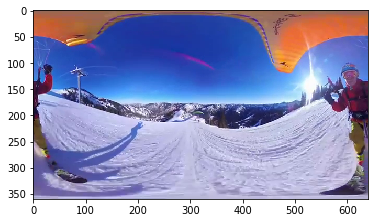

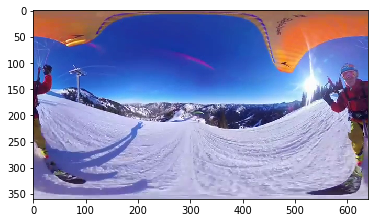

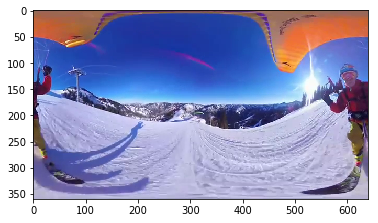

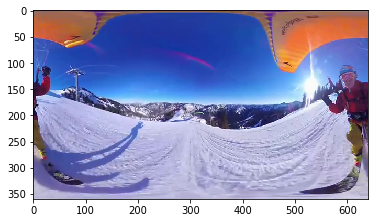

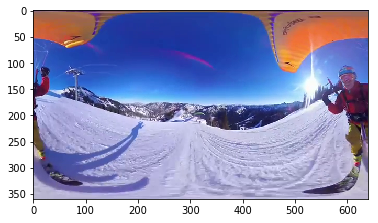

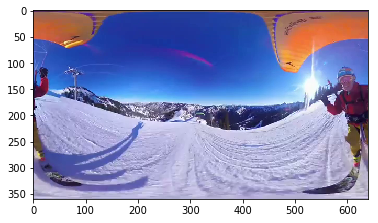

In [27]:
go = True
frames = []
f = 0

while(go):
  print(f)
  if f % 2000 == 0:
    success,image = vidcap.read()
    frames.append(image)
    show(image)
#   sleep(1)
  if f > 10000:
    go = False
  f += 1

In [28]:
frames

[array([[[ 94, 104, 142],
         [ 94, 104, 142],
         [ 93, 103, 141],
         ...,
         [ 88, 104, 152],
         [ 88, 104, 152],
         [ 88, 104, 152]],
 
        [[ 95, 105, 143],
         [ 95, 105, 143],
         [ 94, 104, 142],
         ...,
         [ 88, 104, 152],
         [ 88, 104, 152],
         [ 88, 104, 152]],
 
        [[ 91, 105, 144],
         [ 91, 105, 144],
         [ 90, 103, 145],
         ...,
         [ 90, 104, 152],
         [ 90, 104, 152],
         [ 90, 104, 152]],
 
        ...,
 
        [[196, 165, 166],
         [196, 165, 166],
         [196, 165, 166],
         ...,
         [209, 177, 181],
         [209, 177, 181],
         [209, 177, 181]],
 
        [[196, 170, 170],
         [196, 170, 170],
         [196, 170, 170],
         ...,
         [209, 177, 181],
         [209, 177, 181],
         [209, 177, 181]],
 
        [[207, 181, 181],
         [207, 181, 181],
         [207, 181, 181],
         ...,
         [209, 177, 181],
  

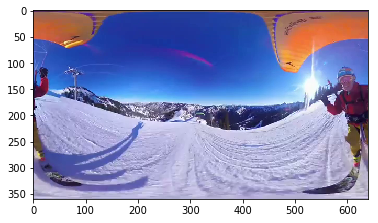

In [32]:
show(frames[-])

In [33]:
len(frames)

6

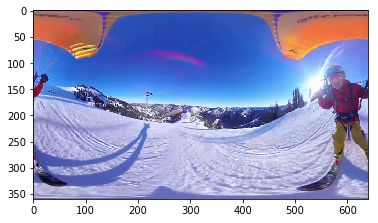

In [15]:
show(image)

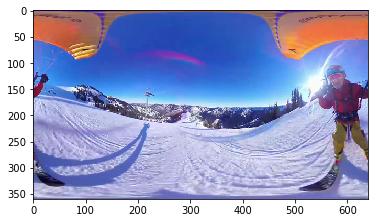

In [6]:
show(image)

In [18]:
np.nan

nan

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


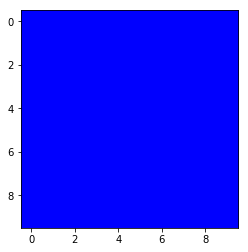

In [49]:
square = np.zeros((10,10,3))
square[:,:,0] = 255
square[:,:,1] = 0
square[:,:,2] = 0
show(square)
square_hsv = rgb2hsv(square)

In [50]:
square_hsv

array([[[  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.]],

       [[  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.]],

       [[  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.]],

       [[  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,   1., 255.],
        [  0.,

In [54]:
image

array([[[135,  46,  93],
        [135,  46,  93],
        [135,  46,  93],
        ...,
        [176,  30,  77],
        [176,  30,  77],
        [176,  30,  77]],

       [[146,  57, 104],
        [146,  57, 104],
        [146,  57, 104],
        ...,
        [189,  43,  90],
        [189,  43,  90],
        [189,  43,  90]],

       [[151, 115, 158],
        [151, 115, 158],
        [151, 115, 158],
        ...,
        [144, 120, 149],
        [144, 120, 149],
        [144, 120, 149]],

       ...,

       [[176, 135, 126],
        [177, 136, 127],
        [182, 141, 132],
        ...,
        [187, 140, 137],
        [191, 144, 141],
        [192, 145, 142]],

       [[179, 117, 105],
        [180, 118, 106],
        [182, 120, 108],
        ...,
        [179, 125, 121],
        [183, 129, 125],
        [184, 130, 126]],

       [[175, 113, 101],
        [176, 114, 102],
        [177, 115, 103],
        ...,
        [167, 113, 109],
        [171, 117, 113],
        [172, 118, 114]]

In [4]:
success,image = vidcap.read()
image = convert(image)
im2, patch,d = IA.place_square(image,0.5,0.5,0.5)
show(im2)
print(d)

NameError: name 'convert' is not defined

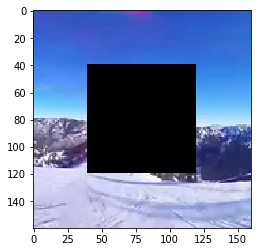

In [83]:
show(patch)

0.7766760755014437


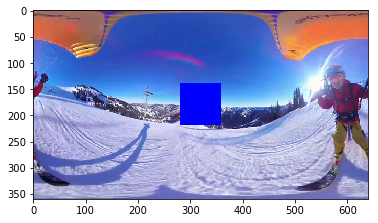

In [84]:
# Example with a blue square
success,image = vidcap.read()
image = convert(image)
im2, patch,d = IA.place_square(image,0.0,0.0,1.0)
show(im2)
print(d)

0.9425750228414852


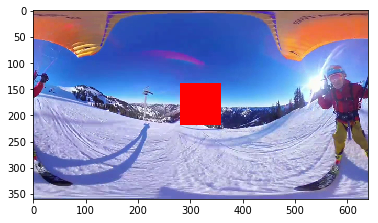

In [85]:
# Example with a red square
success,image = vidcap.read()
image = convert(image)
im2, patch,d = IA.place_square(image,1,0.0,0.0)
show(im2)
print(d)

In [18]:
# Colours
colours = []
colours.append([1, 176, 0])
colours.append([88, 192, 23])
colours.append([0, 214, 245])
colours.append([ 10,  144,  59])
colours.append([0, 75, 255])
colours.append([56, 8, 122])

#Warm colours

colours.append([224, 215, 26])
colours.append([245, 0, 2])
colours.append([255, 0, 136])
colours.append([ 112, 29, 0])
colours.append([ 191, 33, 3])
colours.append([ 166, 12, 96])

colours
len(colours)

for col in colours:
  for i in range(3):
    col[i] = col[i]/255.0
colours

[[0.00392156862745098, 0.6901960784313725, 0.0],
 [0.34509803921568627, 0.7529411764705882, 0.09019607843137255],
 [0.0, 0.8392156862745098, 0.9607843137254902],
 [0.0392156862745098, 0.5647058823529412, 0.23137254901960785],
 [0.0, 0.29411764705882354, 1.0],
 [0.2196078431372549, 0.03137254901960784, 0.47843137254901963],
 [0.8784313725490196, 0.8431372549019608, 0.10196078431372549],
 [0.9607843137254902, 0.0, 0.00784313725490196],
 [1.0, 0.0, 0.5333333333333333],
 [0.4392156862745098, 0.11372549019607843, 0.0],
 [0.7490196078431373, 0.12941176470588237, 0.011764705882352941],
 [0.6509803921568628, 0.047058823529411764, 0.3764705882352941]]

In [16]:
# Loop over the images

initial_delay = 5 # Delay until first
delay = 5

0


ValueError: cannot convert float NaN to integer

> /Users/fintan/Dropbox/City/Gozde/image_analysis.py(26)place_square()
     24   im[y-r:y+r,x-r:x+r,:] = [R,G,B]
     25   im_copy = im.copy()
---> 26   im_copy[y-r:y+r,x-r:x+r,:] = np.nan
     27 
     28   patch = im_copy[y-n:y+n,x-n:x+n,:]

ipdb> c


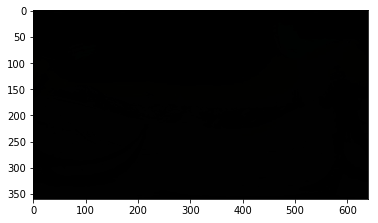

In [20]:
# Loop over the images, loading them and doing the analysis

delay = initial_delay
go = True

trial = 0
while go:
  seconds = trial * delay
  frame_number = seconds * 30 # fps = 30
  print(frame_number)
  filename = f"frames/frame{frame_number:04}.jpg"
  image = imread(filename)
  show(image)
  
  cr = colours[trial][0]
  cg = colours[trial][1]
  cb = colours[trial][2]
  im2, patch,d = IA.place_square(image,1,0.0,0.0)
  show(im2)
  
  if trial > 2:
    go = False
  trial += 1

0


ValueError: cannot convert float NaN to integer

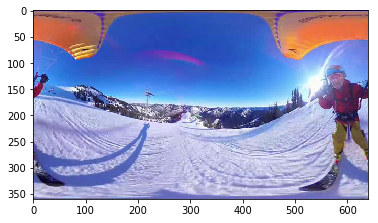

In [19]:
# Loop over the images, loading them and doing the analysis

# Also write out to file

folder = 'video_1/'

# Loop over the images, loading them and doing the analysis

delay = initial_delay
go = True

trial = 0
while go:
  seconds = trial * delay
  frame_number = seconds * 30 # fps = 30
  print(frame_number)
  filename = f"frames/frame{frame_number:04}.jpg"
  image = imread(filename)
  show(image)
  
  cr = colours[trial][0]
  cg = colours[trial][1]
  cb = colours[trial][2]
  im2, patch,d = IA.place_square(image,cr,cg,cb)
  show(im2)
  
  imsave(folder+f"trial_{frame_number:04}.png")
  
  
  if trial > 2:
    go = False
  trial += 1

In [18]:
%pdb

Automatic pdb calling has been turned ON


0
150
300
450
600
750
900
1050
1200
1350
1500
1650


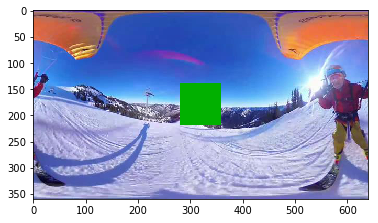

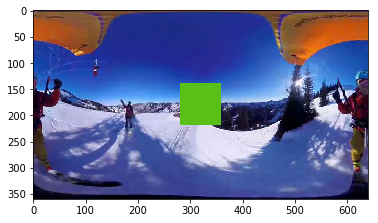

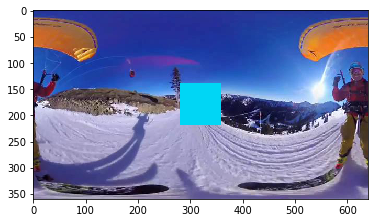

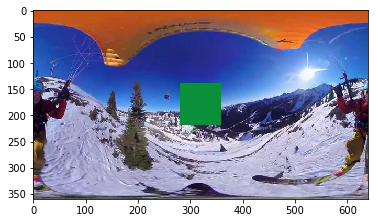

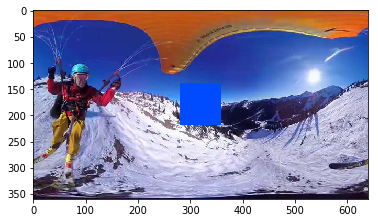

...

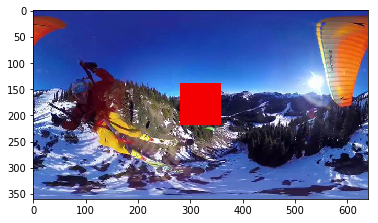

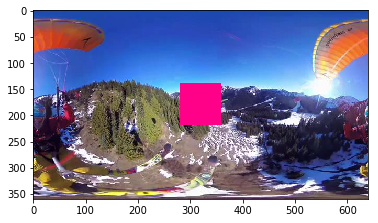

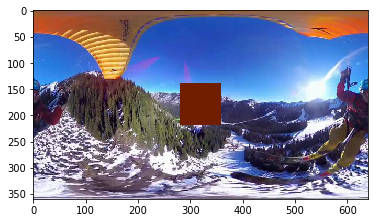

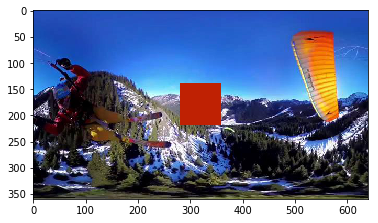

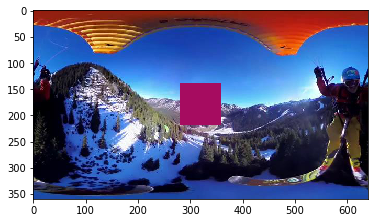

In [28]:
# Loop over the images, loading them and doing the analysis
# With float images so can use NaN
# Also write out to file

folder = 'video_1/'

# Loop over the images, loading them and doing the analysis

delay = initial_delay
go = True

trial = 0
while go:
  seconds = trial * delay
  frame_number = seconds * 30 # fps = 30
  print(frame_number)
  filename = f"frames/frame{frame_number:04}.jpg"
  image = imread(filename)
  image = skimage.img_as_float(image)
  #show(image)
  
  cr = colours[trial][0]
  cg = colours[trial][1]
  cb = colours[trial][2]
  im2, patch,d = IA.place_square(image,cr,cg,cb)
  show(im2)
  im2 = skimage.img_as_ubyte(im2)
  imsave(folder+f"trial_{trial}_frame_{frame_number:04}.png", im2)
  
  trial += 1
  if trial > 11:
    go = False


In [26]:
trial

12

In [34]:
image = imread(filename)

In [35]:
image

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)